In [4]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


# 1. Downloading *gensim* and *pyLDAvis* libraries

In [7]:
!pip install gensim

In [6]:
!pip install pyLDAvis

     |████████████████████████████████| 1.6MB 33.9MB/s 
     |████████████████████████████████| 552kB 50.8MB/s 
  Created wheel for pyLDAvis: filename=pyLDAvis-2.1.2-py2.py3-none-any.whl size=97711 sha256=1f1733d61aee4b83908047911b1507029cf077e106f6bd2b6c8b797ae6af72c9
  Stored in directory: /root/.cache/pip/wheels/98/71/24/513a99e58bb6b8465bae4d2d5e9dba8f0bef8179e3051ac414
  Created wheel for funcy: filename=funcy-1.14-py2.py3-none-any.whl size=32042 sha256=5cc9d727946793068fce9639aa8614cb1b790f40f1b3ffded8218069a21de11c
  Stored in directory: /root/.cache/pip/wheels/20/5a/d8/1d875df03deae6f178dfdf70238cca33f948ef8a6f5209f2eb
Successfully built pyLDAvis funcy


# 2. Importing libraries

In [0]:
import gensim
import numpy as np
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize
from gensim import corpora,models
import pprint
import matplotlib.pyplot as plt
import seaborn as sns
from gensim.models import CoherenceModel
import pyLDAvis.gensim
import pickle 
import pyLDAvis
from scipy.sparse import dok_matrix
from scipy.sparse import csr_matrix, issparse
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_colwidth', 150)
pd.set_option('display.max_columns', 10)
pd.set_option('display.width', 1000)

# 3. Loading data and creating corpus

In [5]:
df = pd.read_csv('/content/drive/My Drive/cleaned_preprocessed_dataset_with_only_nouns_and_title.csv',index_col=0)
df = df.iloc[:100000,:]
df.head()

,Title
0,check image mime type
1,prevent firefox press ctrl-w
2,r error type list
3,character url
4,contact detail


In order to perform LDA, we first need to conver the documents from string format to tokenized format. 

In [6]:
df['Title'] = df['Title'].apply(lambda x: str(x).split(' '))
df.head()

,Title
0,"[check, image, mime, type]"
1,"[prevent, firefox, press, ctrl-w]"
2,"[r, error, type, list]"
3,"[character, url]"
4,"[contact, detail]"


We now convert the text documents into a *dictionary* consisting of all unique words in the dataset. The representation consists of each unique word accompanied by a unique ID. 

In [0]:
dictionary = corpora.Dictionary(df['Title'])

Below, we can see the first 11 instances in the dictionary showing the IDs and the words.

In [0]:
count = 0
for k, v in dictionary.iteritems():
    print(k, v)
    count += 1
    if count > 10:
        break

0 check
1 image
2 mime
3 type
4 ctrl-w
5 firefox
6 press
7 prevent
8 error
9 list
10 r


Below, we use this dictionary of unique words to convert the dataset containing the documents to the bag of words (BOW) representation, also known as the *corpus*. 

In [0]:
#Converting the dataset into the bag of words format
corpus = [dictionary.doc2bow(doc) for doc in df['Title']]

The corpus contains IDs representing each token and the frequency of that token in each document. Below, we can see the first 20 instances of the corpus. These 20 instances represent the first 20 documents in the BOW format. 

In [0]:
corpus[:20]

[[(0, 1), (1, 1), (2, 1), (3, 1)],
 [(4, 1), (5, 1), (6, 1), (7, 1)],
 [(3, 1), (8, 1), (9, 1), (10, 1)],
 [(11, 1), (12, 1)],
 [(13, 1), (14, 1)],
 [(15, 1), (16, 1)],
 [(17, 1), (18, 1), (19, 1), (20, 1)],
 [(21, 1), (22, 1), (23, 1), (24, 1)],
 [(25, 1), (26, 1)],
 [(27, 1), (28, 1), (29, 1), (30, 1), (31, 1), (32, 1)],
 [(33, 1), (34, 1), (35, 1), (36, 1), (37, 1)],
 [(38, 1), (39, 1), (40, 1)],
 [(41, 1), (42, 1)],
 [(43, 1)],
 [(44, 1), (45, 2)],
 [(46, 1), (47, 1), (48, 1)],
 [(10, 1), (49, 1), (50, 1), (51, 1)],
 [(52, 1), (53, 1), (54, 1)],
 [(26, 1), (47, 1), (55, 1), (56, 1), (57, 1), (58, 1)],
 [(50, 1), (59, 1), (60, 1), (61, 1), (62, 1), (63, 1)]]

In [9]:
tfidf = models.TfidfModel(corpus)
corpus_tfidf = tfidf[corpus]
count = 0
for i in corpus_tfidf:
  count = count + 1
  print (i)
  if count > 10:  
    break
#corpus_tfidf = csr_matrix(corpus_tfidf)
#print (corpus_tfidf.toarray()[0])

[(0, 0.4324362285170671), (1, 0.3400147007278977), (2, 0.7352512076370518), (3, 0.39597294506457137)]
[(4, 0.7307555258428255), (5, 0.38586296208285703), (6, 0.42741204360605), (7, 0.36664026091431823)]
[(3, 0.4910368453884094), (8, 0.39654357171903315), (9, 0.4472752142445557), (10, 0.6337041067578765)]
[(11, 0.6511999331492017), (12, 0.758906217570047)]
[(13, 0.703350259697448), (14, 0.7108434512489599)]
[(15, 0.6496168765377784), (16, 0.7602617402692975)]
[(17, 0.5965129297338804), (18, 0.6390460225330046), (19, 0.4152995160670111), (20, 0.2516323065497668)]
[(21, 0.3811539407504564), (22, 0.5980675041399135), (23, 0.5576527062334482), (24, 0.4313471840324957)]
[(25, 0.7956451687365886), (26, 0.605762961451198)]
[(27, 0.2930988459474298), (28, 0.58056770893597), (29, 0.49047127193549894), (30, 0.43041799881802806), (31, 0.25796809676170995), (32, 0.29097240521692525)]
[(33, 0.24956987590763943), (34, 0.28044339911957505), (35, 0.5343913508627418), (36, 0.5686260503574477), (37, 0.50

# 4. Modeling using Latent Dirichlet Allocation

# 4.12 TFIDF => no_below=10, no_above=0.5, keep_n=1000, topics=20, passes=10 **BASELINE MODEL**

Streaming output truncated to the last 5000 lines.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Us

[(0,
  '0.068*"query" + 0.051*".net" + 0.051*"need" + 0.049*"help" + 0.045*"studio" '
  '+ 0.043*"event" + 0.042*"django" + 0.040*"variables" + 0.036*"sort" + '
  '0.034*"join"'),
 (1,
  '0.160*"work" + 0.068*"page" + 0.053*"content" + 0.048*"search" + '
  '0.039*"output" + 0.038*"connection" + 0.036*"character" + 0.030*"browser" + '
  '0.029*"word" + 0.027*"cache"'),
 (2,
  '0.105*"windows" + 0.073*"return" + 0.054*"question" + 0.053*"group" + '
  '0.043*"ios" + 0.042*"facebook" + 0.038*"store" + 0.035*"record" + '
  '0.035*"api" + 0.033*"parse"'),
 (3,
  '0.112*"code" + 0.093*"call" + 0.069*"c++" + 0.048*"loop" + 0.046*"value" + '
  '0.043*"css" + 0.043*"element" + 0.027*"excel" + 0.024*"import" + '
  '0.023*"place"'),
 (4,
  '0.047*"php" + 0.046*"system" + 0.037*"property" + 0.034*"session" + '
  '0.034*"menu" + 0.033*"date" + 0.033*"start" + 0.032*"limit" + '
  '0.031*"document" + 0.030*"crash"'),
 (5,
  '0.122*"list" + 0.080*"load" + 0.079*"show" + 0.045*"html" + 0.044*"request" '

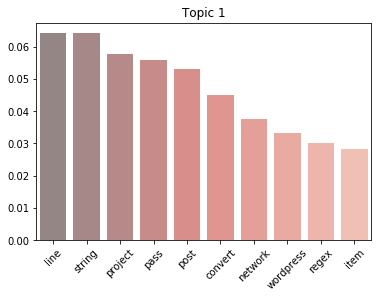

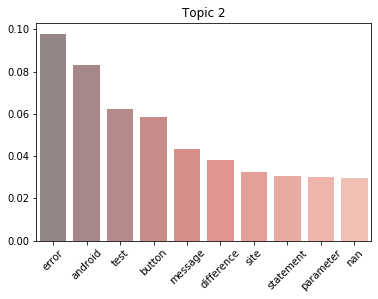

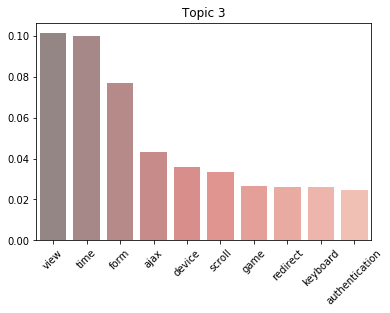

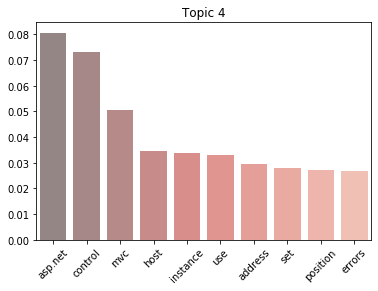

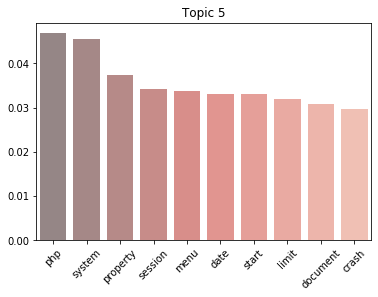

...

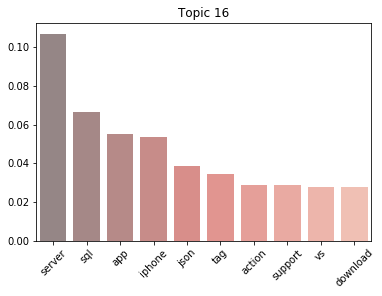

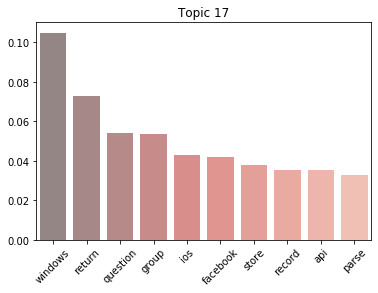

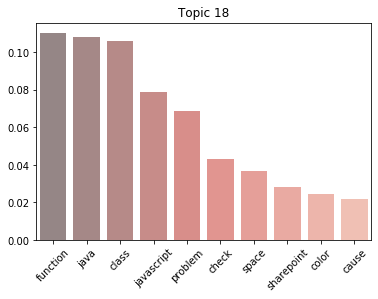

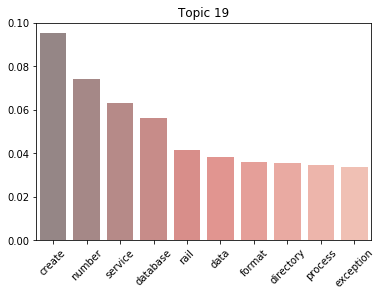

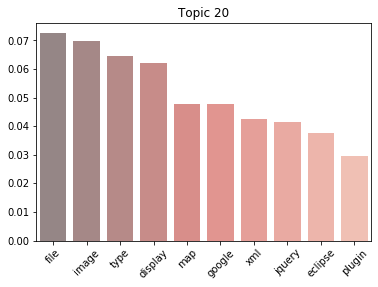

In [0]:
dictionary = corpora.Dictionary(df['Title'])
dictionary.filter_extremes(no_below=10, no_above=0.5, keep_n=1000)
corpus = [dictionary.doc2bow(doc) for doc in df['Title']]
tfidf = models.TfidfModel(corpus)
corpus_tfidf = tfidf[corpus]
lda = gensim.models.ldamodel.LdaModel(corpus_tfidf,num_topics=20,id2word=dictionary,passes=10)
pprint.pprint (lda.print_topics())

#Printing the topic coherence scores
for i in range(len(lda.print_topics())):
  print ("Topic ",str(i+1),": ")
  pprint.pprint (lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary)[-i-1][1])

#Printing the word distributions in each topic
for i in range(len(lda.print_topics())):
  plt.figure()
  unzip = list(zip(*lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary,topn=10)[-i-1][0]))
  sns.barplot(x=list(unzip[1]),y=list(unzip[0]),palette='Reds_d',alpha=0.6)
  plt.title('Topic '+str(i+1))
  plt.xticks(rotation=45)

In [0]:
lda.save('/content/drive/My Drive/lda_4.12.gensim')

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


# 4.13 TFIDF => no_below=10, no_above=0.5, keep_n=1000, topics=50, passes=10

[(11,
  '0.231*"line" + 0.080*"force" + 0.069*"columns" + 0.063*"bash" + '
  '0.063*"build" + 0.057*"resource" + 0.041*"popup" + 0.040*"audio" + '
  '0.035*"focus" + 0.033*"clause"'),
 (3,
  '0.120*"facebook" + 0.102*"point" + 0.082*"statement" + 0.080*"cache" + '
  '0.071*"information" + 0.062*"library" + 0.061*"drop" + 0.056*"setup" + '
  '0.052*"level" + 0.033*"callback"'),
 (18,
  '0.124*"generate" + 0.112*"css" + 0.097*"session" + 0.082*"machine" + '
  '0.079*"domain" + 0.059*"place" + 0.056*"implement" + 0.042*"checkbox" + '
  '0.040*"feature" + 0.039*"fix"'),
 (43,
  '0.257*"page" + 0.088*"elements" + 0.084*"web" + 0.073*"wordpress" + '
  '0.064*"filter" + 0.062*"fail" + 0.062*"design" + 0.052*"computer" + '
  '0.048*"handle" + 0.039*"linq"'),
 (44,
  '0.275*"query" + 0.127*"exception" + 0.096*"regex" + 0.060*"dialog" + '
  '0.055*"configuration" + 0.036*"float" + 0.035*"exist" + 0.031*"extract" + '
  '0.031*"specify" + 0.030*"azure"'),
 (21,
  '0.237*"rail" + 0.129*"ajax" + 0.1

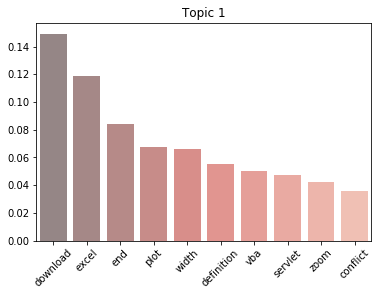

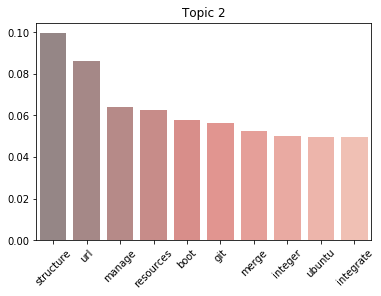

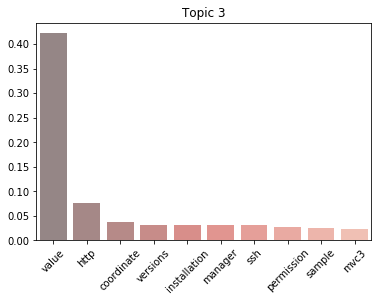

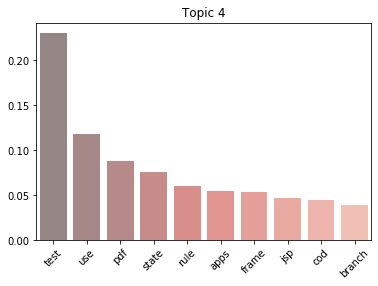

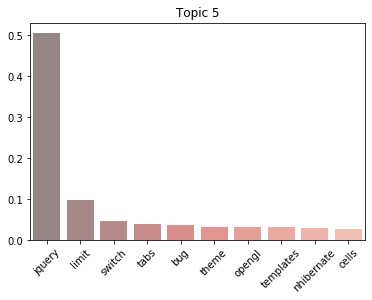

...

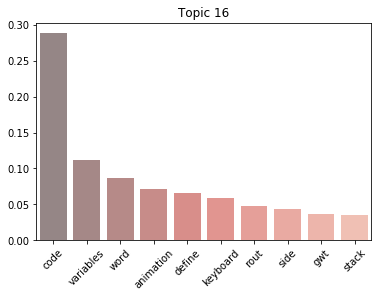

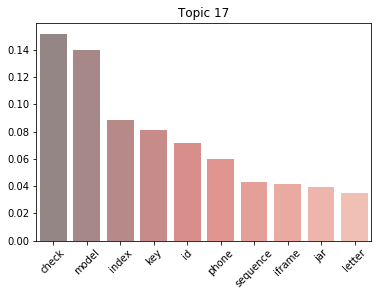

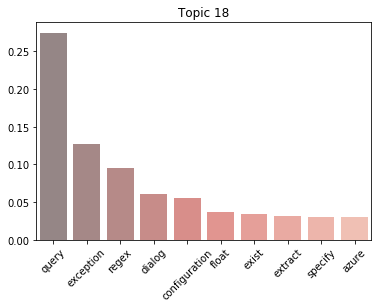

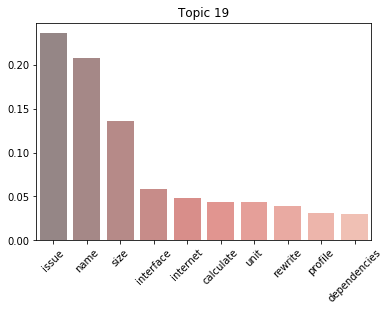

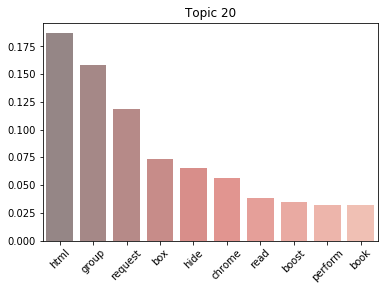

In [0]:
#title
dictionary = corpora.Dictionary(df['Title'])
dictionary.filter_extremes(no_below=10, no_above=0.5, keep_n=1000)
corpus = [dictionary.doc2bow(doc) for doc in df['Title']]
tfidf = models.TfidfModel(corpus)
corpus_tfidf = tfidf[corpus]
lda = gensim.models.ldamodel.LdaModel(corpus_tfidf,num_topics=50,id2word=dictionary,passes=10)
pprint.pprint (lda.print_topics())

#Printing the topic coherence scores
for i in range(len(lda.print_topics())):
  print ("Topic ",str(i+1),": ")
  pprint.pprint (lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary)[-i-1][1])

#Printing the word distributions in each topic
for i in range(len(lda.print_topics())):
  plt.figure()
  unzip = list(zip(*lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary,topn=10)[-i-1][0]))
  sns.barplot(x=list(unzip[1]),y=list(unzip[0]),palette='Reds_d',alpha=0.6)
  plt.title('Topic '+str(i+1))
  plt.xticks(rotation=45)

In [0]:
lda.save('/content/drive/My Drive/lda_4.13.gensim')

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


# 4.14 TFIDF => no_below=10, no_above=0.5, keep_n=1000, topics=100, passes=10

/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1023: RuntimeWarning: divide by zero encountered in log
  diff = np.log(self.expElogbeta)


[(62,
  '0.240*"connection" + 0.229*"network" + 0.178*"spring" + 0.135*"library" + '
  '0.078*"constructor" + 0.056*"leak" + 0.043*"sqlite" + 0.033*"memory" + '
  '0.000*"debug" + 0.000*"adobe"'),
 (66,
  '0.304*"web" + 0.189*"index" + 0.171*"bind" + 0.135*"connect" + '
  '0.094*"html5" + 0.064*"widget" + 0.034*"put" + 0.000*"nhibernate" + '
  '0.000*"debug" + 0.000*"adobe"'),
 (39,
  '0.607*"javascript" + 0.078*"resource" + 0.072*"conversion" + '
  '0.066*"repository" + 0.063*"integer" + 0.056*"ssl" + 0.026*"please" + '
  '0.025*"reader" + 0.000*"debug" + 0.000*"nhibernate"'),
 (95,
  '0.304*"studio" + 0.220*"limit" + 0.201*"cache" + 0.087*"textbox" + '
  '0.086*"int" + 0.058*"deny" + 0.035*"translate" + 0.000*"nhibernate" + '
  '0.000*"jpa" + 0.000*"as3"'),
 (42,
  '0.219*"attribute" + 0.168*"excel" + 0.142*"disk" + 0.136*"state" + '
  '0.086*"panel" + 0.082*"section" + 0.061*"namespace" + 0.050*"xpath" + '
  '0.048*"encryption" + 0.000*"debug"'),
 (61,
  '0.221*"post" + 0.187*"syste

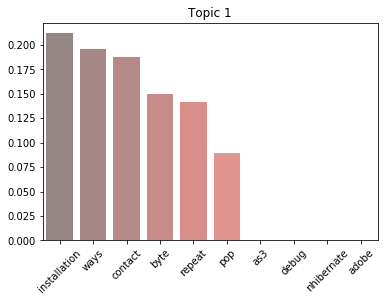

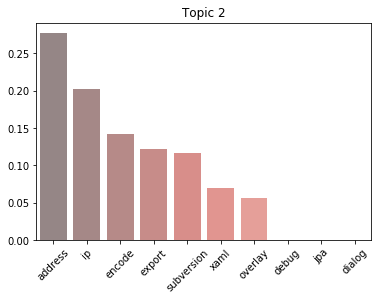

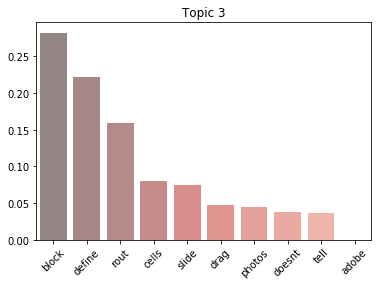

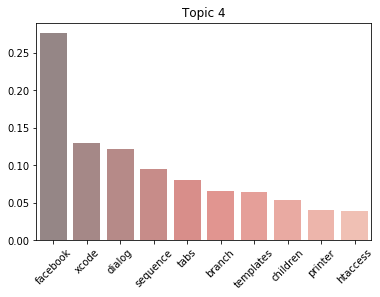

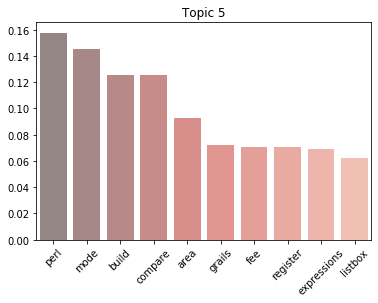

...

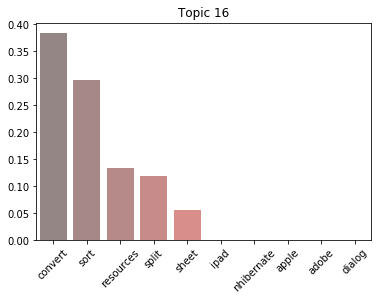

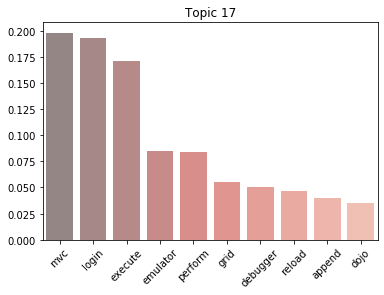

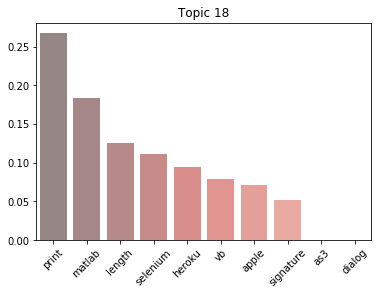

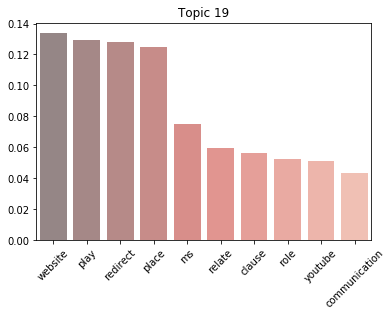

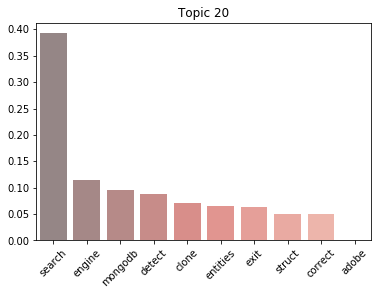

In [0]:
dictionary = corpora.Dictionary(df['Title'])
dictionary.filter_extremes(no_below=10, no_above=0.5, keep_n=1000)
corpus = [dictionary.doc2bow(doc) for doc in df['Title']]
tfidf = models.TfidfModel(corpus)
corpus_tfidf = tfidf[corpus]
lda = gensim.models.ldamodel.LdaModel(corpus_tfidf,num_topics=100,id2word=dictionary,passes=10)
pprint.pprint (lda.print_topics())

#Printing the topic coherence scores
for i in range(len(lda.print_topics())):
  print ("Topic ",str(i+1),": ")
  pprint.pprint (lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary)[-i-1][1])

#Printing the word distributions in each topic
for i in range(len(lda.print_topics())):
  plt.figure()
  unzip = list(zip(*lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary,topn=10)[-i-1][0]))
  sns.barplot(x=list(unzip[1]),y=list(unzip[0]),palette='Reds_d',alpha=0.6)
  plt.title('Topic '+str(i+1))
  plt.xticks(rotation=45)

# 4.15 TFIDF => no_below=10, no_above=0.5, keep_n=1000, topics=200, passes=10

/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1023: RuntimeWarning: divide by zero encountered in log
  diff = np.log(self.expElogbeta)


[(5,
  '0.331*"transaction" + 0.263*"chart" + 0.209*"commit" + 0.182*"max" + '
  '0.000*"jpa" + 0.000*"debug" + 0.000*"nhibernate" + 0.000*"adobe" + '
  '0.000*"as3" + 0.000*"ipad"'),
 (143,
  '0.746*"parse" + 0.144*"paths" + 0.096*"svg" + 0.000*"nhibernate" + '
  '0.000*"as3" + 0.000*"adobe" + 0.000*"dialog" + 0.000*"debug" + '
  '0.000*"directories" + 0.000*"redirect"'),
 (183,
  '0.434*"x" + 0.143*"ubuntu" + 0.116*"selection" + 0.090*"volume" + '
  '0.080*"mount" + 0.073*"restart" + 0.057*"vm" + 0.000*"understand" + '
  '0.000*"redirect" + 0.000*"as3"'),
 (168,
  '0.608*"elements" + 0.263*"environment" + 0.120*"cast" + 0.000*"dialog" + '
  '0.000*"nhibernate" + 0.000*"directories" + 0.000*"compile" + 0.000*"adobe" '
  '+ 0.000*"upload" + 0.000*"understand"'),
 (19,
  '0.503*"base" + 0.318*"tool" + 0.118*"ssh" + 0.055*"mvvm" + 0.000*"ipad" + '
  '0.000*"apple" + 0.000*"jpa" + 0.000*"as3" + 0.000*"understand" + '
  '0.000*"redirect"'),
 (50,
  '0.238*"emulator" + 0.224*"calendar" + 0.

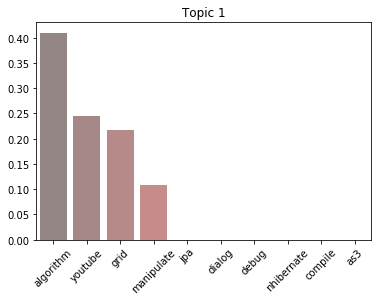

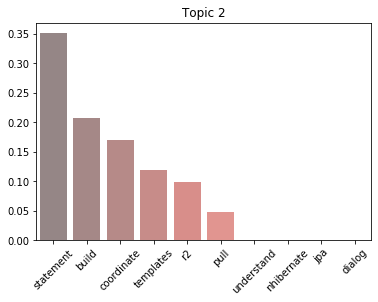

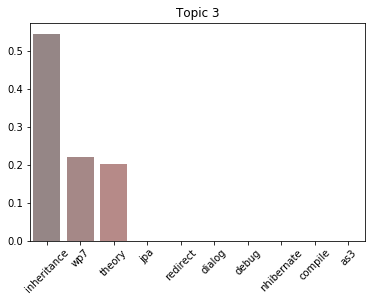

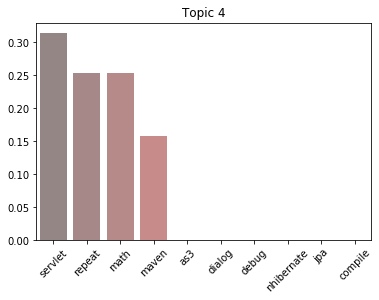

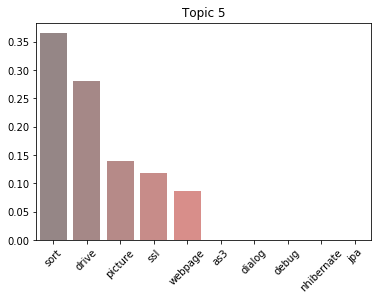

...

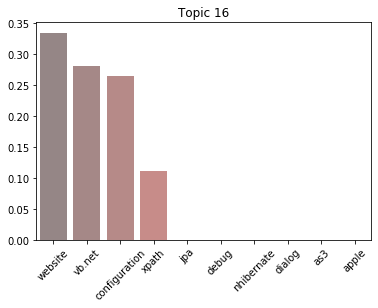

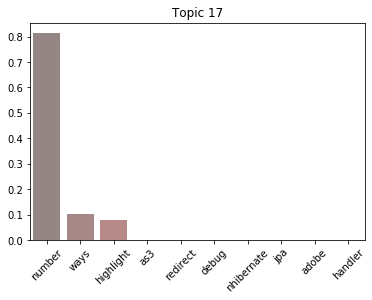

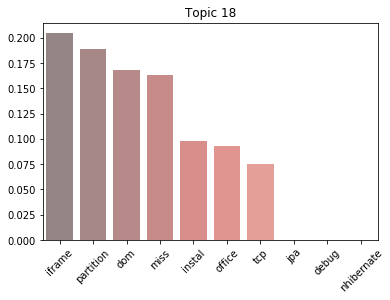

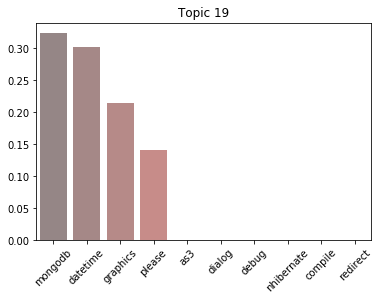

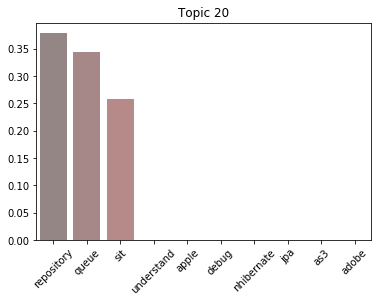

In [0]:
dictionary = corpora.Dictionary(df['Title'])
dictionary.filter_extremes(no_below=10, no_above=0.5, keep_n=1000)
corpus = [dictionary.doc2bow(doc) for doc in df['Title']]
tfidf = models.TfidfModel(corpus)
corpus_tfidf = tfidf[corpus]
lda = gensim.models.ldamodel.LdaModel(corpus_tfidf,num_topics=200,id2word=dictionary,passes=10)
pprint.pprint (lda.print_topics())

#Printing the topic coherence scores
for i in range(len(lda.print_topics())):
  print ("Topic ",str(i+1),": ")
  pprint.pprint (lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary)[-i-1][1])

#Printing the word distributions in each topic
for i in range(len(lda.print_topics())):
  plt.figure()
  unzip = list(zip(*lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary,topn=10)[-i-1][0]))
  sns.barplot(x=list(unzip[1]),y=list(unzip[0]),palette='Reds_d',alpha=0.6)
  plt.title('Topic '+str(i+1))
  plt.xticks(rotation=45)

In [0]:
lda.save('/content/drive/My Drive/lda_4.15.gensim')

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


# 4.16 TFIDF => no_below=10, no_above=0.5, keep_n=1000, topics=150, passes=10

/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1023: RuntimeWarning: divide by zero encountered in log
  diff = np.log(self.expElogbeta)


[(90,
  '0.358*"display" + 0.279*"group" + 0.117*"define" + 0.094*"break" + '
  '0.089*"js" + 0.058*"throw" + 0.000*"as3" + 0.000*"dialog" + 0.000*"debug" + '
  '0.000*"nhibernate"'),
 (138,
  '0.257*"mail" + 0.244*"parent" + 0.195*"child" + 0.139*"home" + '
  '0.110*"theorem" + 0.045*"distribute" + 0.000*"dialog" + 0.000*"debug" + '
  '0.000*"nhibernate" + 0.000*"jpa"'),
 (56,
  '0.656*"error" + 0.224*"map" + 0.081*"authentication" + 0.035*"listbox" + '
  '0.000*"nhibernate" + 0.000*"compile" + 0.000*"adobe" + 0.000*"dialog" + '
  '0.000*"debug" + 0.000*"understand"'),
 (75,
  '0.290*"object" + 0.197*"generate" + 0.168*"point" + 0.131*"cache" + '
  '0.113*"collection" + 0.060*"mean" + 0.038*"exit" + 0.000*"jpa" + '
  '0.000*"debug" + 0.000*"nhibernate"'),
 (135,
  '0.260*"character" + 0.254*"source" + 0.148*"url" + 0.146*"import" + '
  '0.084*"ms" + 0.060*"cookie" + 0.043*"controllers" + 0.000*"understand" + '
  '0.000*"redirect" + 0.000*"compile"'),
 (114,
  '0.654*"value" + 0.123*"s

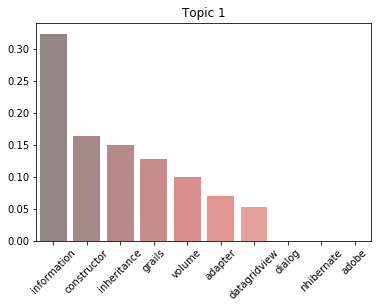

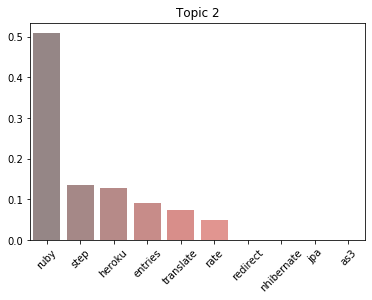

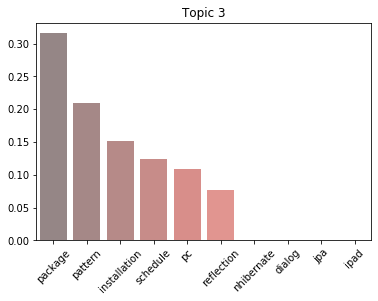

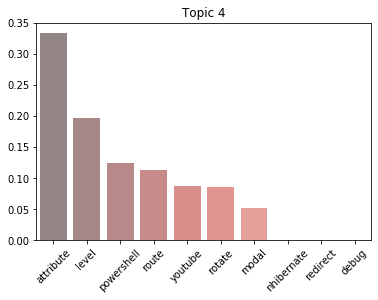

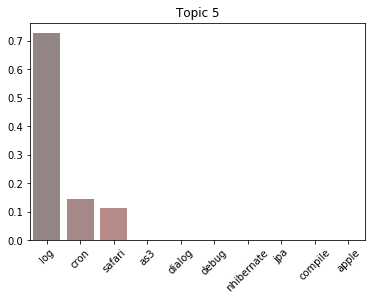

...

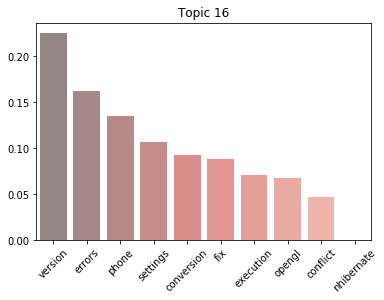

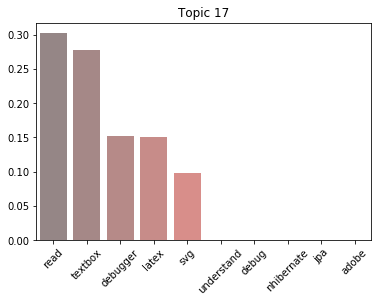

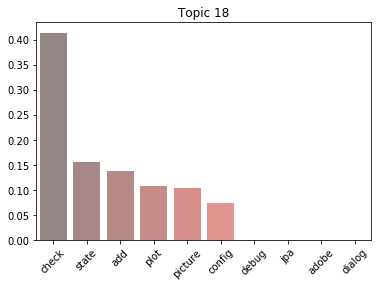

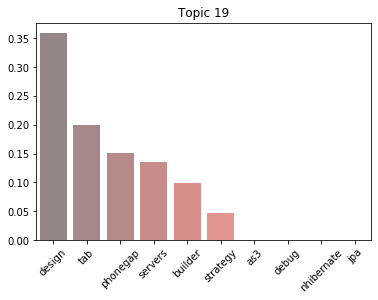

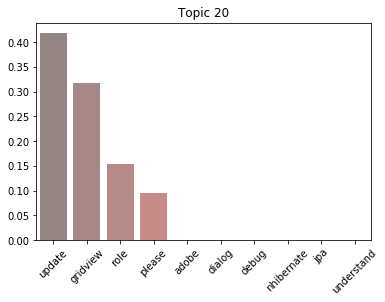

In [0]:
dictionary = corpora.Dictionary(df['Title'])
dictionary.filter_extremes(no_below=10, no_above=0.5, keep_n=1000)
corpus = [dictionary.doc2bow(doc) for doc in df['Title']]
tfidf = models.TfidfModel(corpus)
corpus_tfidf = tfidf[corpus]
lda = gensim.models.ldamodel.LdaModel(corpus_tfidf,num_topics=150,id2word=dictionary,passes=10)
pprint.pprint (lda.print_topics())

#Printing the topic coherence scores
for i in range(len(lda.print_topics())):
  print ("Topic ",str(i+1),": ")
  pprint.pprint (lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary)[-i-1][1])

#Printing the word distributions in each topic
for i in range(len(lda.print_topics())):
  plt.figure()
  unzip = list(zip(*lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary,topn=10)[-i-1][0]))
  sns.barplot(x=list(unzip[1]),y=list(unzip[0]),palette='Reds_d',alpha=0.6)
  plt.title('Topic '+str(i+1))
  plt.xticks(rotation=45)

In [0]:
lda.save('/content/drive/My Drive/lda_4.16.gensim')

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


# 4.17 Bag of words => no_below=10, no_above=0.5, keep_n=1000, topics=50, passes=10

[(37,
  '0.284*"change" + 0.095*"framework" + 0.083*"studio" + 0.064*"action" + '
  '0.058*"instance" + 0.055*"match" + 0.046*"report" + 0.044*"part" + '
  '0.029*"settings" + 0.028*"resource"'),
 (21,
  '0.147*"eclipse" + 0.116*"host" + 0.089*"statement" + 0.072*"connect" + '
  '0.071*"import" + 0.062*"game" + 0.053*"bash" + 0.035*"scala" + '
  '0.034*"chart" + 0.034*"write"'),
 (18,
  '0.173*"type" + 0.144*"object" + 0.107*"size" + 0.091*"generate" + '
  '0.090*"convert" + 0.081*"connection" + 0.039*"layout" + 0.034*"auto" + '
  '0.029*"upload" + 0.028*"get"'),
 (7,
  '0.168*"search" + 0.150*"column" + 0.098*"validation" + 0.093*"spring" + '
  '0.085*"folder" + 0.046*"implementation" + 0.037*"ms" + 0.037*"integration" '
  '+ 0.035*"constructor" + 0.025*"reverse"'),
 (6,
  '0.286*"array" + 0.209*"show" + 0.077*"document" + 0.076*"word" + '
  '0.056*"run" + 0.046*"shell" + 0.024*"queue" + 0.021*"relate" + 0.019*"make" '
  '+ 0.018*"statements"'),
 (46,
  '0.305*"image" + 0.196*"query" 

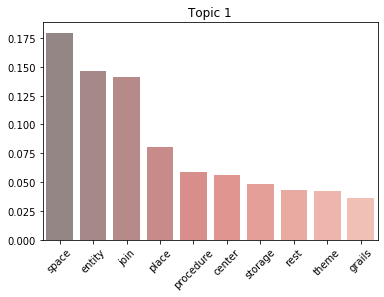

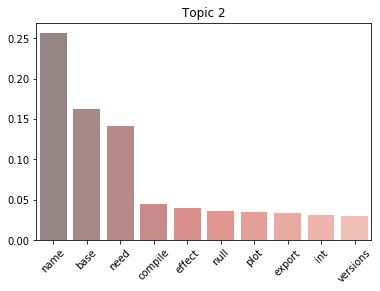

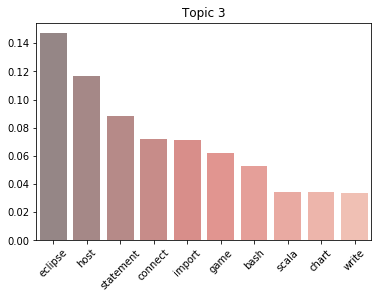

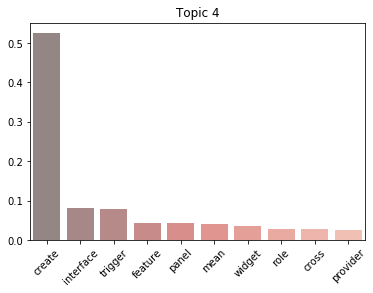

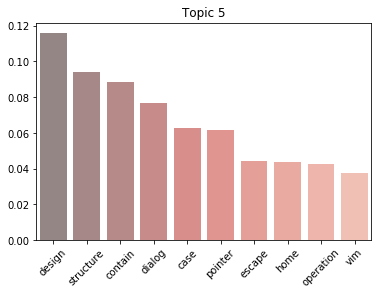

...

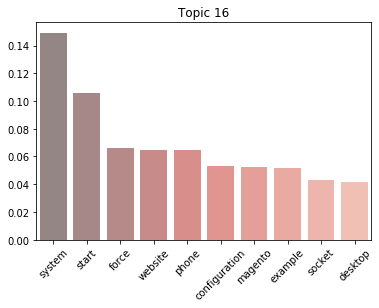

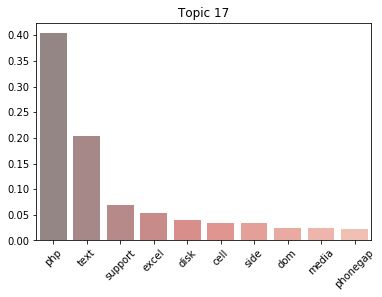

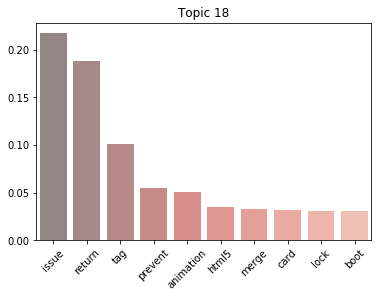

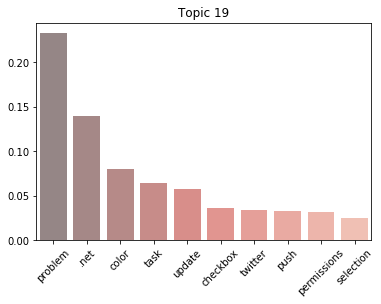

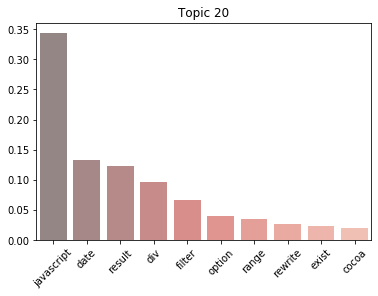

In [0]:
dictionary = corpora.Dictionary(df['Title'])
dictionary.filter_extremes(no_below=10, no_above=0.5, keep_n=1000)
corpus = [dictionary.doc2bow(doc) for doc in df['Title']]
lda = gensim.models.ldamodel.LdaModel(corpus,num_topics=50,id2word=dictionary,passes=10)
pprint.pprint (lda.print_topics())

#Printing the topic coherence scores
for i in range(len(lda.print_topics())):
  print ("Topic ",str(i+1),": ")
  pprint.pprint (lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary)[-i-1][1])

#Printing the word distributions in each topic
for i in range(len(lda.print_topics())):
  plt.figure()
  unzip = list(zip(*lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary,topn=10)[-i-1][0]))
  sns.barplot(x=list(unzip[1]),y=list(unzip[0]),palette='Reds_d',alpha=0.6)
  plt.title('Topic '+str(i+1))
  plt.xticks(rotation=45)

In [0]:
lda.save('/content/drive/My Drive/lda_4.17.gensim')

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


# 4.18 Bag of words => no_below=10, no_above=0.5, keep_n=1000, topics=100, passes=10

/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1023: RuntimeWarning: divide by zero encountered in log
  diff = np.log(self.expElogbeta)


[(13,
  '0.166*"css" + 0.150*"ajax" + 0.098*"information" + 0.092*"header" + '
  '0.084*"wcf" + 0.056*"navigation" + 0.054*"card" + 0.049*"permissions" + '
  '0.037*"symbol" + 0.037*"photo"'),
 (18,
  '0.654*"mysql" + 0.088*"encode" + 0.074*"player" + 0.073*"usage" + '
  '0.070*"throw" + 0.036*"flow" + 0.000*"jpa" + 0.000*"dialog" + 0.000*"debug" '
  '+ 0.000*"nhibernate"'),
 (58,
  '0.406*"image" + 0.362*"windows" + 0.081*"limit" + 0.039*"resource" + '
  '0.028*"ssl" + 0.027*"phonegap" + 0.025*"cod" + 0.018*"expressions" + '
  '0.012*"gcc" + 0.000*"adobe"'),
 (90,
  '0.350*"software" + 0.290*"look" + 0.176*"node" + 0.095*"languages" + '
  '0.076*"encrypt" + 0.000*"jpa" + 0.000*"dialog" + 0.000*"debug" + '
  '0.000*"compile" + 0.000*"nhibernate"'),
 (67,
  '0.301*"text" + 0.231*"line" + 0.135*"output" + 0.095*"http" + 0.049*"title" '
  '+ 0.041*"twitter" + 0.035*"sum" + 0.030*"proof" + 0.023*"youtube" + '
  '0.021*"protocol"'),
 (92,
  '0.283*"linux" + 0.242*"elements" + 0.183*"match" 

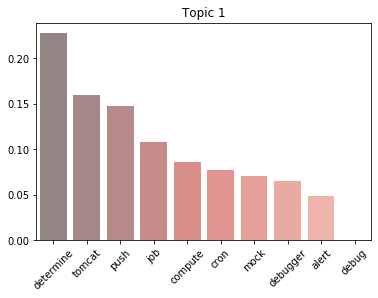

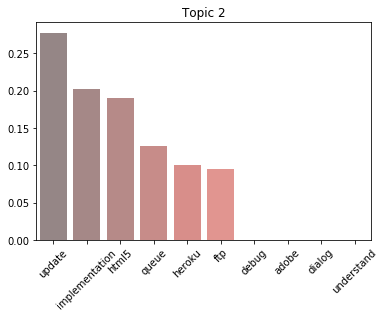

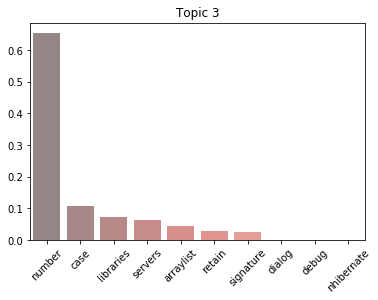

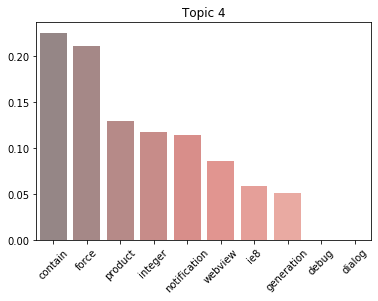

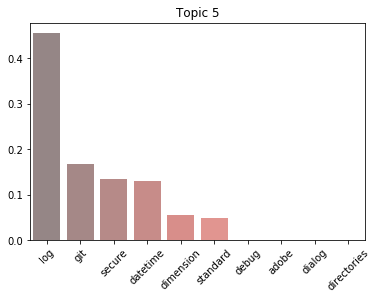

...

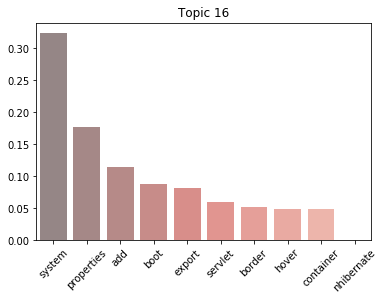

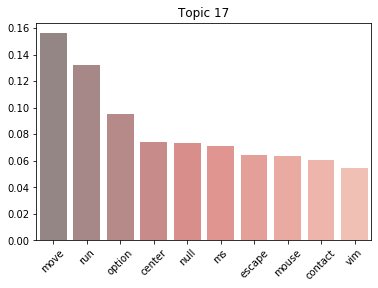

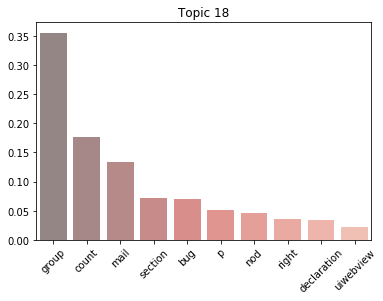

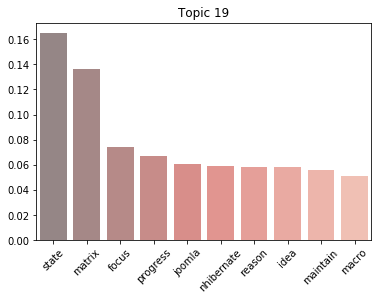

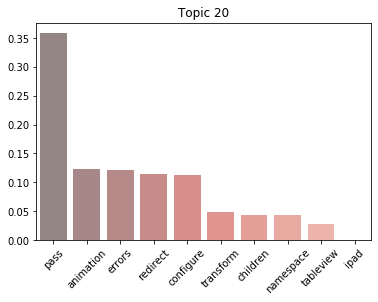

In [0]:
dictionary = corpora.Dictionary(df['Title'])
dictionary.filter_extremes(no_below=10, no_above=0.5, keep_n=1000)
corpus = [dictionary.doc2bow(doc) for doc in df['Title']]
lda = gensim.models.ldamodel.LdaModel(corpus,num_topics=100,id2word=dictionary,passes=10)
pprint.pprint (lda.print_topics())

#Printing the topic coherence scores
for i in range(len(lda.print_topics())):
  print ("Topic ",str(i+1),": ")
  pprint.pprint (lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary)[-i-1][1])

#Printing the word distributions in each topic
for i in range(len(lda.print_topics())):
  plt.figure()
  unzip = list(zip(*lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary,topn=10)[-i-1][0]))
  sns.barplot(x=list(unzip[1]),y=list(unzip[0]),palette='Reds_d',alpha=0.6)
  plt.title('Topic '+str(i+1))
  plt.xticks(rotation=45)

In [0]:
lda.save('/content/drive/My Drive/lda_4.18.gensim')

NameError: ignored

# 4.19 Bag of words => no_below=10, no_above=0.5, keep_n=1000, topics=20, passes=10

Streaming output truncated to the last 5000 lines.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Us

[(0,
  '0.075*"xml" + 0.059*"space" + 0.058*"css" + 0.049*"ruby" + 0.047*"menu" + '
  '0.047*"parse" + 0.044*"path" + 0.039*"cause" + 0.039*"regex" + '
  '0.039*"count"'),
 (1,
  '0.159*"change" + 0.146*"windows" + 0.115*"database" + 0.056*"api" + '
  '0.045*"output" + 0.041*"elements" + 0.031*"color" + 0.029*"copy" + '
  '0.029*"items" + 0.022*"trigger"'),
 (2,
  '0.170*"value" + 0.072*"type" + 0.066*"return" + 0.062*"field" + '
  '0.055*"project" + 0.048*"row" + 0.048*"check" + 0.039*"system" + '
  '0.037*"convert" + 0.030*"select"'),
 (3,
  '0.127*"jquery" + 0.084*"query" + 0.081*"mysql" + 0.077*"name" + '
  '0.070*"display" + 0.043*"result" + 0.037*"ios" + 0.034*"div" + '
  '0.033*"connection" + 0.033*"loop"'),
 (4,
  '0.188*"java" + 0.089*"html" + 0.084*"object" + 0.047*"network" + '
  '0.040*"site" + 0.029*"login" + 0.029*"report" + 0.028*"task" + '
  '0.024*"force" + 0.024*"pdf"'),
 (5,
  '0.082*"issue" + 0.077*"problem" + 0.066*"script" + 0.059*"google" + '
  '0.053*"map" + 0.0

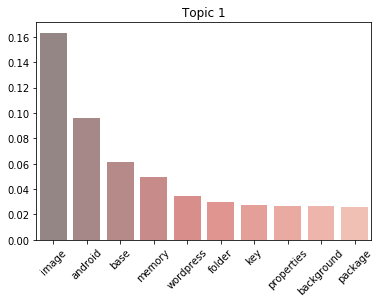

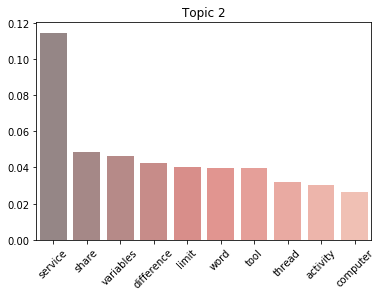

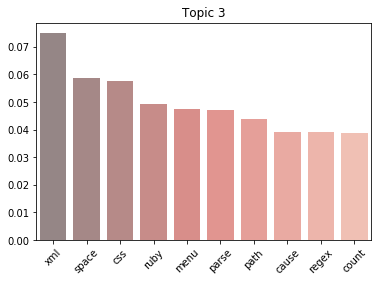

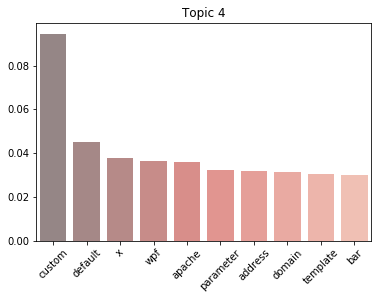

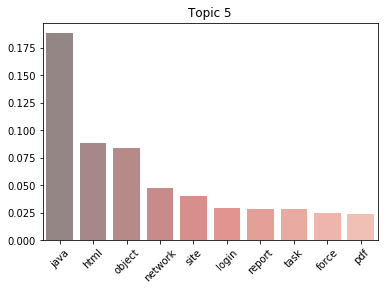

...

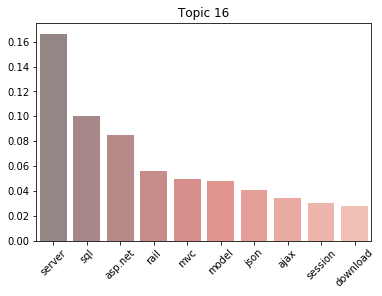

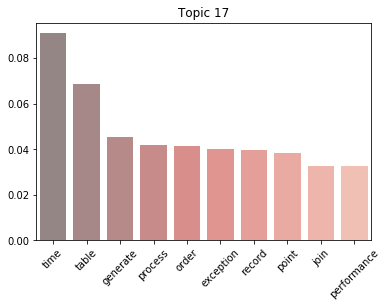

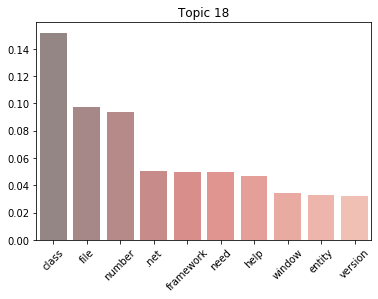

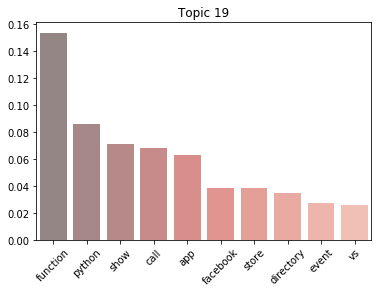

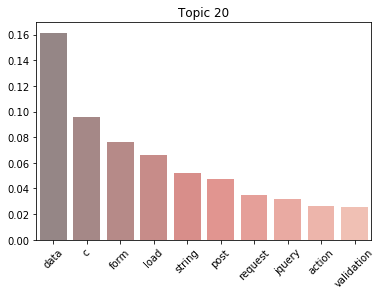

In [0]:
dictionary = corpora.Dictionary(df['Title'])
dictionary.filter_extremes(no_below=10, no_above=0.5, keep_n=1000)
corpus = [dictionary.doc2bow(doc) for doc in df['Title']]
lda = gensim.models.ldamodel.LdaModel(corpus,num_topics=20,id2word=dictionary,passes=10)
pprint.pprint (lda.print_topics())

#Printing the topic coherence scores
for i in range(len(lda.print_topics())):
  print ("Topic ",str(i+1),": ")
  pprint.pprint (lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary)[i][1])

#Printing the word distributions in each topic
for i in range(10):
  plt.figure()
  unzip = list(zip(*lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary,topn=20)[-i-1][0]))
  sns.barplot(x=list(unzip[1]),y=list(unzip[0]),palette='Reds_d',alpha=0.6)
  plt.title('Topic '+str(i+1))
  plt.xticks(rotation=45)

In [0]:
lda.save('/content/drive/My Drive/lda_4.19.gensim')

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


# 4.20 TFIDF => no_below=10, no_above=0.5, keep_n=10000, topics=20, passes=10

In [0]:
dictionary = corpora.Dictionary(df['Title'])
dictionary.filter_extremes(no_below=10, no_above=0.5, keep_n=10000)
corpus = [dictionary.doc2bow(doc) for doc in df['Title']]
tfidf = models.TfidfModel(corpus)
corpus_tfidf = tfidf[corpus]
lda = gensim.models.ldamodel.LdaModel(corpus_tfidf,num_topics=20,id2word=dictionary,passes=10,random_state=100)
pprint.pprint (lda.print_topics())

lda.save('/content/drive/My Drive/lda_4.20.gensim')

[(0,
  '0.090*"class" + 0.076*"array" + 0.040*"work" + 0.031*"loop" + '
  '0.031*"reference" + 0.022*"multiple" + 0.020*"methods" + 0.018*"package" + '
  '0.015*"force" + 0.015*"base"'),
 (1,
  '0.061*"c++" + 0.042*"problems" + 0.042*"generate" + 0.037*"network" + '
  '0.036*"javascript" + 0.035*"ajax" + 0.032*"performance" + 0.025*"oracle" + '
  '0.023*"debug" + 0.022*"perl"'),
 (2,
  '0.062*"line" + 0.054*"command" + 0.048*".net" + 0.034*"sort" + 0.031*"row" '
  '+ 0.028*"custom" + 0.027*"folder" + 0.024*"position" + 0.024*"animation" + '
  '0.023*"update"'),
 (3,
  '0.061*"list" + 0.049*"sql" + 0.049*"server" + 0.041*"project" + '
  '0.031*"json" + 0.031*"directory" + 0.027*"property" + 0.027*"show" + '
  '0.025*"select" + 0.024*"menu"'),
 (4,
  '0.048*"result" + 0.046*"linux" + 0.044*"table" + 0.041*"variables" + '
  '0.033*"action" + 0.032*"expression" + 0.029*"style" + 0.023*"define" + '
  '0.021*"redirect" + 0.019*"implement"'),
 (5,
  '0.063*"function" + 0.051*"name" + 0.049*"r

In [0]:
# Visualize the topics
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_4.20.gensim')
pyLDAvis.enable_notebook()
LDAvis_prepared = pyLDAvis.gensim.prepare(lda, corpus, dictionary)
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
5     -0.188594  0.027786       1        1  6.392612
3     -0.095866 -0.004556       2        1  5.844680
6      0.048536 -0.227851       3        1  5.714408
17     0.102194 -0.018704       4        1  5.571688
12    -0.006393  0.036621       5        1  5.460271
0     -0.000364  0.121444       6        1  5.402893
13    -0.031369  0.002303       7        1  5.332961
7     -0.083772 -0.059858       8        1  5.137836
18    -0.244242  0.001302       9        1  5.066360
14    -0.005866  0.015094      10        1  4.835660
9     -0.039449 -0.068416      11        1  4.833244
8      0.110863  0.110712      12        1  4.822630
10     0.012032  0.155345      13        1  4.814956
19     0.062074  0.008185      14        1  4.790608
15     0.223355 -0.001799      15        1  4.641552
16     0.002331  0.129615      16        1  4.599113
11     0.086939  0.070406      17        1  4.455665
2      0.158101 -0.013461      18        1  4.248557
1     -0.125208  0.025376      19        1  4.053938
4      0.014696 -0.309544      20        1  3.980375, topic_info=     Category         Freq     Term        Total  loglift  logprob
169   Default  1555.000000    class  1555.000000  30.0000  30.0000
50    Default  1309.000000    array  1309.000000  29.0000  29.0000
98    Default  1165.000000   python  1165.000000  28.0000  28.0000
348   Default  1053.000000    issue  1053.000000  27.0000  27.0000
244   Default  1035.000000  problem  1035.000000  26.0000  26.0000
...       ...          ...      ...          ...      ...      ...
1355  Topic20    82.367073  entries    84.145721   3.2024  -5.0340
880   Topic20    81.159821     mock    82.938469   3.2021  -5.0488
390   Topic20   556.391052    table   786.254700   2.8780  -3.1237
223   Topic20   129.516922    value  1967.884155   0.5029  -4.5814
93    Topic20    99.774857     java  1598.556763   0.4499  -4.8423

[721 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
30       18  0.997194     .net
219       1  0.076123   access
219       2  0.302763   access
219       5  0.064878   access
219       6  0.071798   access
...     ...       ...      ...
21       15  0.810625      xml
834      17  0.978700    xpath
1107     19  0.983511  youtube
1283     20  0.987741     zend
2172     17  0.978312      zip

[1063 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 4, 7, 18, 13, 1, 14, 8, 19, 15, 10, 9, 11, 20, 16, 17, 12, 3, 2, 5])

# 4.21 TFIDF => no_below=10, no_above=0.5, keep_n=10000, topics=50, passes=10

In [0]:
dictionary = corpora.Dictionary(df['Title'])
dictionary.filter_extremes(no_below=10, no_above=0.5, keep_n=10000)
corpus = [dictionary.doc2bow(doc) for doc in df['Title']]
tfidf = models.TfidfModel(corpus)
corpus_tfidf = tfidf[corpus]
lda = gensim.models.ldamodel.LdaModel(corpus_tfidf,num_topics=50,id2word=dictionary,passes=10,random_state=100)
pprint.pprint (lda.print_topics())

lda.save('/content/drive/My Drive/lda_4.21.gensim')

[(48,
  '0.149*"show" + 0.137*"program" + 0.090*"studio" + 0.085*"request" + '
  '0.067*"browser" + 0.044*"ie" + 0.042*"mode" + 0.021*"cookies" + '
  '0.020*"track" + 0.019*"increase"'),
 (31,
  '0.092*"store" + 0.073*"wpf" + 0.063*"vs" + 0.054*"oracle" + 0.037*"js" + '
  '0.033*"certificate" + 0.032*"encode" + 0.032*"release" + 0.031*"batch" + '
  '0.029*"width"'),
 (9,
  '0.132*"content" + 0.108*"ios" + 0.063*"listview" + 0.046*"gridview" + '
  '0.042*"compare" + 0.036*"rule" + 0.036*"procedure" + 0.033*"argument" + '
  '0.027*"cpu" + 0.027*"queue"'),
 (19,
  '0.135*"custom" + 0.101*"post" + 0.070*"network" + 0.068*"point" + '
  '0.063*"wordpress" + 0.059*"regex" + 0.047*"x" + 0.035*"level" + '
  '0.032*"applications" + 0.024*"versions"'),
 (7,
  '0.199*"value" + 0.109*"name" + 0.104*"return" + 0.075*"row" + 0.054*"div" + '
  '0.041*"items" + 0.032*"hide" + 0.026*"break" + 0.025*"end" + '
  '0.021*"jquery"'),
 (5,
  '0.124*"server" + 0.115*"sql" + 0.107*"method" + 0.103*"call" + 0.05

# 5. Model evaluation


# 5.1 Evaluation metrics

### Coherence Measures

- *C_v* measure is based on a sliding window, one-set segmentation of the top words and an indirect confirmation measure that uses normalized pointwise mutual information (NPMI) and the cosine similarity
- *C_umass* is based on document cooccurrence counts, a one-preceding segmentation and a logarithmic conditional probability as confirmation measure

# 5.2 Common topics and description of key terms

### Some common recognizable topics: 
- Databases
- Web design
- General programming
- Syntax
- Apps
- Web apps
- Web framework
- Web development
- Servers
- Cloud computing
- Cloud servers
- Blogging
- Windows applications
- Image formatting
- Scripting
- Computer systems
- OS
- Data structures
- Data analysis
- Software framework
- Virtual/remote machine
- User interface
- Photos
- Networking
- Installation
- Integrated development environment (IDE)



#### Overview of common topics: 
- **Rail**: Ruby on Rails, or Rails, is a server-side web application framework written in Ruby under the MIT License. Rails is a model–view–controller framework, providing default structures for a database, a web service, and web pages.
- **Asp.net**: ASP.NET is an open-source server-side web-application framework designed for web development to produce dynamic web pages developed by Microsoft to allow programmers to build dynamic web sites, applications and services
- **JQuery**: jQuery is a JavaScript library designed to simplify HTML DOM tree traversal and manipulation, as well as event handling, CSS animation, and Ajax. It is free, open-source software using the permissive MIT License. As of May 2019, jQuery is used by 73% of the 10 million most popular websites.
- **.NET**: .NET Framework is a software framework developed by Microsoft that runs primarily on Microsoft Windows. It includes a large class library named as Framework Class Library and provides language interoperability across several programming languages
- **Django**: Django is a Python-based free and open-source web framework, which follows the model-template-view architectural pattern. It is maintained by the Django Software Foundation, an independent organization established as a 501 non-profit. Django's primary goal is to ease the creation of complex, database-driven websites.
- **Mvc**: Model–view–controller is a software design pattern commonly used for developing user interfaces which divides the related program logic into three interconnected elements. 
- **CSS**: Cascading Style Sheets (CSS) is a style sheet language used for describing the presentation of a document written in a markup language like HTML. CSS is a cornerstone technology of the World Wide Web, alongside HTML and JavaScript. CSS is designed to enable the separation of presentation and content, including layout, colors, and fonts.[3] This separation can improve content accessibility, provide more flexibility and control in the specification of presentation characteristics, enable multiple web pages to share formatting by specifying the relevant CSS in a separate .css file, and reduce complexity and repetition in the structural content.
- **Ajax**: Ajax is a set of web development techniques using many web technologies on the client side to create asynchronous web applications. With Ajax, web applications can send and retrieve data from a server asynchronously without interfering with the display and behavior of the existing page.
- **Haskell**: Web framework
- **Netbeans**: NetBeans is an integrated development environment for Java. NetBeans allows applications to be developed from a set of modular software components called modules.
- **Jdbc**: Java Database Connectivity is an application programming interface for the programming language Java, which defines how a client may access a database. It is a Java-based data access technology used for Java database connectivity. It is part of the Java Standard Edition platform, from Oracle Corporation. 
- **Scala**: Scala is a general-purpose programming language providing support for functional programming and a strong static type system. Designed to be concise, many of Scala's design decisions aimed to address criticisms of Java.
- **Xcode**: Xcode is an integrated development environment (IDE) for macOS containing a suite of software development tools developed by Apple for developing software for macOS, iOS, iPadOS, watchOS, and tvOS
- **JAR**: A JAR is a package file format typically used to aggregate many Java class files and associated metadata and resources into one file for distribution. JAR files are archive files that include a Java-specific manifest file. They are built on the ZIP format and typically have a .jar file extension.
- **Magento**: Magento is an open-source e-commerce platform written in PHP. It is one of the most popular open e-commerce systems in the network. This software is created using the Zend Framework.
-**Tomcat**: Apache Tomcat is an open-source implementation of the Java Servlet, JavaServer Pages, Java Expression Language and WebSocket technologies. Tomcat provides a "pure Java" HTTP web server environment in which Java code can run.
- **Zend**: Zend Server is a complete and certified PHP distribution stack fully maintained and supported by Zend Technologies. It ships with an updated set of advanced value-add features designed to optimize productivity, performance, scalability and reliability.
- **SSH**: Secure Shell is a cryptographic network protocol for operating network services securely over an unsecured network. Typical applications include remote command-line, login, and remote command execution, but any network service can be secured with SSH.
- **Bash**: GNU Bash or simply Bash is a Unix shell and command language written by Brian Fox for the GNU Project as a free software replacement for the Bourne shell. First released in 1989, it has been used widely as the default login shell for most Linux distributions and Apple's macOS Mojave and earlier versions.
- **MongoDB**: MongoDB is a cross-platform document-oriented database program. Classified as a NoSQL database program, MongoDB uses JSON-like documents with schema. MongoDB is developed by MongoDB Inc. and licensed under the Server Side Public License.
- **IIS**: Internet Information Services is an extensible web server created by Microsoft for use with the Windows NT family. IIS supports HTTP, HTTP/2, HTTPS, FTP, FTPS, SMTP and NNTP.
-**Heroku**: Heroku is a cloud platform as a service supporting several programming languages. One of the first cloud platforms, Heroku has been in development since June 2007, when it supported only the Ruby programming language, but now supports Java, Node.js, Scala, Clojure, Python, PHP, and Go.

# 5.3 Model 4.12 **BASELINE MODEL** => TFIDF, no_below=10, no_above=0.5, keep_n=1000, topics=20, passes=10 

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL



Coherence Score (C_v):  0.428952041248815

Coherence Score (C_umass):  -11.938974724948476


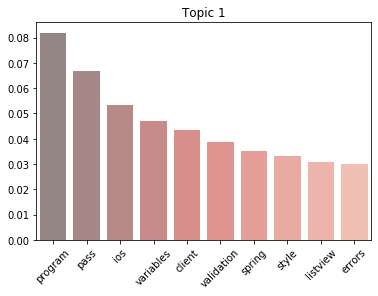

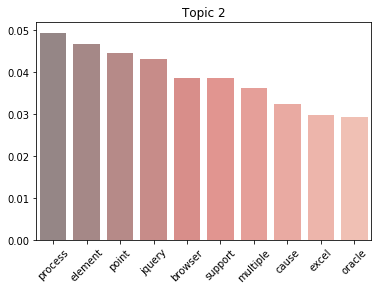

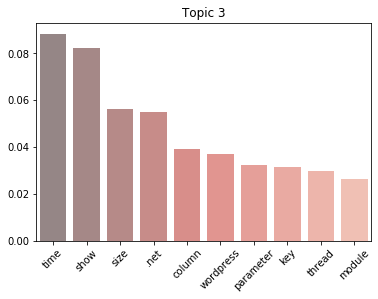

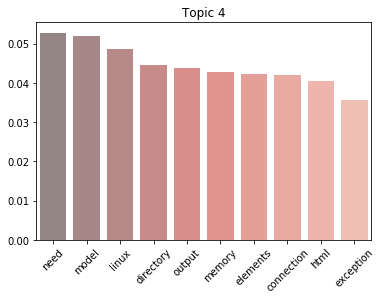

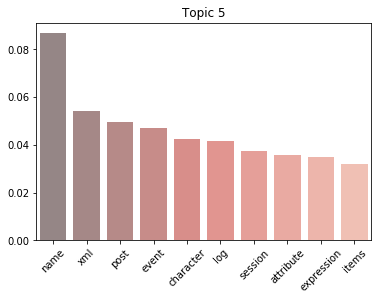

...

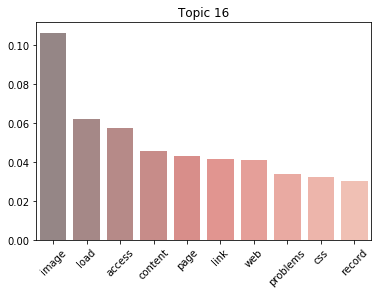

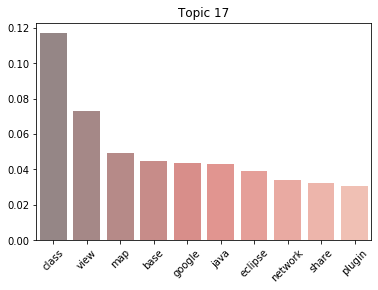

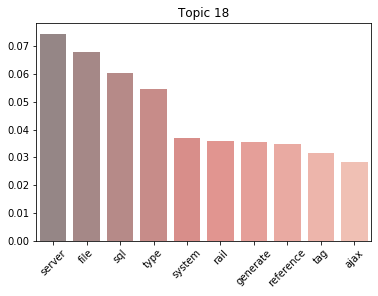

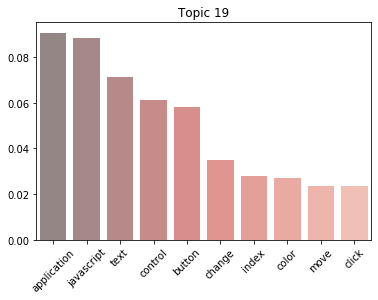

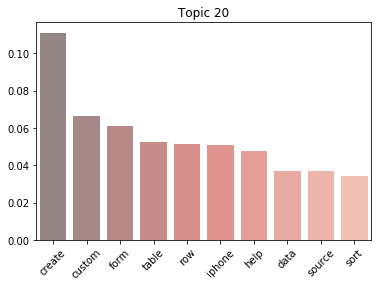

In [0]:
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_4.12.gensim')

# Compute Coherence Score using c_v
coherence_model_lda = CoherenceModel(model=lda, texts=df['Title'], coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score (C_v): ', coherence_lda)

# Compute Coherence Score using c_umass
coherence_model_lda = CoherenceModel(model=lda, corpus=corpus_tfidf, coherence='u_mass')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score (C_umass): ', coherence_lda)

#Printing the word distributions in each topic
for i in range(len(lda.print_topics())):
  plt.figure()
  unzip = list(zip(*lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary,topn=10)[-i-1][0]))
  sns.barplot(x=list(unzip[1]),y=list(unzip[0]),palette='Reds_d',alpha=0.6)
  plt.title('Topic '+str(i+1))
  plt.xticks(rotation=45)

We have a **C_v coherence score of 0.4289** and a **C_umass score of -11.9389**. Just by themselves, these numbers don't provide much meaning. More models will need to be evaluated to determine if these results are good or not. 

In [0]:
# Visualize the topics
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_4.12.gensim')
pyLDAvis.enable_notebook()
LDAvis_prepared = pyLDAvis.gensim.prepare(lda, corpus, dictionary)
LDAvis_prepared

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL
/usr/local/lib/python3.6/dist-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
2     -0.075970  0.042523       1        1  6.028311
0     -0.170199 -0.055314       2        1  6.013814
5      0.156054 -0.001966       3        1  5.974107
7     -0.016704  0.175698       4        1  5.781103
16    -0.011858  0.177142       5        1  5.676146
1      0.138366  0.039507       6        1  5.625000
13    -0.045613 -0.019317       7        1  5.533867
18     0.069310 -0.043411       8        1  5.221511
14     0.055736 -0.188300       9        1  4.931794
6     -0.157474  0.196427      10        1  4.900030
11     0.087204 -0.091494      11        1  4.826601
17     0.160644 -0.104694      12        1  4.781701
3      0.008017  0.023030      13        1  4.583929
9     -0.025845 -0.172967      14        1  4.521049
10     0.079136 -0.022669      15        1  4.474097
15     0.147997  0.033763      16        1  4.473819
4     -0.220533 -0.118088      17        1  4.417896
8     -0.203150 -0.111172      18        1  4.122612
12     0.070799  0.142559      19        1  4.072767
19    -0.045915  0.098744      20        1  4.039855, topic_info=    Category         Freq      Term        Total  loglift  logprob
81   Default  2324.000000      work  2324.000000  30.0000  30.0000
145  Default  1758.000000     class  1758.000000  29.0000  29.0000
1    Default  1739.000000     image  1739.000000  28.0000  28.0000
36   Default  1588.000000   windows  1588.000000  27.0000  27.0000
195  Default  2090.000000  function  2090.000000  26.0000  26.0000
..       ...          ...       ...          ...      ...      ...
265  Topic20   141.502365     chart   143.190445   3.1971  -4.3493
225  Topic20   132.270370     sound   133.958450   3.1963  -4.4168
740  Topic20   129.896591        qt   131.584671   3.1960  -4.4349
793  Topic20   127.810555    relate   129.498627   3.1958  -4.4511
974  Topic20   126.091644    modify   127.779724   3.1957  -4.4646

[700 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
28       15  0.997996     .net
186       1  0.750032   access
186       7  0.134765   access
186      10  0.113909   access
627      11  0.993395  account
...     ...       ...      ...
118       3  0.996390        x
422       6  0.995470    xcode
20       14  0.997053      xml
812      12  0.990564     zend
686      15  0.988286     zoom

[798 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 1, 6, 8, 17, 2, 14, 19, 15, 7, 12, 18, 4, 10, 11, 16, 5, 9, 13, 20])

Before we evaluate the *pyLDAvis* visualization for our baseline model, a few notes on the graph: 
- The circles represent the different topics
- The proximity of each circle from another determines how similar the two topics are
- The size of the circle indicates the importance of the model. The number on the circles follows this notation as well where **topic 1** has the largest circe. 
- The axes don't give much information. The only thing to note would be that the TFIDF corpus (multi-dimensional sparse matrix) has been reduced to a two-dimensional space. This is essentially dimensionality reduction. In this case, *Principal Coordinate Analysis (PCoA)* is used to do the reduction. Unfortunately, the results of dimensionality reduction are not too interpretable in terms of concrete numbers. 
- The bar plot on the right shows the distribution of words in the corpus as well as in the selected topics. 

The first thing we want to note from model 4.12 is that the term *c* in **topic 4** is denoted as the most important term. This kind of makes sense as we can see from the distribution plots on the right. This term's frequency in the corpus is only slightly higher than it's frequency within the topic. 

### Topic 4
What this means is that this term is highly unique to this particular topic and hence could define the overall nature of the topic. As we can see from the graph, the only other topic in which this term exists is 20. 

For the other top words in this topic such as **issue, call, method and string**, all the occurrences of these words in the corpus is only within this topic. Hence, these words are completely unique to this topic. No other topics contain these words. This can potentially help in isolating one topic from another. 

### Topic 1

Key words in this topic include **image, content, css, page, link, access, load etc**. This would indicate that this topic has to do with things like **web page formatting, blogging, web page templates** and things of that nature. 

### Topic 2

This topic is slightly trickier to interpret. However, we do see some common themes appear if we combine some high level topics such as **databases, servers, web services, web pages and frameworks** together. 

For example, *ajax* provides client-side web technologies allowing web applications to retrieve data from online servers. On the other hand, *rails* is a server-side web application framework that provides structures for databases, web pages and web applications. When we compare these two terms, the similarity becomes apparent. Other terms that makes sense within this topic's context are **server, sql, system, file, type, generate, reference etc.**

### Topic 3

This topic seems to cover themes such as **programming, data types and API**. 

### Topic 5

**Web applications, user interface, web development**

So far, the 5 topics that we explored seem to have decent and somewhat interpretable themes. Let's see if we can optimize the model further before we explore more topics. 

# 5.4 Model 4.13 => TFIDF, no_below=10, no_above=0.5, keep_n=1000, topics=50, passes=10

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL



Coherence Score (C_v):  0.6048870627240824

Coherence Score (C_umass):  -17.842770014598443


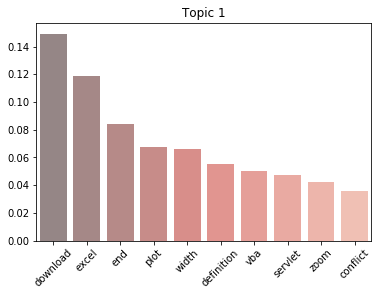

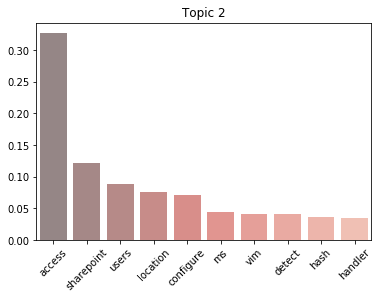

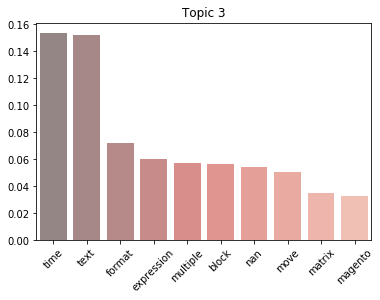

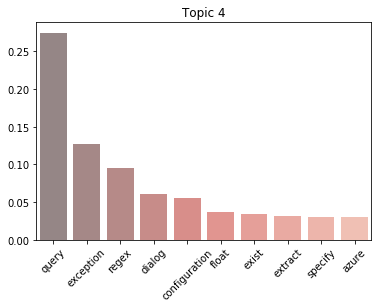

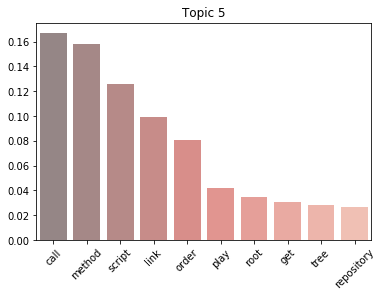

...

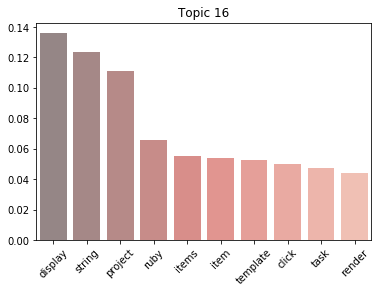

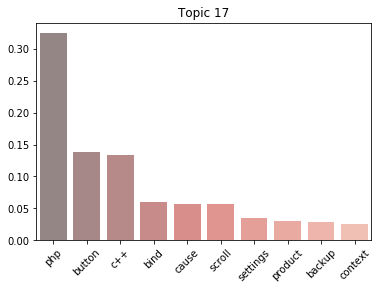

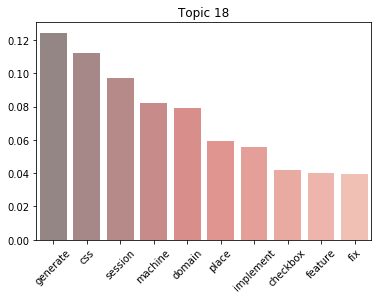

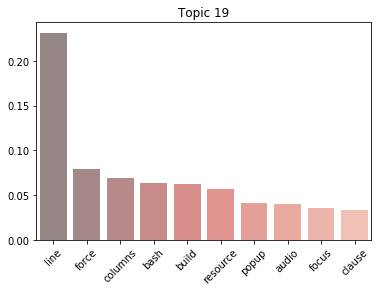

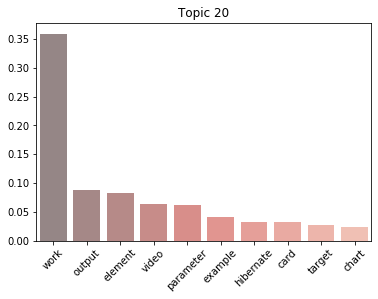

In [0]:
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_4.13.gensim')

# Compute Coherence Score using c_v
coherence_model_lda = CoherenceModel(model=lda, texts=df['Title'], coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score (C_v): ', coherence_lda)

# Compute Coherence Score using c_umass
coherence_model_lda = CoherenceModel(model=lda, corpus=corpus_tfidf, coherence='u_mass')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score (C_umass): ', coherence_lda)

#Printing the word distributions in each topic
for i in range(len(lda.print_topics())):
  plt.figure()
  unzip = list(zip(*lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary,topn=10)[-i-1][0]))
  sns.barplot(x=list(unzip[1]),y=list(unzip[0]),palette='Reds_d',alpha=0.6)
  plt.title('Topic '+str(i+1))
  plt.xticks(rotation=45)

In [0]:
# Visualize the topics
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_4.13.gensim')
pyLDAvis.enable_notebook()
LDAvis_prepared = pyLDAvis.gensim.prepare(lda, corpus, dictionary)
LDAvis_prepared

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL
/usr/local/lib/python3.6/dist-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
26     0.089037 -0.069802       1        1  3.222194
37     0.068535  0.334197       2        1  2.939288
1     -0.076283  0.115844       3        1  2.871619
31    -0.241447  0.003158       4        1  2.621578
22     0.063566 -0.010898       5        1  2.596404
20     0.033809 -0.041469       6        1  2.484245
29    -0.121984 -0.041569       7        1  2.420091
6      0.088231 -0.069415       8        1  2.418870
8     -0.043766 -0.005447       9        1  2.381806
40     0.063329 -0.011412      10        1  2.369391
4     -0.047901 -0.043294      11        1  2.363672
24    -0.061654 -0.004243      12        1  2.330214
2     -0.052348 -0.004793      13        1  2.318504
43     0.077975  0.202313      14        1  2.290952
47     0.063091 -0.011715      15        1  2.237926
32     0.061826 -0.098330      16        1  2.227389
39    -0.004984 -0.116837      17        1  2.194991
17    -0.089502 -0.003440      18        1  2.186239
19     0.038989 -0.018488      19        1  2.179870
13     0.062971 -0.011731      20        1  2.103673
23     0.054105 -0.091810      21        1  2.103219
36     0.063037 -0.011683      22        1  2.084845
28     0.062700 -0.012275      23        1  2.036138
9     -0.048419  0.180575      24        1  2.001402
16     0.062284 -0.012597      25        1  1.956205
5     -0.057902 -0.005335      26        1  1.954770
30     0.062705 -0.012038      27        1  1.943511
0     -0.113738 -0.010641      28        1  1.935553
46     0.062381 -0.012486      29        1  1.928960
10     0.062530 -0.012197      30        1  1.839129
14    -0.137582 -0.001463      31        1  1.815873
48    -0.109861 -0.002765      32        1  1.805512
42     0.001730 -0.009098      33        1  1.780160
25    -0.044615 -0.006479      34        1  1.772801
33     0.062033 -0.012644      35        1  1.766186
38    -0.092493 -0.003933      36        1  1.710005
3      0.034727 -0.039503      37        1  1.709112
18     0.062134 -0.012660      38        1  1.673972
44     0.070311  0.105213      39        1  1.629589
12    -0.138935 -0.001873      40        1  1.614620
27    -0.060464 -0.006170      41        1  1.610390
34     0.061376 -0.013299      42        1  1.554988
11    -0.027357 -0.008554      43        1  1.479502
41    -0.043993 -0.007122      44        1  1.451397
21     0.061294 -0.013227      45        1  1.430363
7      0.060738 -0.013656      46        1  1.424270
45     0.061107 -0.013379      47        1  1.398117
49     0.060889 -0.013626      48        1  1.367184
35     0.060657 -0.013764      49        1  1.295348
15    -0.122868 -0.004140      50        1  1.167956, topic_info=    Category         Freq        Term        Total  loglift  logprob
97   Default  2424.000000      jquery  2424.000000  30.0000  30.0000
188  Default  2241.000000       value  2241.000000  29.0000  29.0000
81   Default  2185.000000        work  2185.000000  28.0000  28.0000
6    Default  2175.000000       error  2175.000000  27.0000  27.0000
195  Default  2080.000000    function  2080.000000  26.0000  26.0000
..       ...          ...         ...          ...      ...      ...
335  Topic50     0.040581   wordpress   457.518372  -4.8804 -11.2652
336  Topic50     0.040581  generation    85.666809  -3.2050 -11.2652
337  Topic50     0.040581        divs   100.558517  -3.3653 -11.2652
318  Topic50     0.040581      system   583.985535  -5.1244 -11.2652
320  Topic50     0.040581        post   707.126892  -5.3157 -11.2652

[1998 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
732      25  0.985758  .htaccess
28        2  0.997947       .net
539      11  0.961257         \\
565      31  0.975814     \\frac
935      43  0.979799   \\mathbb
...     ...       ...        ...
748      29  0.984837    youtube
919      32  0.978540          z
812  

This model basically increases the number of topics to 50. This means that the distributions of important words within each topic will be higher. Therefore, hopefully the topics become more clearer and concrete. 

First things first, let's look at the coherence metrics. 
- Coherence Score (C_v):  0.6048870627240824
- Coherence Score (C_umass):  -17.842770014598443

The first thing to notice in the pyLDAvis plot is that the relative difference in size between the different topics is less. This could indicate that there might be subtle differences across each topic. 

### Topic 1

We will need to change our strategy while evaluating this model with 50 topics. 
Since the importance is spread across fewer number of terms within a topic, it is more important to consider 
the very top terms, maybe the first 5-10. As seen in the graph, the distribution is highly right-skewed indicating
that the importance of terms drops sharply. For topic 1, the themes are not obviously apparent. But if we really want to
extract some information, the topics seem to be **data structures and apps**. 

Another thing to note about this topic is that there are many "semantically" similar topics near this one in the 
two-dimensional PCoA space. Perhaps that's the reason why the topics are not too interpretable. 

### Topic 2

**Web services, cloud services, IDE**

### Topic 3

This topic actually makes a lot of sense with themes coming up such as **Databases, querying, analytics**.
Important terms include **java, server, sql, mongodb, queue, databases, analytics, jdbc, data etc.**

### Topic 4

Once again, there are a few databases terms such as **mysql, oracle, insert**. However, the rest of the terms are pretty generic. 
Terms such as **object, convert, scala** would go under general programming. Therefore our topics can be **general programming, database systems**. 

### Topic 5

Words like **image, flash, upload, buffer** indicates themes such as **internet media, multimedia**. Other than that, the other words such as **program, folder, error etc.** don't really provide much context. 


  

# 5.5 Model 4.14 => TFIDF, no_below=10, no_above=0.5, keep_n=1000, topics=100, passes=10

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL



Coherence Score:  0.6647341994984697

Coherence Score (C_umass):  -18.042532646723842


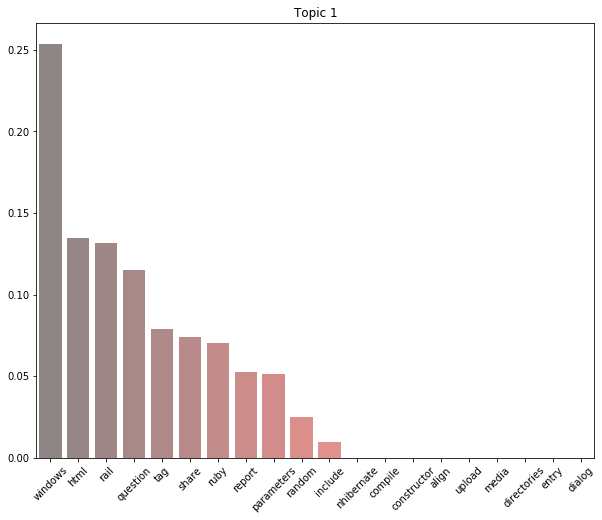

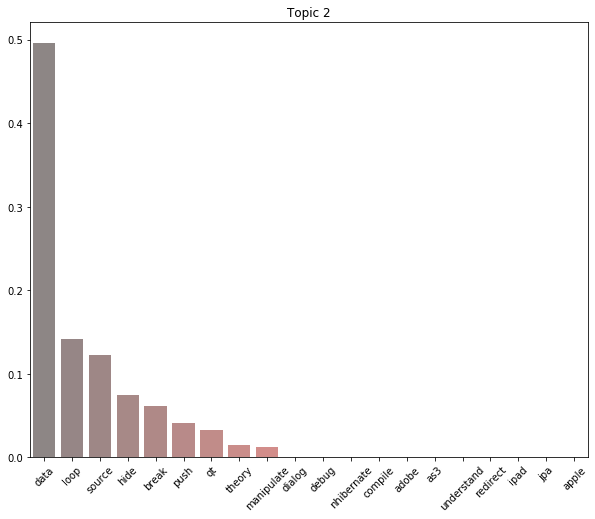

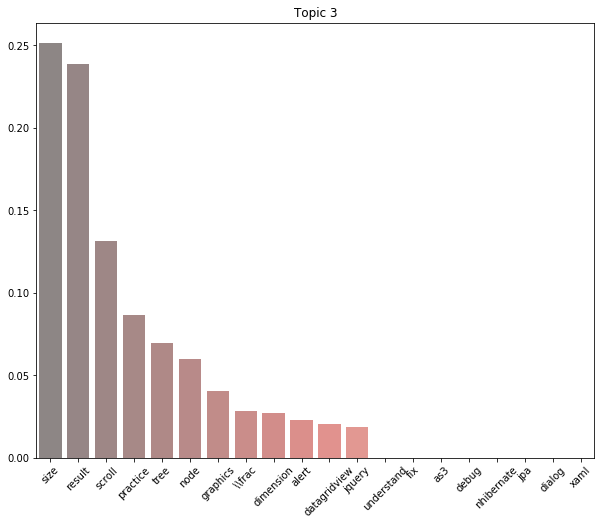

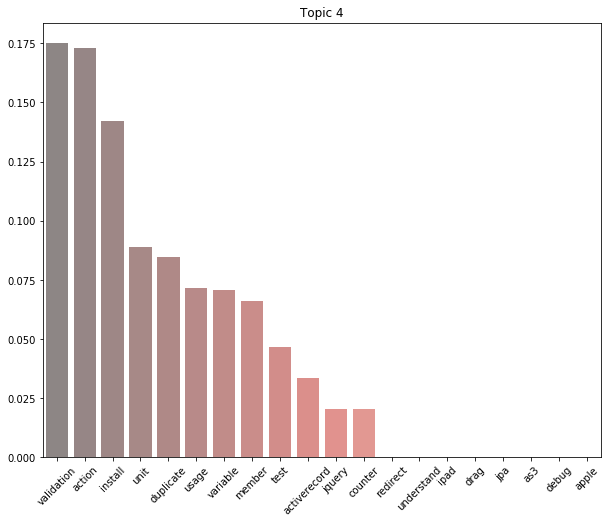

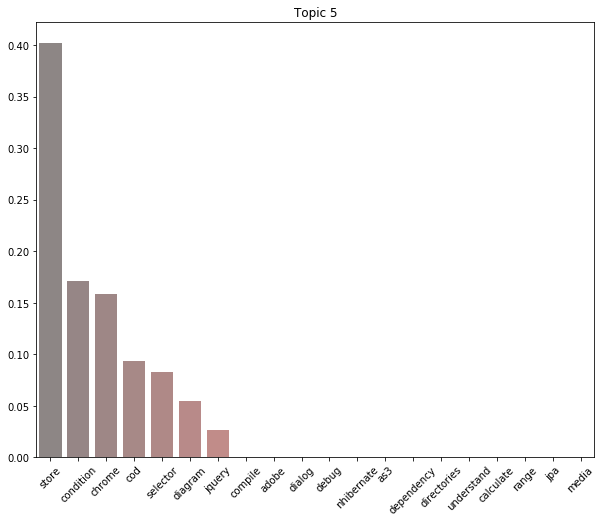

...

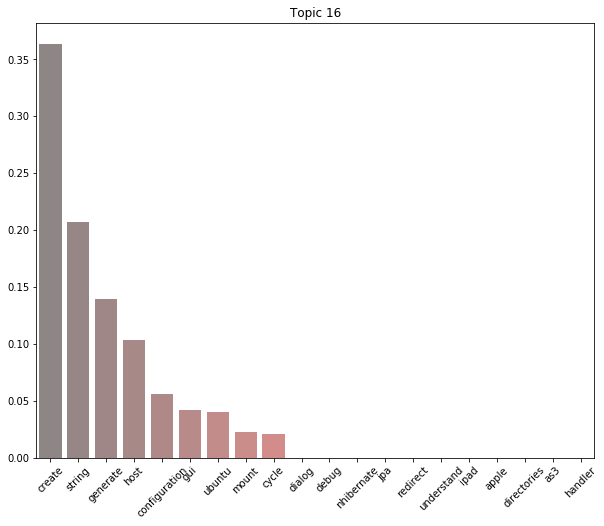

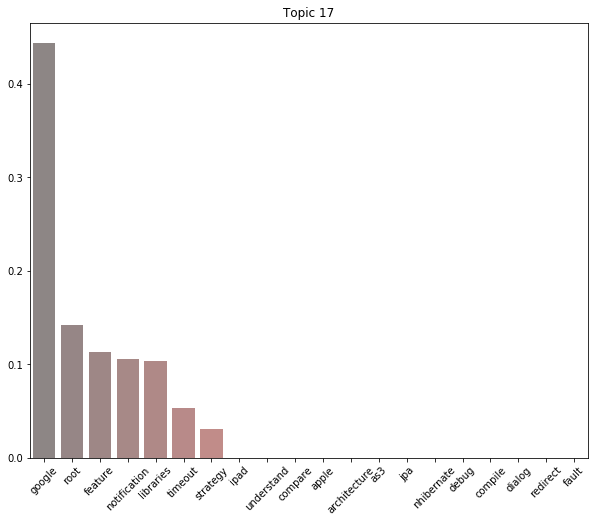

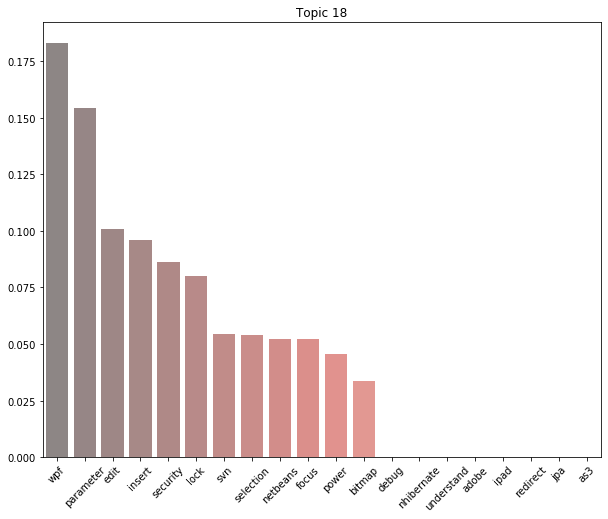

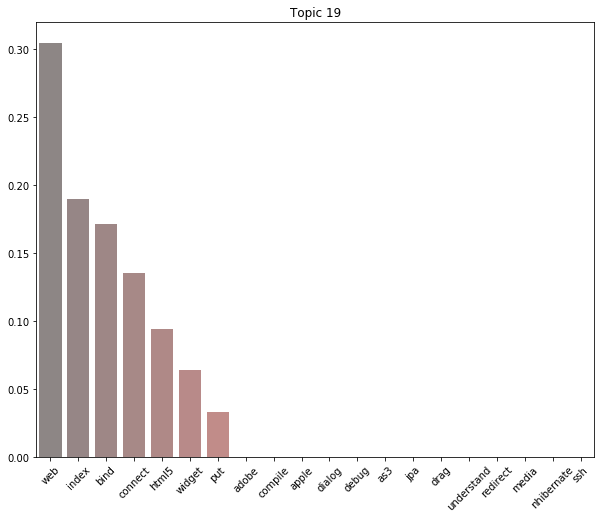

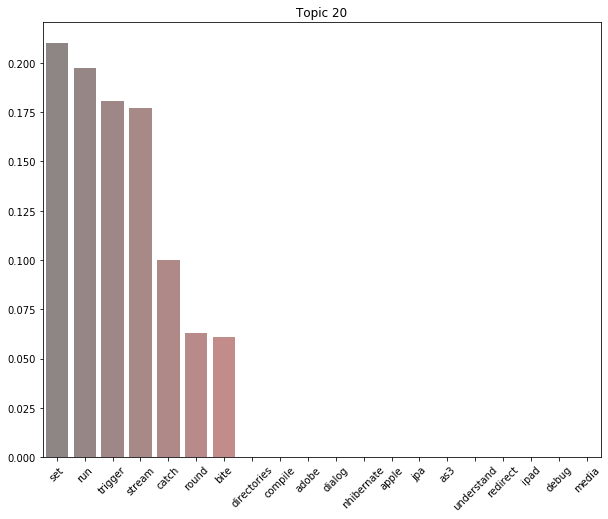

In [0]:
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_4.14.gensim')

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda, texts=df['Title'], coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

# Compute Coherence Score using c_umass
coherence_model_lda = CoherenceModel(model=lda, corpus=corpus_tfidf, coherence='u_mass')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score (C_umass): ', coherence_lda)

#Printing the word distributions in each topic
for i in range(len(lda.print_topics())):
  plt.figure(figsize=(10,8))
  #unzip = list(zip(*lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary,topn=20)[-i-1][0]))
  unzip = list(zip(*lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary,topn=20)[i][0]))
  sns.barplot(x=list(unzip[1]),y=list(unzip[0]),palette='Reds_d',alpha=0.6)
  plt.title('Topic '+str(i+1))
  plt.xticks(rotation=45)

In [0]:
# Visualize the topics
'''
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_4.14.gensim')
pyLDAvis.enable_notebook()
LDAvis_prepared = pyLDAvis.gensim.prepare(lda, corpus, dictionary)
LDAvis_prepared
'''

"\nlda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_4.14.gensim')\npyLDAvis.enable_notebook()\nLDAvis_prepared = pyLDAvis.gensim.prepare(lda, corpus, dictionary)\nLDAvis_prepared\n"

It appears that pyLDAvis is not executing for the model with 100 topics. However, we can do a similar analysis as the previous models by looking at the the graphs we generated using seaborn. 

### Topic 1

As discussed earlier, as the number of topics goes up, the amount of 
important words within each topic decreases. We see the same trend for 
model 4.14 with a 100 topics. This topic does not have clear themes. The only
words that make sense together are **location, remote, permission and cms** which would seem to indicate topics such as **virtual computer, remote access, authentication**.

### Topic 2

Too vague to interpret

### Topic 3

The most obvious theme here is **networking** with words such as **address, ip, encode**. The other words are not too obvious to categorize. 

### Topic 4

Words like **limit, cache and deny** would seem to indicate topics such as 
**API transactions, web crawling**. Additional words such as **textbox and translate** would
seem to indicate **text translation, search engine**. 

### Topic 5

Not clear

Overall, this model does not do too well. In terms c_v coherence, this model has the highest score but has the lowest when it comes to c_umass. Human interpretability is not too great as there are very few important words within each topic. 

# 5.6 Model 4.15 => TFIDF, no_below=10, no_above=0.5, keep_n=1000, topics=150, passes=10

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL



Coherence Score:  0.6878329623033028

Coherence Score (C_umass):  -18.109188122230588


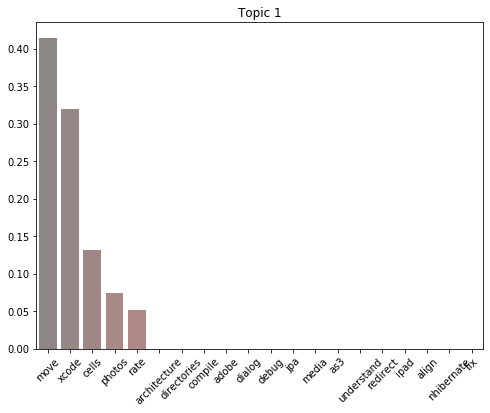

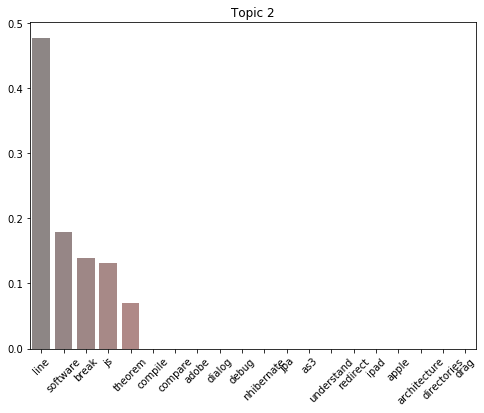

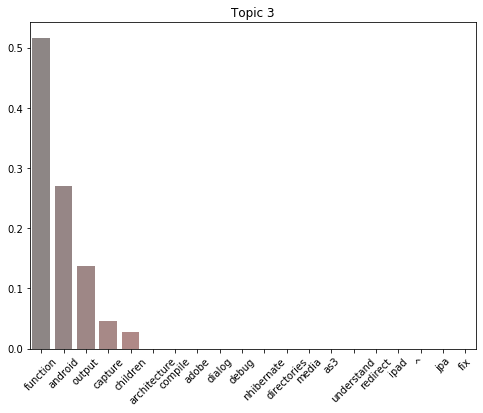

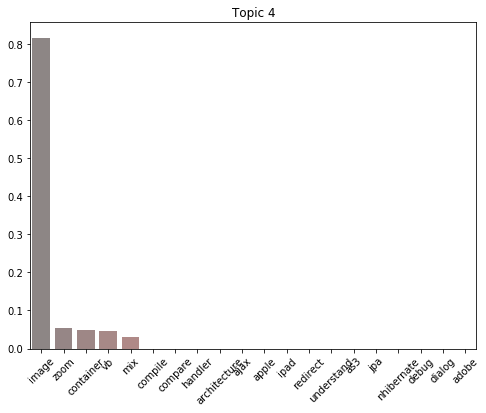

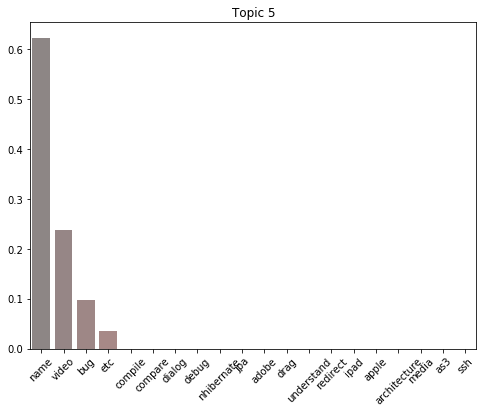

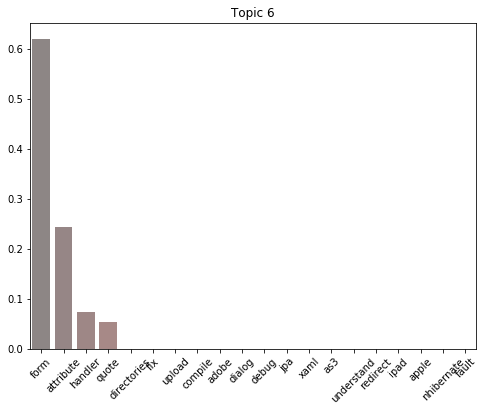

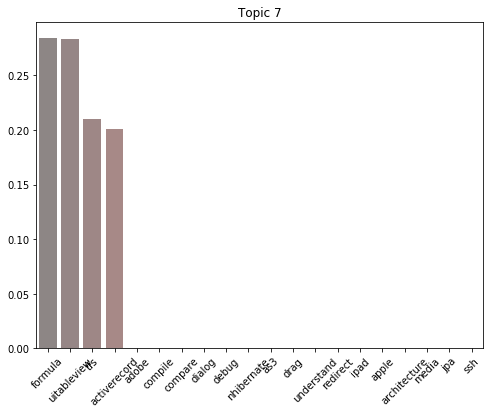

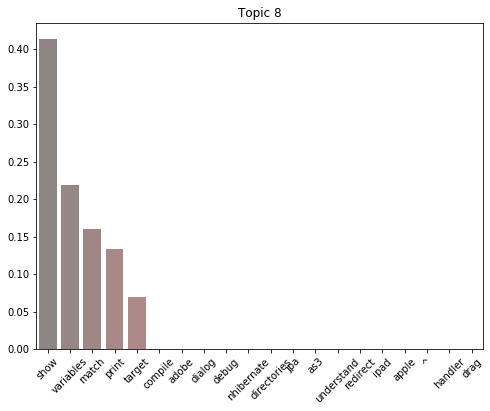

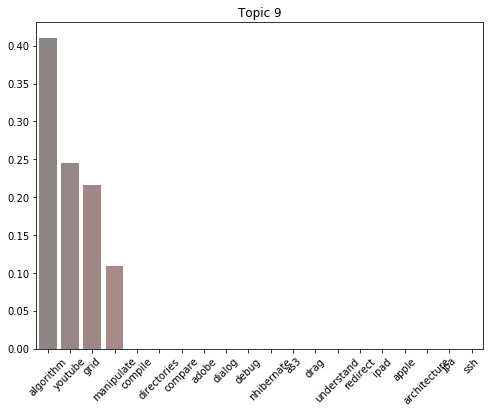

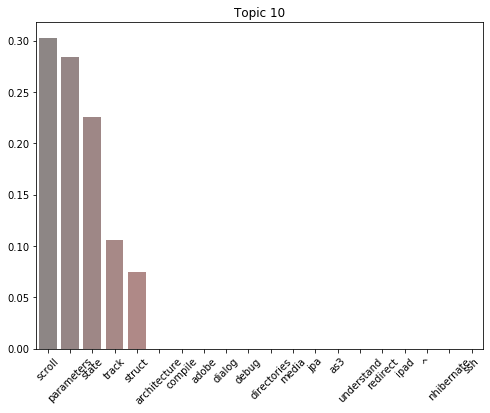

In [0]:
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_4.15.gensim')

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda, texts=df['Title'], coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

# Compute Coherence Score using c_umass
coherence_model_lda = CoherenceModel(model=lda, corpus=corpus_tfidf, coherence='u_mass')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score (C_umass): ', coherence_lda)

#Printing the word distributions in each topic
#for i in range(len(lda.print_topics())):
for i in range(10):
  plt.figure(figsize=(8,6))
  #unzip = list(zip(*lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary,topn=20)[-i-1][0]))
  unzip = list(zip(*lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary,topn=20)[i][0]))
  sns.barplot(x=list(unzip[1]),y=list(unzip[0]),palette='Reds_d',alpha=0.6)
  plt.title('Topic '+str(i+1))
  plt.xticks(rotation=45)

### Coherence c_v: 0.6878

### Coherence c_umass: -18.109

From the scores above, we can start to see a trend. As we increase the number of topics, the c_v score
increases, but the c_umass score drops. 

### Topic 1

With 200 topics, there are very few keywords within each topic. It's really hard to interpret
a general topic from words such as **movie, xcode, cells, photos, rate**. At this point, the words in the 
topic might just make up entire document texts.

### Topic 2

Once again, too few words to create a topic. 

### Topic 3

Vague

### Topic 4

Vague

### Topic 5

Vague

Overall it seems like the sweet spot when it comes to the number of topics is between 20 and 50 topics. Let's see
if can create some more models within this range, or even between 50 and 100 which may provide more optimized results. 
However as of now, models 4.12 and 4.13 seem to be the most promising. 

# 5.7 Model 4.19 => Bag of words, no_below=10, no_above=0.5, keep_n=1000, topics=20, passes=10

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL



Coherence Score:  0.434533756484284

Coherence Score (C_umass):  -17.244361229068833


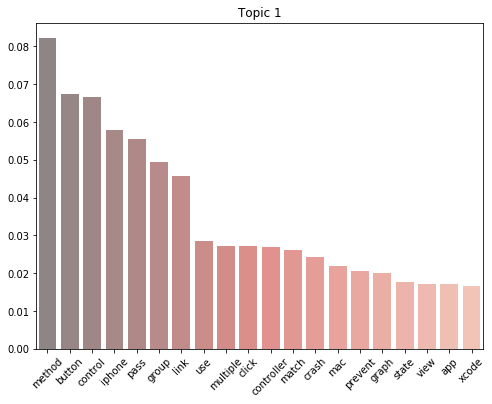

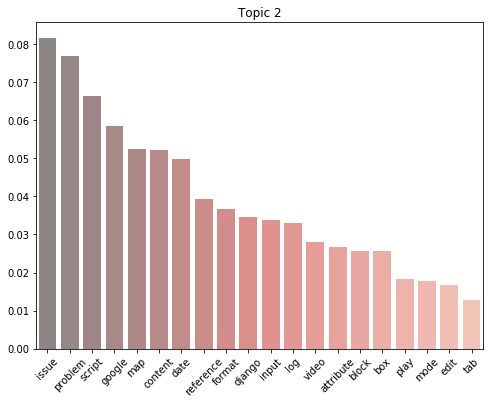

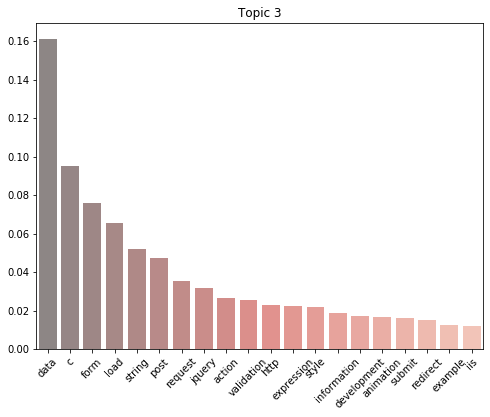

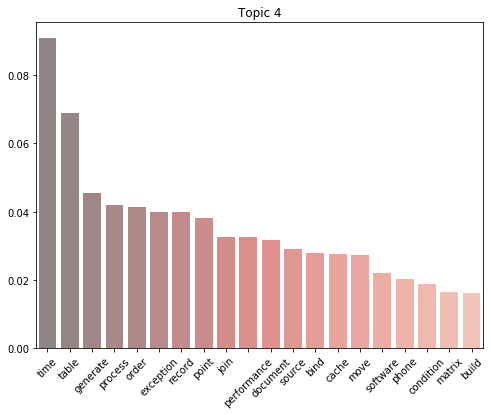

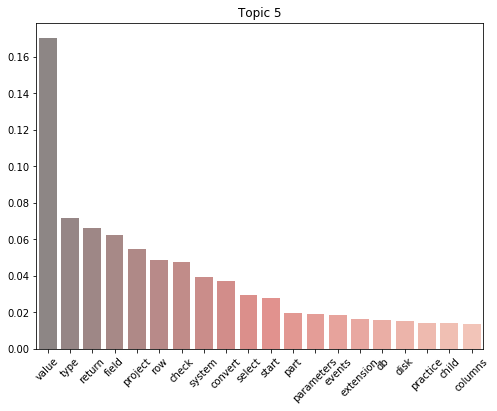

In [0]:
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_4.19.gensim')

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda, texts=df['Title'], coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

# Compute Coherence Score using c_umass
coherence_model_lda = CoherenceModel(model=lda, corpus=corpus_tfidf, coherence='u_mass')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score (C_umass): ', coherence_lda)

#Printing the word distributions in each topic
#for i in range(len(lda.print_topics())):
for i in range(5):
  plt.figure(figsize=(8,6))
  #unzip = list(zip(*lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary,topn=20)[-i-1][0]))
  unzip = list(zip(*lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary,topn=20)[i][0]))
  sns.barplot(x=list(unzip[1]),y=list(unzip[0]),palette='Reds_d',alpha=0.6)
  plt.title('Topic '+str(i+1))
  plt.xticks(rotation=45)

### Topic 1

The topic is not obviously clear. 

### Topic 2

There are a few clear topics in this case such as **programming and apps**.

### Topic 3

In this case, there appears to be two possible themes, **web development and sql**. 


### Topic 4

Once again, a hard to determine topic. Words such as **value, type, field, row, select and db** suggest
topics such as **SQL or databases**, however the topics are not too clear. 

### Topic 5

Another hard to determine topic. 

### Verdict

Overall, the corresponding TFIDF LDA model using 20 topics proved to have more
distinguishable topics. 

In [0]:
# Visualize the topics
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_4.21.gensim')
pyLDAvis.enable_notebook()
LDAvis_prepared = pyLDAvis.gensim.prepare(lda, corpus, dictionary)
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
5     -0.039233 -0.151359       1        1  3.137638
7     -0.169455  0.093521       2        1  2.922985
44     0.093452  0.093687       3        1  2.661363
14     0.030064  0.098584       4        1  2.628651
49    -0.095150 -0.001279       5        1  2.617356
33    -0.119014  0.059437       6        1  2.508792
6     -0.026432 -0.055568       7        1  2.472462
32    -0.009683 -0.160746       8        1  2.452374
25    -0.119082  0.119380       9        1  2.412708
3      0.031871 -0.190590      10        1  2.328241
18    -0.041537  0.065723      11        1  2.250053
19     0.093130 -0.020962      12        1  2.214772
15    -0.032039  0.115161      13        1  2.142312
4      0.132478 -0.026823      14        1  2.127496
24     0.083551 -0.018524      15        1  2.106636
29    -0.002965 -0.066966      16        1  2.106355
28     0.009839 -0.093395      17        1  2.085475
40    -0.106922  0.062230      18        1  2.074502
17    -0.038638 -0.075663      19        1  2.048373
41    -0.007447 -0.106463      20        1  2.023396
38     0.084872  0.152691      21        1  1.987786
22     0.042367 -0.022899      22        1  1.967599
21    -0.120854  0.041348      23        1  1.962993
48    -0.064596 -0.011234      24        1  1.960792
8     -0.062588 -0.072946      25        1  1.954609
34    -0.132380 -0.000505      26        1  1.952733
30    -0.076033  0.093203      27        1  1.948756
37     0.097758  0.004352      28        1  1.935630
0      0.014025 -0.032735      29        1  1.895909
35    -0.118048 -0.055039      30        1  1.893983
20     0.080870  0.147038      31        1  1.828401
42    -0.027771  0.000278      32        1  1.817413
27    -0.080849 -0.033279      33        1  1.800149
12    -0.004692  0.011789      34        1  1.773323
31     0.124038  0.028170      35        1  1.762060
45     0.087822 -0.031012      36        1  1.756483
11    -0.012875 -0.032163      37        1  1.745193
47     0.012987 -0.046165      38        1  1.739280
23     0.016051 -0.017810      39        1  1.726533
1      0.071409  0.007556      40        1  1.705161
16     0.009217 -0.074734      41        1  1.692267
43    -0.036554  0.024309      42        1  1.677505
10     0.045407 -0.008074      43        1  1.657055
39     0.117922  0.020315      44        1  1.633419
26    -0.053902  0.098373      45        1  1.600031
9      0.127855  0.107793      46        1  1.585448
13     0.045375 -0.010002      47        1  1.529857
2     -0.001527  0.019643      48        1  1.499917
46     0.018117 -0.091257      49        1  1.478071
36     0.129788  0.043609      50        1  1.209704, topic_info=     Category         Freq          Term        Total  loglift  logprob
95    Default  2205.000000          work  2205.000000  30.0000  30.0000
231   Default  1875.000000      function  1875.000000  29.0000  29.0000
223   Default  2001.000000         value  2001.000000  28.0000  28.0000
93    Default  1641.000000          java  1641.000000  27.0000  27.0000
169   Default  1558.000000         class  1558.000000  26.0000  26.0000
...       ...          ...           ...          ...      ...      ...
2649  Topic50    38.166946     providers    39.998074   4.3679  -4.6124
3042  Topic50    38.020493  arrayadapter    39.851620   4.3678  -4.6162
2516  Topic50    37.826389  intersection    39.657516   4.3675  -4.6213
328   Topic50    33.887943          crop    35.719070   4.3622  -4.7313
111   Topic50    55.596607          data  1877.769653   0.8951  -4.2362

[1674 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
308       2  0.963539         -1
1074     10  0.979128  .htaccess
30       33  0.996280       .net
711      25  0.958253         \\
755      12  0.970796     \\frac
...     ...       ...        ...
1707      9  0.968567          z
12

# 5.8 Model 4.17 => Bag of words, no_below=10, no_above=0.5, keep_n=1000, topics=50, passes=10

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL



Coherence Score:  0.6084067379579831

Coherence Score (C_umass):  -18.02550095701845


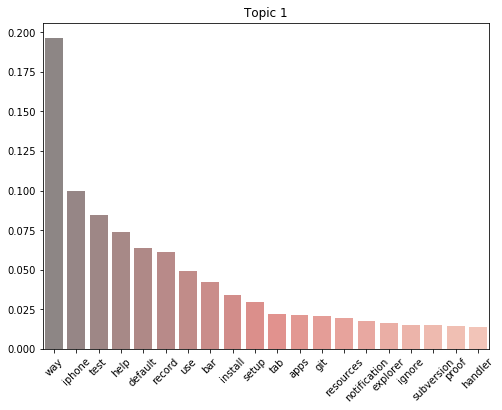

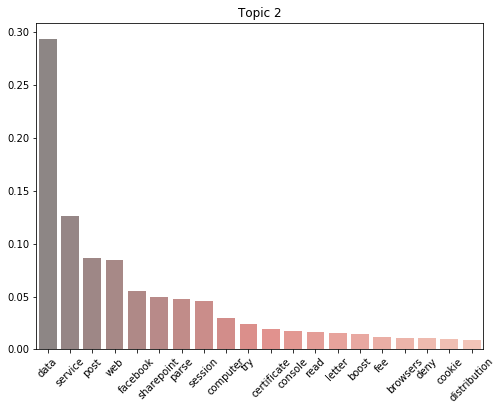

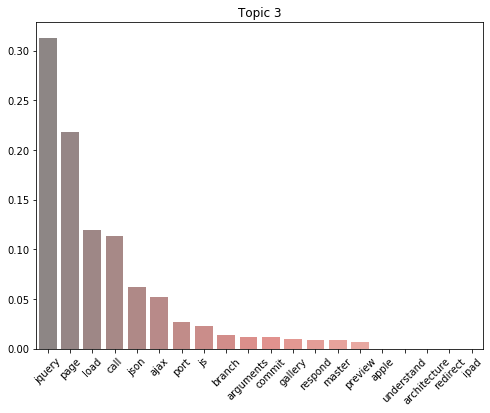

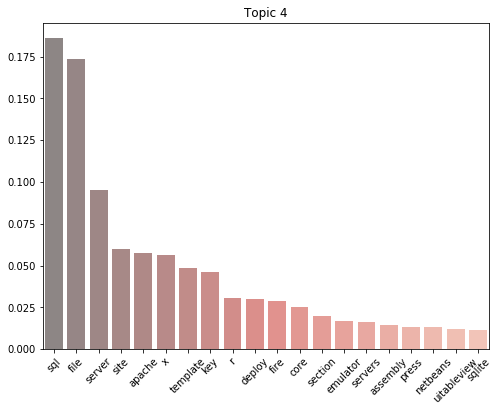

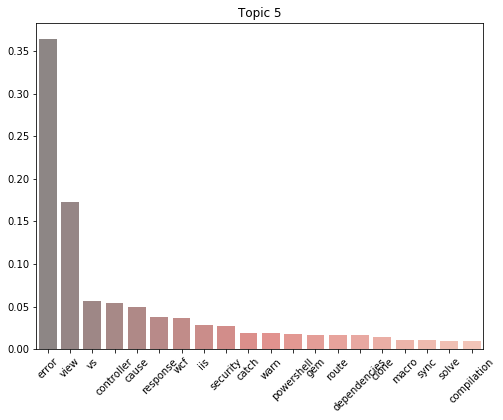

In [0]:
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_4.17.gensim')

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda, texts=df['Title'], coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

# Compute Coherence Score using c_umass
coherence_model_lda = CoherenceModel(model=lda, corpus=corpus_tfidf, coherence='u_mass')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score (C_umass): ', coherence_lda)

#Printing the word distributions in each topic
#for i in range(len(lda.print_topics())):
for i in range(5):
  plt.figure(figsize=(8,6))
  #unzip = list(zip(*lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary,topn=20)[-i-1][0]))
  unzip = list(zip(*lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary,topn=20)[i][0]))
  sns.barplot(x=list(unzip[1]),y=list(unzip[0]),palette='Reds_d',alpha=0.6)
  plt.title('Topic '+str(i+1))
  plt.xticks(rotation=45)

In [0]:
# Visualize the topics
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_4.17.gensim')
pyLDAvis.enable_notebook()
LDAvis_prepared = pyLDAvis.gensim.prepare(lda, corpus, dictionary)
LDAvis_prepared

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL
/usr/local/lib/python3.6/dist-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
36     0.031063 -0.316052       1        1  3.115005
48     0.020885  0.016030       2        1  3.110511
20     0.024869  0.042453       3        1  2.840879
44    -0.387780 -0.009752       4        1  2.650738
12     0.017028  0.008976       5        1  2.544661
40     0.017016  0.009182       6        1  2.516405
37     0.016975  0.009769       7        1  2.456555
28     0.016993  0.009498       8        1  2.454118
46     0.016983  0.009632       9        1  2.401365
18     0.016959  0.009982      10        1  2.271218
1      0.021319  0.021415      11        1  2.221095
14     0.016978  0.009689      12        1  2.216641
15     0.028516 -0.099628      13        1  2.174212
4      0.016960  0.009950      14        1  2.159831
2      0.029915 -0.305414      15        1  2.146813
31     0.016907  0.010638      16        1  2.144948
30     0.016924  0.010430      17        1  2.106951
22     0.016891  0.010831      18        1  2.098278
13     0.016915  0.010527      19        1  2.076460
5      0.016923  0.010422      20        1  2.051846
19     0.020698  0.017609      21        1  2.047072
23     0.016872  0.011053      22        1  2.031263
39     0.016873  0.011057      23        1  2.026081
10     0.027627  0.147694      24        1  2.011992
6      0.016877  0.011000      25        1  1.985822
45     0.029501 -0.117119      26        1  1.969777
24     0.016858  0.011222      27        1  1.941552
32     0.016870  0.011092      28        1  1.873694
8      0.016878  0.010998      29        1  1.869220
0     -0.085733  0.005570      30        1  1.863466
29     0.016831  0.011535      31        1  1.847910
41     0.016804  0.011855      32        1  1.831671
26     0.016831  0.011544      33        1  1.819387
3      0.016826  0.011615      34        1  1.781005
33     0.024614  0.043386      35        1  1.775413
11     0.016788  0.012020      36        1  1.749910
9      0.016832  0.011558      37        1  1.698377
49     0.021172  0.022392      38        1  1.687016
7      0.016753  0.012416      39        1  1.666796
42     0.016736  0.012613      40        1  1.616146
27     0.016716  0.012790      41        1  1.611040
47     0.016734  0.012637      42        1  1.589999
21     0.016678  0.013181      43        1  1.578938
38    -0.035474  0.010238      44        1  1.574188
17    -0.371266 -0.010700      45        1  1.551332
35     0.016667  0.013356      46        1  1.537815
16     0.027395  0.146892      47        1  1.498582
34     0.016686  0.013220      48        1  1.452899
25     0.016561  0.014275      49        1  1.430007
43     0.016557  0.014420      50        1  1.323104, topic_info=    Category        Freq     Term        Total  loglift  logprob
81   Default  2529.00000     work  2529.000000  30.0000  30.0000
188  Default  2544.00000    value  2544.000000  29.0000  29.0000
97   Default  2642.00000   jquery  2642.000000  28.0000  28.0000
6    Default  2487.00000    error  2487.000000  27.0000  27.0000
38   Default  2365.00000      php  2365.000000  26.0000  26.0000
..       ...         ...      ...          ...      ...      ...
339  Topic50     0.02357      ie7    83.596046  -3.8486 -11.9332
333  Topic50     0.02357   parser    81.664368  -3.8252 -11.9332
332  Topic50     0.02357      run   304.514923  -5.1413 -11.9332
320  Topic50     0.02357     post   726.980042  -6.0115 -11.9332
323  Topic50     0.02357  webview   108.254921  -4.1071 -11.9332

[2019 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
732      16  0.981610  .htaccess
28       32  0.998971       .net
539      17  0.984598         \\
565       4  0.992086     \\frac
935      44  0.986541   \\mathbb
...     ...       ...        ...
748      18  0.989522    youtube
919      20  0.987114          z
812       9  0.992274       zend
975      37  0.99296

### Topic 1

**Web development**

### Topic 2

**Cloud services** appears to be a clear topic with words such as **data, service, web, sharepoint, session etc.**.
Another not so obvious theme is **social media** with words as **facebook and post**. 

### Topic 3

**Smartphone, apps**

### Topic 4

**Database management, database services**

### Topic 5

Topics are not too clear but something like **scripting** may still be valid. 



# 5.9 Model 4.21 => TFIDF, no_below=10, no_above=0.5, keep_n=10000, topics=50, passes=10

In [0]:
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_4.21.gensim')

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda, texts=df['Title'], coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

# Compute Coherence Score using c_umass
coherence_model_lda = CoherenceModel(model=lda, corpus=corpus_tfidf, coherence='u_mass')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score (C_umass): ', coherence_lda)


Coherence Score:  0.5919832771706817

Coherence Score (C_umass):  -18.19356806786331


In [0]:
# Visualize the topics
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_4.21.gensim')
pyLDAvis.enable_notebook()
LDAvis_prepared = pyLDAvis.gensim.prepare(lda, corpus, dictionary)
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
5     -0.039233 -0.151359       1        1  3.137638
7     -0.169455  0.093521       2        1  2.922985
44     0.093452  0.093687       3        1  2.661363
14     0.030064  0.098584       4        1  2.628651
49    -0.095150 -0.001279       5        1  2.617356
33    -0.119014  0.059437       6        1  2.508792
6     -0.026432 -0.055568       7        1  2.472462
32    -0.009683 -0.160746       8        1  2.452374
25    -0.119082  0.119380       9        1  2.412708
3      0.031871 -0.190590      10        1  2.328241
18    -0.041537  0.065723      11        1  2.250053
19     0.093130 -0.020962      12        1  2.214772
15    -0.032039  0.115161      13        1  2.142312
4      0.132478 -0.026823      14        1  2.127496
24     0.083551 -0.018524      15        1  2.106636
29    -0.002965 -0.066966      16        1  2.106355
28     0.009839 -0.093395      17        1  2.085475
40    -0.106922  0.062230      18        1  2.074502
17    -0.038638 -0.075663      19        1  2.048373
41    -0.007447 -0.106463      20        1  2.023396
38     0.084872  0.152691      21        1  1.987786
22     0.042367 -0.022899      22        1  1.967599
21    -0.120854  0.041348      23        1  1.962993
48    -0.064596 -0.011234      24        1  1.960792
8     -0.062588 -0.072946      25        1  1.954609
34    -0.132380 -0.000505      26        1  1.952733
30    -0.076033  0.093203      27        1  1.948756
37     0.097758  0.004352      28        1  1.935630
0      0.014025 -0.032735      29        1  1.895909
35    -0.118048 -0.055039      30        1  1.893983
20     0.080870  0.147038      31        1  1.828401
42    -0.027771  0.000278      32        1  1.817413
27    -0.080849 -0.033279      33        1  1.800149
12    -0.004692  0.011789      34        1  1.773323
31     0.124038  0.028170      35        1  1.762060
45     0.087822 -0.031012      36        1  1.756483
11    -0.012875 -0.032163      37        1  1.745193
47     0.012987 -0.046165      38        1  1.739280
23     0.016051 -0.017810      39        1  1.726533
1      0.071409  0.007556      40        1  1.705161
16     0.009217 -0.074734      41        1  1.692267
43    -0.036554  0.024309      42        1  1.677505
10     0.045407 -0.008074      43        1  1.657055
39     0.117922  0.020315      44        1  1.633419
26    -0.053902  0.098373      45        1  1.600031
9      0.127855  0.107793      46        1  1.585448
13     0.045375 -0.010002      47        1  1.529857
2     -0.001527  0.019643      48        1  1.499917
46     0.018117 -0.091257      49        1  1.478071
36     0.129788  0.043609      50        1  1.209704, topic_info=     Category         Freq          Term        Total  loglift  logprob
95    Default  2205.000000          work  2205.000000  30.0000  30.0000
231   Default  1875.000000      function  1875.000000  29.0000  29.0000
223   Default  2001.000000         value  2001.000000  28.0000  28.0000
93    Default  1641.000000          java  1641.000000  27.0000  27.0000
169   Default  1558.000000         class  1558.000000  26.0000  26.0000
...       ...          ...           ...          ...      ...      ...
2649  Topic50    38.166946     providers    39.998074   4.3679  -4.6124
3042  Topic50    38.020493  arrayadapter    39.851620   4.3678  -4.6162
2516  Topic50    37.826389  intersection    39.657516   4.3675  -4.6213
328   Topic50    33.887943          crop    35.719070   4.3622  -4.7313
111   Topic50    55.596607          data  1877.769653   0.8951  -4.2362

[1674 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
308       2  0.963539         -1
1074     10  0.979128  .htaccess
30       33  0.996280       .net
711      25  0.958253         \\
755      12  0.970796     \\frac
...     ...       ...        ...
1707      9  0.968567          z
12

# 5.10 Model 4.20 => TFIDF, no_below=10, no_above=0.5, keep_n=10000, topics=20, passes=10

In [0]:
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_4.20.gensim')

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda, texts=df['Title'], coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

# Compute Coherence Score using c_umass
coherence_model_lda = CoherenceModel(model=lda, corpus=corpus_tfidf, coherence='u_mass')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score (C_umass): ', coherence_lda)


Coherence Score:  0.4431441893527662

Coherence Score (C_umass):  -17.80662626345269


In [0]:
# Visualize the topics
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_4.20.gensim')
pyLDAvis.enable_notebook()
LDAvis_prepared = pyLDAvis.gensim.prepare(lda, corpus, dictionary)
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
5     -0.188594  0.027786       1        1  6.392612
3     -0.095866 -0.004556       2        1  5.844680
6      0.048536 -0.227851       3        1  5.714408
17     0.102194 -0.018704       4        1  5.571688
12    -0.006393  0.036621       5        1  5.460271
0     -0.000364  0.121444       6        1  5.402893
13    -0.031369  0.002303       7        1  5.332961
7     -0.083772 -0.059858       8        1  5.137836
18    -0.244242  0.001302       9        1  5.066360
14    -0.005866  0.015094      10        1  4.835660
9     -0.039449 -0.068416      11        1  4.833244
8      0.110863  0.110712      12        1  4.822630
10     0.012032  0.155345      13        1  4.814956
19     0.062074  0.008185      14        1  4.790608
15     0.223355 -0.001799      15        1  4.641552
16     0.002331  0.129615      16        1  4.599113
11     0.086939  0.070406      17        1  4.455665
2      0.158101 -0.013461      18        1  4.248557
1     -0.125208  0.025376      19        1  4.053938
4      0.014696 -0.309544      20        1  3.980375, topic_info=     Category         Freq     Term        Total  loglift  logprob
169   Default  1555.000000    class  1555.000000  30.0000  30.0000
50    Default  1309.000000    array  1309.000000  29.0000  29.0000
98    Default  1165.000000   python  1165.000000  28.0000  28.0000
348   Default  1053.000000    issue  1053.000000  27.0000  27.0000
244   Default  1035.000000  problem  1035.000000  26.0000  26.0000
...       ...          ...      ...          ...      ...      ...
1355  Topic20    82.367073  entries    84.145721   3.2024  -5.0340
880   Topic20    81.159821     mock    82.938469   3.2021  -5.0488
390   Topic20   556.391052    table   786.254700   2.8780  -3.1237
223   Topic20   129.516922    value  1967.884155   0.5029  -4.5814
93    Topic20    99.774857     java  1598.556763   0.4499  -4.8423

[721 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
30       18  0.997194     .net
219       1  0.076123   access
219       2  0.302763   access
219       5  0.064878   access
219       6  0.071798   access
...     ...       ...      ...
21       15  0.810625      xml
834      17  0.978700    xpath
1107     19  0.983511  youtube
1283     20  0.987741     zend
2172     17  0.978312      zip

[1063 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 4, 7, 18, 13, 1, 14, 8, 19, 15, 10, 9, 11, 20, 16, 17, 12, 3, 2, 5])

# 5.11 TFIDF => no_below=10, no_above=0.5,keep_n=1000, num_topics=40, passes=10

In [0]:
dictionary = corpora.Dictionary(df['Title'])
dictionary.filter_extremes(no_below=10, no_above=0.5, keep_n=1000)
corpus = [dictionary.doc2bow(doc) for doc in df['Title']]
tfidf = models.TfidfModel(corpus)
corpus_tfidf = tfidf[corpus]
lda = gensim.models.ldamodel.LdaModel(corpus_tfidf,num_topics=40,id2word=dictionary,passes=10)
lda.save('/content/drive/My Drive/lda_5.9.1.gensim')

Streaming output truncated to the last 5000 lines.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Us

In [0]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda, texts=df['Title'], coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

# Compute Coherence Score using c_umass
coherence_model_lda = CoherenceModel(model=lda, corpus=corpus_tfidf, coherence='u_mass')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score (C_umass): ', coherence_lda)


Coherence Score:  0.5769361361875802

Coherence Score (C_umass):  -16.108231154357696


In [0]:
# Visualize the topics
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_5.9.1.gensim')
pyLDAvis.enable_notebook()
LDAvis_prepared = pyLDAvis.gensim.prepare(lda, corpus, dictionary)
LDAvis_prepared

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL
/usr/local/lib/python3.6/dist-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
0      0.057195 -0.339444       1        1  3.383796
32    -0.247450  0.033366       2        1  3.243850
16    -0.076809  0.022802       3        1  3.157118
5      0.077038  0.014606       4        1  3.106854
20     0.076948  0.014067       5        1  3.029041
9      0.041010  0.038571       6        1  3.028666
21    -0.142272  0.027440       7        1  2.923466
14    -0.151323  0.017363       8        1  2.898984
22     0.022539  0.013556       9        1  2.870729
23    -0.131463  0.017074      10        1  2.858811
4      0.076822  0.014198      11        1  2.830033
19    -0.010030  0.013868      12        1  2.809456
17     0.088232  0.033263      13        1  2.772591
39     0.035578  0.032051      14        1  2.766033
29    -0.133860  0.026349      15        1  2.727827
34    -0.015878 -0.274595      16        1  2.720795
24     0.076717  0.014509      17        1  2.702869
18     0.014693  0.028695      18        1  2.682122
30     0.128636  0.054208      19        1  2.594126
6      0.076608  0.014335      20        1  2.560581
15    -0.062160  0.014846      21        1  2.540899
1     -0.024591  0.014081      22        1  2.522792
2     -0.111546  0.030647      23        1  2.520054
13     0.025900  0.028799      24        1  2.448385
35     0.090867  0.039395      25        1  2.433954
7      0.076399  0.014760      26        1  2.394936
31    -0.039368 -0.237075      27        1  2.360820
38    -0.145867  0.020199      28        1  2.337582
27     0.076151  0.014732      29        1  2.228973
36     0.078458  0.026793      30        1  2.131134
37     0.011026  0.030489      31        1  2.062933
26    -0.027462  0.014471      32        1  2.022905
8     -0.016190  0.014436      33        1  2.011955
33     0.004177  0.017859      34        1  1.960091
11     0.041532  0.026756      35        1  1.900421
12     0.127437  0.053814      36        1  1.849077
25    -0.018175  0.014561      37        1  1.793935
28    -0.005203  0.014423      38        1  1.684943
10    -0.018542  0.014603      39        1  1.667854
3      0.074227  0.015128      40        1  1.458611, topic_info=    Category         Freq          Term        Total  loglift  logprob
81   Default  2243.000000          work  2243.000000  30.0000  30.0000
188  Default  2090.000000         value  2090.000000  29.0000  29.0000
195  Default  2008.000000      function  2008.000000  28.0000  28.0000
96   Default  2089.000000          data  2089.000000  27.0000  27.0000
6    Default  2058.000000         error  2058.000000  26.0000  26.0000
..       ...          ...           ...          ...      ...      ...
328  Topic40     0.052509      position   375.982971  -4.6486 -11.2296
260  Topic40     0.052509  relationship   139.812149  -3.6594 -11.2296
326  Topic40     0.052509      elements   532.149170  -4.9960 -11.2296
338  Topic40     0.052509     integrate   160.061432  -3.7946 -11.2296
325  Topic40     0.052509    background   341.578613  -4.5527 -11.2296

[1414 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
732       2  0.979850  .htaccess
28       32  0.997391       .net
539      26  0.973428         \\
565       6  0.980355     \\frac
935      32  0.985525   \\mathbb
...     ...       ...        ...
748      15  0.982766    youtube
919      32  0.975195          z
812      30  0.988398       zend
975       2  0.981566        zip
686       8  0.987950       zoom

[1030 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 33, 17, 6, 21, 10, 22, 15, 23, 24, 5, 20, 18, 40, 30, 35, 25, 19, 31, 7, 16, 2, 3, 14, 36, 8, 32, 39, 28, 37, 38, 27, 9, 34, 12, 13, 26, 29, 11, 4])

### Topic 1

The top words such as **class, php, program, ruby** seem to strongly indicate
**programming and scripting** as topics. However, other words such as **mac, crash,confugration** 
indicate **operating systemm**. 

### Topic 2

The second topic is not too clear. However, words such as **access, file, form, check, action, email, phone, chrome, encode** 
would indicate topics such as **authentication and login**. 

### Topic 3

**User interface, web pages**

### Topic 4

**Apps, smartphone**

### Topic 5

**windows software, windows software**

# 5.12 TFIDF => no_below=10, no_above=0.5,keep_n=1000, num_topics=60, passes=10

In [0]:
dictionary = corpora.Dictionary(df['Title'])
dictionary.filter_extremes(no_below=10, no_above=0.5, keep_n=1000)
corpus = [dictionary.doc2bow(doc) for doc in df['Title']]
tfidf = models.TfidfModel(corpus)
corpus_tfidf = tfidf[corpus]
lda = gensim.models.ldamodel.LdaModel(corpus_tfidf,num_topics=60,id2word=dictionary,passes=10)
lda.save('/content/drive/My Drive/lda_5.9.2.gensim')

Streaming output truncated to the last 5000 lines.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Us

In [0]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda, texts=df['Title'], coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

# Compute Coherence Score using c_umass
coherence_model_lda = CoherenceModel(model=lda, corpus=corpus_tfidf, coherence='u_mass')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score (C_umass): ', coherence_lda)


Coherence Score:  0.6172070171367121

Coherence Score (C_umass):  -17.043963470180962


In [0]:
# Visualize the topics
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_5.9.2.gensim')
pyLDAvis.enable_notebook()
LDAvis_prepared = pyLDAvis.gensim.prepare(lda, corpus, dictionary)
LDAvis_prepared

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL
/usr/local/lib/python3.6/dist-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
43     0.101176 -0.202909       1        1  2.743946
4     -0.002773 -0.106472       2        1  2.587065
50    -0.018140 -0.065604       3        1  2.569936
27    -0.046621  0.076951       4        1  2.480636
51    -0.074545  0.031348       5        1  2.402562
25    -0.049174 -0.014211       6        1  2.267773
36    -0.063631  0.026304       7        1  2.200217
42     0.126275  0.152144       8        1  2.195812
10     0.212126  0.176009       9        1  2.186860
28    -0.063467  0.026350      10        1  2.142285
58     0.014056 -0.090833      11        1  2.127856
6     -0.063596  0.026420      12        1  2.039676
41    -0.063523  0.026492      13        1  1.946572
44    -0.063477  0.026424      14        1  1.937938
30    -0.063624  0.026465      15        1  1.926892
15    -0.003133 -0.065233      16        1  1.906041
55     0.170636 -0.046898      17        1  1.895859
46     0.039062 -0.126018      18        1  1.867632
33    -0.063453  0.026447      19        1  1.843196
35     0.049807 -0.140965      20        1  1.842503
52    -0.063398  0.026532      21        1  1.829129
1     -0.063351  0.026475      22        1  1.816039
56    -0.074097  0.031418      23        1  1.806299
29    -0.063347  0.026467      24        1  1.783894
49     0.095286  0.018979      25        1  1.770964
54    -0.062296  0.015259      26        1  1.759429
3      0.003471 -0.074586      27        1  1.705907
32     0.018802 -0.114977      28        1  1.684150
53    -0.063259  0.026470      29        1  1.657290
47     0.010226  0.006459      30        1  1.647395
45    -0.063181  0.026537      31        1  1.577671
48     0.152132  0.048301      32        1  1.559002
22     0.120170  0.023727      33        1  1.535258
20    -0.039790 -0.038973      34        1  1.534185
11    -0.013165 -0.049672      35        1  1.511546
14    -0.063139  0.026531      36        1  1.511025
8     -0.062754  0.026548      37        1  1.456844
34     0.092487  0.116879      38        1  1.453740
21     0.092325  0.178032      39        1  1.451415
17    -0.007664 -0.057350      40        1  1.447944
12     0.132914  0.038657      41        1  1.436083
0     -0.062601  0.026627      42        1  1.366791
57    -0.075022  0.048600      43        1  1.352089
26     0.122717 -0.017568      44        1  1.345037
13    -0.022507 -0.035023      45        1  1.342477
9      0.059072 -0.016074      46        1  1.334374
31    -0.045706  0.098576      47        1  1.285524
18     0.008787 -0.089162      48        1  1.277582
19    -0.023834 -0.032515      49        1  1.259896
7      0.141998 -0.087868      50        1  1.226656
16     0.008160 -0.100647      51        1  1.225595
39    -0.006761 -0.058006      52        1  1.219410
40    -0.040640 -0.007250      53        1  1.198989
38    -0.047196  0.002992      54        1  1.196617
37     0.058075  0.095690      55        1  1.161848
24    -0.061956  0.026717      56        1  1.131114
59    -0.061880  0.026714      57        1  1.044422
5      0.005758 -0.090666      58        1  1.020439
23    -0.047467  0.092221      59        1  1.016971
2     -0.061350  0.026722      60        1  0.947685, topic_info=    Category         Freq         Term        Total  loglift  logprob
81   Default  2269.000000         work  2269.000000  30.0000  30.0000
6    Default  2135.000000        error  2135.000000  29.0000  29.0000
96   Default  2111.000000         data  2111.000000  28.0000  28.0000
195  Default  1978.000000     function  1978.000000  27.0000  27.0000
68   Default  1689.000000  application  1689.000000  26.0000  26.0000
..       ...          ...          ...          ...      ...      ...
326  Topic60     0.034401     elements   526.156616  -4.9764 -11.2217
325  Topic60     0.034401   background   385.163666  -4.6644 -11.2217
324  Topic60     0.034401          log   

### Topic 1

Not clear

### Topic 2

**API, scripting**

### Topic 3

**databases, programming, app development**

### Topic 4

**databases, query**

### Topic 5

**database management, database systems**

# 5.13 TFIDF => no_below=10, no_above=0.5,keep_n=10000, num_topics=40, passes=10

In [0]:
dictionary = corpora.Dictionary(df['Title'])
dictionary.filter_extremes(no_below=10, no_above=0.5, keep_n=10000)
corpus = [dictionary.doc2bow(doc) for doc in df['Title']]
tfidf = models.TfidfModel(corpus)
corpus_tfidf = tfidf[corpus]
lda = gensim.models.ldamodel.LdaModel(corpus_tfidf,num_topics=40,id2word=dictionary,passes=10,random_state=100)
lda.save('/content/drive/My Drive/lda_5.9.3.gensim')

In [0]:
# Visualize the topics
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_5.9.3.gensim')
pyLDAvis.enable_notebook()
LDAvis_prepared = pyLDAvis.gensim.prepare(lda, corpus, dictionary)
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
0      0.043443 -0.117396       1        1  3.624063
30    -0.113962  0.109123       2        1  3.461869
31    -0.034875 -0.169872       3        1  3.385405
5     -0.118975 -0.174915       4        1  3.344213
3      0.064288  0.020852       5        1  3.146576
25     0.006922 -0.029784       6        1  3.013689
20     0.262095 -0.106917       7        1  2.996841
38    -0.154380 -0.136717       8        1  2.920804
4     -0.080880 -0.045007       9        1  2.833297
19     0.032984 -0.019477      10        1  2.782000
7     -0.030077  0.025882      11        1  2.736821
24    -0.108413 -0.093979      12        1  2.640409
29     0.000776  0.043830      13        1  2.619652
14    -0.009847  0.051367      14        1  2.533233
21     0.091145  0.008737      15        1  2.461371
17     0.007706  0.036867      16        1  2.416607
10    -0.014601  0.153901      17        1  2.411535
13     0.059000 -0.062985      18        1  2.390039
36     0.110348 -0.046524      19        1  2.359834
16     0.107258 -0.107415      20        1  2.349949
39     0.050883  0.065989      21        1  2.345237
15     0.013594  0.033448      22        1  2.318651
8      0.028202  0.103041      23        1  2.315989
28    -0.061721  0.004687      24        1  2.300627
18     0.061593  0.069858      25        1  2.293449
37    -0.051398  0.011115      26        1  2.291241
34     0.003854  0.085162      27        1  2.262337
9     -0.060020  0.037860      28        1  2.260171
32    -0.002072 -0.053746      29        1  2.256666
23     0.036987 -0.038273      30        1  2.206621
22     0.162108  0.052726      31        1  2.190171
33    -0.083714  0.041184      32        1  2.174210
35     0.086375  0.038085      33        1  2.129391
6     -0.033511  0.076186      34        1  2.118583
1     -0.065727 -0.111626      35        1  2.082976
11    -0.056848  0.058524      36        1  2.058549
26    -0.135941  0.132122      37        1  2.030858
27    -0.021681  0.060250      38        1  2.006027
12     0.064669  0.069443      39        1  2.002625
2     -0.055585 -0.075605      40        1  1.927412, topic_info=     Category         Freq         Term        Total  loglift  logprob
231   Default  1976.000000     function  1976.000000  30.0000  30.0000
38    Default  1495.000000      windows  1495.000000  29.0000  29.0000
23    Default  1586.000000   javascript  1586.000000  28.0000  28.0000
8     Default  1484.000000         list  1484.000000  27.0000  27.0000
81    Default  1487.000000  application  1487.000000  26.0000  26.0000
...       ...          ...          ...          ...      ...      ...
1565  Topic40    50.281216       beamer    52.105049   3.9134  -4.8023
682   Topic40    50.129833     backbone    51.953667   3.9133  -4.8053
2455  Topic40    48.672581    passwords    50.496414   3.9122  -4.8348
111   Topic40    85.738403         data  1876.630859   0.8631  -4.2686
41    Topic40    72.780823          php  1880.798828   0.6970  -4.4325

[1367 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
308      34  0.974519         -1
1074     13  0.978255  .htaccess
30       37  0.996847       .net
755      34  0.966164     \\frac
1863     13  0.980673   \\mathbb
...     ...       ...        ...
1107     16  0.982669    youtube
1707     20  0.973125          z
1283     39  0.990503       zend
2172     27  0.983365        zip
970      36  0.978977       zoom

[1554 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 31, 32, 6, 4, 26, 21, 39, 5, 20, 8, 25, 30, 15, 22, 18, 11, 14, 37, 17, 40, 16, 9, 29, 19, 38, 35, 10, 33, 24, 23, 34, 36, 7, 2, 12, 27, 28, 13, 3])

In [0]:
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_5.9.3.gensim')

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda, texts=df['Title'], coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

# Compute Coherence Score using c_umass
coherence_model_lda = CoherenceModel(model=lda, corpus=corpus_tfidf, coherence='u_mass')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score (C_umass): ', coherence_lda)


Coherence Score:  0.5192750435939699

Coherence Score (C_umass):  -17.93721138946228


Topic 1

Words such as **class, array, reference, property** indicate topics such as **scripting** while words 
such as **wordpress, document, items, filter, columns, add, title, tab, rule" sound indicate **document/report formatting**. 

Topic 2

Words such as **application, asp.net, web, page, service, install, mvc, secure, jquery** point towards **web applications**. 
Others such as **parameter, comment, example, case, operator** indicate **syntax**. These two topics can further be combined into **web development**. 

Topic 3

**function, javascript, r, state, call, pointer, delete, php** indicate **programming**. Words such as **cpu, ubuntu, mac, controller** sound like **computer systems**. 

Topic 4

Words such as **access, method, program, call, php, json, import, shell** indicate **scripting, programming**. **Internet, certificate, account, validate, operation** strongly indicate **authentication**. 

Topic 5

*server, sql, store, directory, site, template, database, schema** indicate **databases, database systems**. Words such as **authentication, remote, proxy, sign, server** indicate **servers**. 
These topics could be combined into **database servers**. 

# 5.14 TFIDF => no_below=10, no_above=0.5,keep_n=10000, num_topics=30, passes=10

# 5.15 Initial model selection

In [0]:
dictionary = corpora.Dictionary(df['Title'])
dictionary.filter_extremes(no_below=10, no_above=0.5, keep_n=10000)
corpus = [dictionary.doc2bow(doc) for doc in df['Title']]
tfidf = models.TfidfModel(corpus)
corpus_tfidf = tfidf[corpus]
lda = gensim.models.ldamodel.LdaModel(corpus_tfidf,num_topics=30,id2word=dictionary,passes=10,random_state=100)
lda.save('/content/drive/My Drive/lda_5.9.4.gensim')

In [0]:
# Visualize the topics
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_5.9.4.gensim')
pyLDAvis.enable_notebook()
LDAvis_prepared = pyLDAvis.gensim.prepare(lda, corpus, dictionary)
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
0      0.105859 -0.171327       1        1  4.895000
22     0.057531  0.258633       2        1  4.213014
20     0.174308  0.051412       3        1  3.977839
28     0.261404  0.018084       4        1  3.956956
14     0.018441 -0.029170       5        1  3.833798
8     -0.093715  0.020423       6        1  3.772650
21     0.107712 -0.137006       7        1  3.633085
29    -0.120645 -0.094127       8        1  3.506532
13    -0.079803 -0.116533       9        1  3.480463
23    -0.060977  0.002403      10        1  3.477796
9     -0.210903  0.068973      11        1  3.457511
1     -0.041445  0.004220      12        1  3.419193
5     -0.043782  0.064042      13        1  3.409750
3      0.085235 -0.006816      14        1  3.369276
25     0.019303 -0.041494      15        1  3.360999
4      0.061165  0.055135      16        1  3.334476
15    -0.072976 -0.016323      17        1  3.324750
11    -0.016382 -0.026504      18        1  3.166896
12     0.071761  0.064937      19        1  3.055639
7      0.092699 -0.122235      20        1  3.026745
24     0.056662  0.008917      21        1  3.021778
10    -0.070351 -0.076320      22        1  3.018431
18    -0.087000  0.021661      23        1  2.914592
2     -0.043063  0.002595      24        1  2.914372
17    -0.082173 -0.102914      25        1  2.857182
26    -0.004295  0.053088      26        1  2.839654
16    -0.049139  0.159135      27        1  2.790543
27    -0.021356 -0.109526      28        1  2.752896
19    -0.021383  0.042329      29        1  2.619904
6      0.007309  0.154306      30        1  2.598282, topic_info=     Category         Freq         Term        Total  loglift  logprob
81    Default  1418.000000  application  1418.000000  30.0000  30.0000
8     Default  1387.000000         list  1387.000000  29.0000  29.0000
104   Default  1281.000000         code  1281.000000  28.0000  28.0000
231   Default  1960.000000     function  1960.000000  27.0000  27.0000
96    Default  1363.000000            c  1363.000000  26.0000  26.0000
...       ...          ...          ...          ...      ...      ...
1346  Topic30    89.932899    operators    91.745834   3.6304  -4.5200
674   Topic30    88.728905       height    90.541840   3.6301  -4.5335
193   Topic30    83.766594   encryption    85.579529   3.6289  -4.5911
2031  Topic30    83.711067     platform    85.524002   3.6289  -4.5917
952   Topic30    81.076920        align    82.889854   3.6282  -4.6237

[1057 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
1074     28  0.978556  .htaccess
30       22  0.997490       .net
1863     17  0.975738   \\mathbb
219       1  0.093638     access
219       3  0.043812     access
...     ...       ...        ...
1519     17  0.983153       year
1107     23  0.980855    youtube
1283     16  0.986546       zend
2172     10  0.979682        zip
970      12  0.986525       zoom

[1302 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 23, 21, 29, 15, 9, 22, 30, 14, 24, 10, 2, 6, 4, 26, 5, 16, 12, 13, 8, 25, 11, 19, 3, 18, 27, 17, 28, 20, 7])

In [0]:
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_5.9.4.gensim')

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda, texts=df['Title'], coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

# Compute Coherence Score using c_umass
coherence_model_lda = CoherenceModel(model=lda, corpus=corpus_tfidf, coherence='u_mass')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score (C_umass): ', coherence_lda)


Coherence Score:  0.5192750435939699

Coherence Score (C_umass):  -17.93721138946228


Topic 1

Words such as **function, array, javascript, class, value, php, property, input** strongly indicate **scripting,programming,syntax**. 
The other topics are not too clear. 

Topic 2

**c, android, asp.net, app, web, mvc** indicate **apps, app development, web development**. Words such as **database, site, crash, design, page, panel, service** indicate *web pages, web services**. 
These can be comined into **app development, web development**. 

Topic 3

Words like **mysql, query, command, key, execute, line, range, sql, operation** indicate **databases, query**. **linux, directory, memory, server** indicate **linux servers**. 
**Key, cache, certificate,server** indicate authentication. 

Topic 4

**server, sql, html, rail, client, browser, http** indicate **web applications, web frameworks, databases**. 

Topic 5

**web services**

**Parameters kept constant:** 
- n_below: 10
- n_above: 0.5

**Tuned parameters:** 

- TFIDF vs BOW

TFIDF appears to provide slightly clearer topics. Much of this interpretation is subjective and depends on manual analysis of word distributions in each topic. 

- Number of topics

About 20 to 50 topics seems to be the optimal number of topics. As the number of topics increases beyond 50, the number of important words within each topic becomes lesser and after a point, the topic is not interpretable anymore. On the other hand, if the number of topics is less than 20, the topics become too general and would consist of many topics. 

- *keep_n*

In order to further optimize the number of topics, we also changed the number of most frequent words to include in the model. When that number is increased from 1000 to 10000, there are two noticeable changes: 
1. The topics on the PoCA graph are now more even spread out. Before, a lot of the topics would be close to each other or concentrated in one area. Now, due to the higher number of words being considered, the semantic separation between topics appears to be clearer. 
2. Secondly, the number of important words within each topic has increased, which is mostly due to the higher number of total words in the model. As a result, the word distribution bar chart is now less right skewed and has a more even distribution. Due to this, there are more words available to describe the different topics. 

After evaluating models 5.9, 5.10, 5.13 and 5.14, the best model still appears to be model 5.13 which uses TFIDF, 40 topics and a *keep_n* value of 10,000. We can proceed with further model optimization using this model. 

In [0]:
df_model_sel = pd.read_csv('/content/drive/My Drive/topics_keep_vs_coherence.csv')
df_1000 = df_model_sel[df_model_sel['keep_n']==1000]
df_10000 = df_model_sel[df_model_sel['keep_n']==10000]
df_model_sel

,num_topics,keep_n,c_v,c_umass
0,20,1000,0.4289,-11.9389
1,20,10000,0.4431,-17.8066
2,30,10000,0.5192,-17.9372
3,40,1000,0.5769,-16.1082
4,40,10000,0.5192,-17.9372
5,50,1000,0.6048,-17.8427
6,50,10000,0.5919,-18.1935
7,60,1000,0.6172,-17.0439
8,100,1000,0.6647,-18.0425
9,150,1000,0.6878,-18.1091


Text(0, 0.5, 'Coherence score (c_v)')

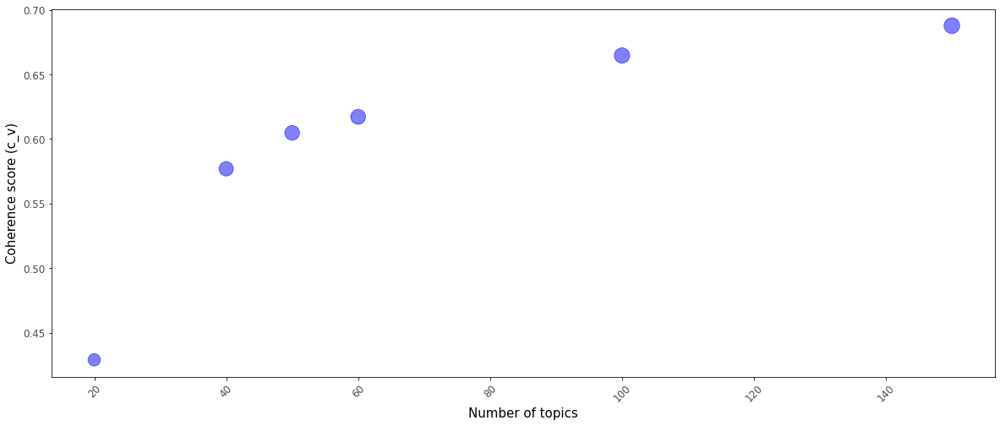

In [0]:
#Plotting C_umass coherence scores
plt.figure(figsize=(20,8))
plt.scatter(df_1000['num_topics'],df_1000['c_v'],s=df_1000['c_v'].apply(np.abs)*500,alpha=0.5,c='blue')
plt.xticks(rotation=45,size=12,alpha=0.7)
plt.yticks(size=12,alpha=0.7)
plt.xlabel('Number of topics',size=15)
plt.ylabel('Coherence score (c_v)',size=15)

The plot above shows that the c_v coherence score increases, almost in linear fashion, with increasing number of topics. Also, there is a slight indication of a flattening of the curve as we reach 150 topics. 

Text(0, 0.5, 'Coherence score (c_umass)')

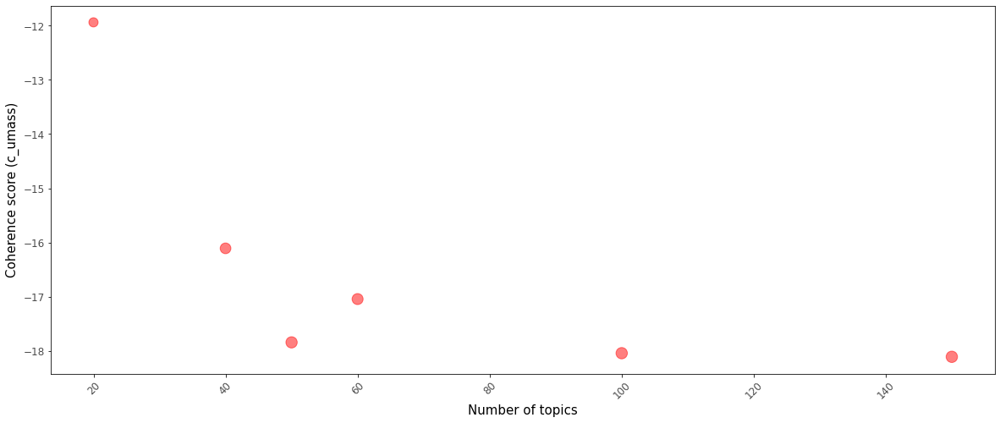

In [0]:
#Plotting C_umass coherence scores
plt.figure(figsize=(20,8))
plt.scatter(df_1000['num_topics'],df_1000['c_umass'],s=df_1000['c_umass'].apply(np.abs)*10,alpha=0.5,c='red')
plt.xticks(rotation=45,size=12,alpha=0.7)
plt.yticks(size=12,alpha=0.7)
plt.xlabel('Number of topics',size=15)
plt.ylabel('Coherence score (c_umass)',size=15)

The above plot shows the relation between the umass score and the number topics. In contrary to the c_v score, the umass score actually decreases with increasing number of topics. However, it is to be noted that the rate of decrease flattens beyond a 100 topics. 

# 6. Hyperparameter tuning

### Hyperparameters
- ***Number of topics***: This was optimized in the previous section based on some manual evaluation of topics and word probabilities in each topic. 
- ***Alpha***: Document-topic density. 

https://stackoverflow.com/questions/54762690/coherence-score-0-4-is-good-or-bad

Coherence measures the relative distance between words within a topic. There are two major types C_V typically 0 < x < 1 and uMass -14 < x < 14. It's rare to see a coherence of 1 or +.9 unless the words being measured are either identical words or bigrams. Like United and States would likely return a coherence score of ~.94 or hero and hero would return a coherence of 1. The overall coherence score of a topic is the average of the distances between words. I try and attain a .7 in my LDAs if I'm using c_v I think that is a strong topic correlation. I would say:

.3 is bad

.4 is low

.55 is okay

.65 might be as good as it is going to get

.7 is nice

.8 is unlikely and

.9 is probably wrong

Low coherence fixes:

adjust your parameters alpha = .1, beta = .01 or .001, seed = 123, ect

get better data

at .4 you probably have the wrong number of topics check out https://datascienceplus.com/evaluation-of-topic-modeling-topic-coherence/ for what is known as the elbow method - it gives you a graph of the optimal number of topics for greatest coherence in your data set. I'm using mallet which has pretty good coherance here is code to check coherence for different numbers of topics:

- ***Beta***: Word-topic density.

https://stats.stackexchange.com/questions/375062/how-does-topic-coherence-score-in-lda-intuitively-makes-sense

The coherence score is for assessing the quality of the learned topics.

For one topic, the words i,j being scored in ∑i<jScore(wi,wj) have the highest probability of occurring for that topic. You need to specify how many words in the topic to consider for the overall score.

For the "UMass" measure, the numerator D(wi,wj) is the number of documents in which words wi and wj appear together. 1 is added to this term because we are taking logs and we need to avoid taking log of 0 when the two words never appear together. The denominator is the number of documents D(wi) appears in. So the score is higher if wi and wj appear together in documents a lot relative to how often wi alone appears in documents. This makes sense as a measure of topic coherence, since if two words in a topic really belong together you would expect them to show up together a lot. The denominator is just adjusting for the document frequency of the words you are considering, so that words like "the" don't get an artificially high score.

You could use the topic coherence scores, CS(t) for t=1,…,K, to determine the optimal number K∗ of topics by finding argmaxK1K∑Kt=1CS(t). That is take the average topic coherence score for various settings of K and see which gives the highest average coherence.
### Key metrics
- Topic interpretability
- Word distribution in each topic
- Word distribution in other topics
- Overall word distribution
- Coherence scores

# 6.1 Sweeping *alpha* and *beta* parameters


In [0]:
def lda_tuning(a,b):
  #Model with random state 100
  dictionary = corpora.Dictionary(df['Title'])
  dictionary.filter_extremes(no_below=10, no_above=0.5, keep_n=10000)
  corpus = [dictionary.doc2bow(doc) for doc in df['Title']]
  tfidf = models.TfidfModel(corpus)
  corpus_tfidf = tfidf[corpus]
  lda = gensim.models.ldamodel.LdaModel(corpus_tfidf,num_topics=40,id2word=dictionary,passes=10,alpha=a,eta=b,random_state=100)

  # Compute Coherence Score
  coherence_model_lda = CoherenceModel(model=lda, texts=df['Title'], coherence='c_v')
  coherence_cv = coherence_model_lda.get_coherence()

  # Compute Coherence Score using c_umass
  coherence_model_lda = CoherenceModel(model=lda, corpus=corpus_tfidf, coherence='u_mass')
  coherence_umass = coherence_model_lda.get_coherence()
  
  return coherence_cv, coherence_umass

In [0]:
#Setting up hyperparameter ranges
alpha = list(np.linspace(0.1,1,2))
beta = list(np.linspace(0.1,1,2))

a = []
b = []
cv = []
umass = []

#Running LDA algorithm with 50 topics across the hyperparameter values
for i in alpha:
  for j in beta:
    x,y = lda_tuning(i,j)
    cv.append(x)
    umass.append(y)
    a.append(i)
    b.append(j)

#df_tuning = pd.DataFrame(np.transpose([a,b,cv,umass]),columns={'alpha','beta','c_v','umass'})
#df_tuning.to_csv('/content/drive/My Drive/tuned_hyperparameter_values_retake.csv')

In [0]:
df_tuning = pd.DataFrame(np.transpose([a,b,cv,umass]))
df_tuning.head()

,0,1,2,3
0,0.1,0.1,0.592683,-16.528072
1,0.1,1.0,0.584374,-16.327751
2,1.0,0.1,0.584806,-16.479517
3,1.0,1.0,0.349557,-4.384633


In [0]:
df_tuning.to_csv('/content/drive/My Drive/tuned_hyperparameter_values_model_5.13.csv')

In [0]:
df_tuning = pd.read_csv('/content/drive/My Drive/tuned_hyperparameter_values_retake.csv',index_col=0)
df_tuning.columns = ['alpha','beta','cv','umass']
df_tuning

,alpha,beta,cv,umass
0,0.1,0.1,0.610757,-17.142843
1,0.1,0.4,0.610381,-17.133532
2,0.1,0.7,0.609356,-17.092674
3,0.1,1.0,0.606382,-17.024916
4,0.4,0.1,0.591901,-16.920964
5,0.4,0.4,0.564058,-16.363642
6,0.4,0.7,0.462978,-14.346611
7,0.4,1.0,0.478105,-14.791402
8,0.7,0.1,0.605378,-17.118142
9,0.7,0.4,0.573125,-16.232641


In [0]:
df_tuning.sort_values('cv',ascending=False)

,alpha,beta,cv,umass
0,0.1,0.1,0.610757,-17.142843
1,0.1,0.4,0.610381,-17.133532
2,0.1,0.7,0.609356,-17.092674
3,0.1,1.0,0.606382,-17.024916
8,0.7,0.1,0.605378,-17.118142
12,1.0,0.1,0.597923,-16.540367
4,0.4,0.1,0.591901,-16.920964
9,0.7,0.4,0.573125,-16.232641
13,1.0,0.4,0.564588,-15.641824
5,0.4,0.4,0.564058,-16.363642


In [0]:
df_tuning['a_b'] = df_tuning.apply(lambda x: 'a_' + str(x[0]) + ' b_' + str(x[1]),axis=1)
df_tuning

,alpha,beta,cv,umass,a_b
0,0.1,0.1,0.610757,-17.142843,a_0.1 b_0.1
1,0.1,0.4,0.610381,-17.133532,a_0.1 b_0.4
2,0.1,0.7,0.609356,-17.092674,a_0.1 b_0.7
3,0.1,1.0,0.606382,-17.024916,a_0.1 b_1.0
4,0.4,0.1,0.591901,-16.920964,a_0.4 b_0.1
5,0.4,0.4,0.564058,-16.363642,a_0.4 b_0.4
6,0.4,0.7,0.462978,-14.346611,a_0.4 b_0.7
7,0.4,1.0,0.478105,-14.791402,a_0.4 b_1.0
8,0.7,0.1,0.605378,-17.118142,a_0.7 b_0.1
9,0.7,0.4,0.573125,-16.232641,a_0.7 b_0.4


(0.1, 0.7)

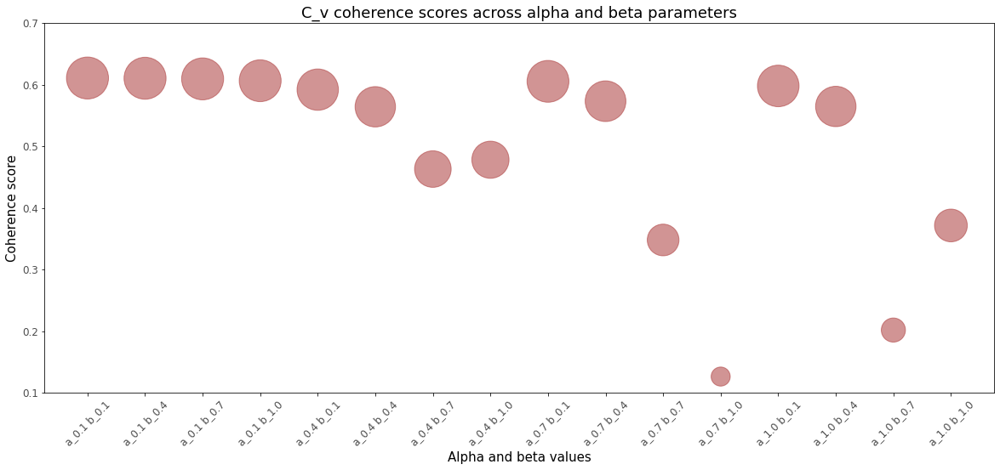

In [0]:
#Plotting C_v coherence scores
plt.figure(figsize=(20,8))
plt.scatter(df_tuning['a_b'],df_tuning['cv'],s=df_tuning['cv']*4000,alpha=0.5,c='brown')
plt.title('C_v coherence scores across alpha and beta parameters',size=18)
plt.xticks(rotation=45,size=12,alpha=0.7)
plt.yticks(size=12,alpha=0.7)
plt.xlabel('Alpha and beta values',size=15)
plt.ylabel('Coherence score',size=15)
plt.ylim(0.1,0.7)

Looking at the C_v scores above, we can see that the best score is **0.6107** corresponding to an **alpha value of 0.1** and **beta value of also 0.1**. Overall, the plot shows a general downward trend as beta is increased. The case is similar for alpha values but the changes are not as significant. 

Text(0.1, -8, 'Note: Smaller circles correspond to higher values (unlike C_v graph)')

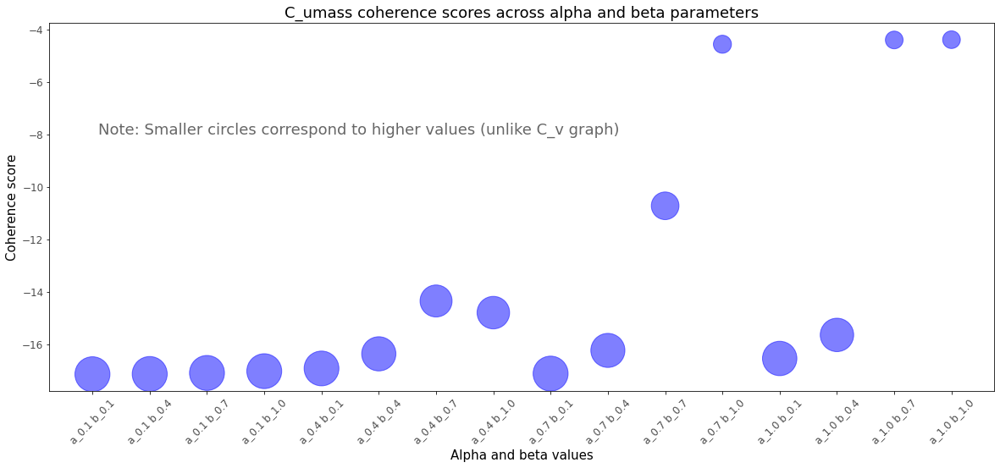

In [0]:
#Plotting C_umass coherence scores
plt.figure(figsize=(20,8))
plt.scatter(df_tuning['a_b'],df_tuning['umass'],s=df_tuning['umass'].apply(np.abs)*100,alpha=0.5,c='blue')
plt.title('C_umass coherence scores across alpha and beta parameters',size=18)
plt.xticks(rotation=45,size=12,alpha=0.7)
plt.yticks(size=12,alpha=0.7)
plt.xlabel('Alpha and beta values',size=15)
plt.ylabel('Coherence score',size=15)
plt.annotate("Note: Smaller circles correspond to higher values (unlike C_v graph)",xy=(0.1,-8),xytext=(0.1,-8),size=18,alpha=0.6,color='black')

For C_umass, the general trend for the alpha parameter is slightly ascending. However, the trend for beta is clearly upward trending with values such as 0.7 and 1.0 showing significantly higher values. 

As stated earlier in this section, C_umass scores closer to 0 indicate a higher cohesion between words and other topics. Our analysis has suggested that as the number of topics goes up, the C_umass score decreases. This means that as the number of topics increase, each word becomes more less semantically related with other topics. Since a lower score means lesser word correlation to other topics, it seems like the more desirable outcome. 

Provided these findings, a higher C_v score and lower C_umass score seems like the best combination. Therefore, we can pick a value of 0.1 for both alpha and beta parameters. 

### Why settle for a C_v score of 0.6107 with only 50 topics even though model with 60,100 and 150 topics yielded higher scores? 

Higher number of topics mean't lesser important words per topic. For these models, the interpretability of each topic was getting increasingly harder as there were very few words in each topic to form a general meaningful theme. 

# 6.2 Plotting model with optimized alpha and beta parameters - *alpha = 0.1, beta = 0.1*

In [0]:
dictionary = corpora.Dictionary(df['Title'])
dictionary.filter_extremes(no_below=10, no_above=0.5, keep_n=10000)
corpus = [dictionary.doc2bow(doc) for doc in df['Title']]
tfidf = models.TfidfModel(corpus)
corpus_tfidf = tfidf[corpus]
lda = gensim.models.ldamodel.LdaModel(corpus_tfidf,num_topics=40,id2word=dictionary,passes=10,alpha=0.1,eta=0.1,random_state=100)
lda.save('/content/drive/My Drive/lda_optimized_model_10_passes.gensim')

# Visualize the topics
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/final_model_50_passes.gensim')
pyLDAvis.enable_notebook()
LDAvis_prepared = pyLDAvis.gensim.prepare(lda, corpus, dictionary)
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
7     -0.006341 -0.036761       1        1  3.037875
3      0.051862 -0.365075       2        1  3.017710
0     -0.002710 -0.025775       3        1  2.977261
5     -0.000155 -0.018651       4        1  2.917520
29    -0.051553  0.001984       5        1  2.867195
27     0.006746 -0.003286       6        1  2.731428
9      0.006274 -0.004582       7        1  2.717156
25     0.009245  0.000959       8        1  2.678305
4      0.011276  0.005648       9        1  2.643504
21    -0.313721 -0.005012      10        1  2.636431
20     0.058844  0.135782      11        1  2.622749
39     0.008892  0.001359      12        1  2.607981
15     0.042041  0.049131      13        1  2.603619
30    -0.314617 -0.004571      14        1  2.596270
32     0.007965 -0.000739      15        1  2.589794
36     0.010580  0.003806      16        1  2.589597
38     0.011231  0.004662      17        1  2.572473
19     0.010856  0.005292      18        1  2.567897
17     0.008313  0.000927      19        1  2.551994
16     0.041948  0.048591      20        1  2.527769
1      0.011421  0.006293      21        1  2.493015
23     0.012692  0.008792      22        1  2.432118
31     0.013892  0.011183      23        1  2.418956
8      0.041421  0.047832      24        1  2.405525
10     0.013151  0.009806      25        1  2.405299
24     0.014396  0.011710      26        1  2.378878
37     0.014622  0.012101      27        1  2.378068
35     0.014496  0.012307      28        1  2.371975
14     0.014422  0.012115      29        1  2.363775
33     0.014087  0.011633      30        1  2.361935
18     0.014969  0.012744      31        1  2.347642
28     0.039411  0.045821      32        1  2.337739
2      0.050762  0.106037      33        1  2.235652
12     0.015504  0.013936      34        1  2.220540
6      0.043141 -0.202467      35        1  2.210120
13     0.016434  0.015729      36        1  2.192312
26     0.016828  0.016354      37        1  2.185688
11     0.017164  0.017101      38        1  2.145478
22     0.017905  0.017716      39        1  2.064686
34     0.006305  0.019568      40        1  1.996075, topic_info=     Category         Freq     Term        Total  loglift  logprob
95    Default  1891.000000     work  1891.000000  30.0000  30.0000
112   Default  1865.000000   jquery  1865.000000  29.0000  29.0000
7     Default  1831.000000    error  1831.000000  28.0000  28.0000
111   Default  1811.000000     data  1811.000000  27.0000  27.0000
223   Default  1743.000000    value  1743.000000  26.0000  26.0000
...       ...          ...      ...          ...      ...      ...
1365  Topic40    57.582386      lan    64.557144   3.7997  -4.7020
1809  Topic40    56.158615     bits    63.133350   3.7969  -4.7270
488   Topic40    56.009842  friends    62.984589   3.7966  -4.7297
1553  Topic40    55.870632   videos    62.845383   3.7963  -4.7322
311   Topic40    81.310867      mac   365.737549   2.4104  -4.3569

[1243 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
308      35  0.871620         -1
1074      5  0.905713  .htaccess
30        6  0.988622       .net
755      16  0.896079     \\frac
1863      5  0.918382   \\mathbb
...     ...       ...        ...
1107     32  0.939392    youtube
1707     10  0.882241          z
1283     34  0.961684       zend
2172      5  0.927695        zip
970      32  0.941220       zoom

[1214 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[8, 4, 1, 6, 30, 28, 10, 26, 5, 22, 21, 40, 16, 31, 33, 37, 39, 20, 18, 17, 2, 24, 32, 9, 11, 25, 38, 36, 15, 34, 19, 29, 3, 13, 7, 14, 27, 12, 23, 35])

From the above visualization, we can see that the topics are clustered together which would indicate that there is not much semantic separation between clusters. 

# 6.3 Plotting model with alpha->50/T and optimized beta - alpha = 1.25, beta = 0.1

Setting alpha to 50/(number of topics) is a common technique for LDA. Below we try this method. In our case, 50/40 is 1.25. 

In [0]:
dictionary = corpora.Dictionary(df['Title'])
dictionary.filter_extremes(no_below=10, no_above=0.5, keep_n=10000)
corpus = [dictionary.doc2bow(doc) for doc in df['Title']]
tfidf = models.TfidfModel(corpus)
corpus_tfidf = tfidf[corpus]
lda = gensim.models.ldamodel.LdaModel(corpus_tfidf,num_topics=40,id2word=dictionary,passes=10,alpha=1.25,eta=0.1,random_state=100)
lda.save('/content/drive/My Drive/lda_alpha_1p25_10_passes.gensim')

# Visualize the topics
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_alpha_1p25_10_passes.gensim')
pyLDAvis.enable_notebook()
LDAvis_prepared = pyLDAvis.gensim.prepare(lda, corpus, dictionary)
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
5     -0.109514  0.040109       1        1  2.559712
9     -0.051940  0.036456       2        1  2.541227
14    -0.087272  0.027246       3        1  2.533367
39     0.011488 -0.195173       4        1  2.530164
16    -0.055975 -0.016868       5        1  2.528325
26     0.171040  0.199640       6        1  2.525478
22    -0.045016  0.039049       7        1  2.517531
1     -0.042002  0.009839       8        1  2.516286
19    -0.047452  0.023332       9        1  2.514296
11    -0.017457  0.036299      10        1  2.510668
30     0.102894 -0.203406      11        1  2.507914
32     0.006556 -0.074939      12        1  2.506926
38     0.088157 -0.107621      13        1  2.506612
7      0.109778  0.086438      14        1  2.506557
35    -0.080693  0.020831      15        1  2.505856
24    -0.059447 -0.036592      16        1  2.503551
33     0.009109  0.108484      17        1  2.501273
3     -0.022598  0.038350      18        1  2.500289
27     0.162570  0.052725      19        1  2.498971
12    -0.022447  0.028370      20        1  2.496763
18     0.029091  0.043896      21        1  2.496544
36    -0.048794  0.004903      22        1  2.495007
31    -0.094608  0.031429      23        1  2.493850
29    -0.081264  0.030721      24        1  2.493203
6      0.029270 -0.171720      25        1  2.492541
4     -0.087099  0.049887      26        1  2.489709
8     -0.056823  0.021172      27        1  2.488052
20    -0.081252  0.022110      28        1  2.487710
37    -0.027574 -0.094236      29        1  2.486470
2      0.003383  0.023708      30        1  2.486166
13     0.241051  0.123733      31        1  2.485993
10     0.018450 -0.012975      32        1  2.485913
25     0.065332 -0.009056      33        1  2.485687
0     -0.079365  0.032003      34        1  2.484815
15    -0.060247  0.010787      35        1  2.484373
17    -0.013156  0.008860      36        1  2.473976
34     0.152063 -0.087147      37        1  2.472737
23     0.006095 -0.018136      38        1  2.469929
21     0.019328 -0.002625      39        1  2.469623
28     0.046340 -0.119882      40        1  2.465926, topic_info=     Category         Freq        Term        Total  loglift  logprob
7     Default  1829.000000       error  1829.000000  30.0000  30.0000
223   Default  1815.000000       value  1815.000000  29.0000  29.0000
169   Default  1511.000000       class  1511.000000  28.0000  28.0000
128   Default  1496.000000        page  1496.000000  27.0000  27.0000
23    Default  1485.000000  javascript  1485.000000  26.0000  26.0000
...       ...          ...         ...          ...      ...      ...
1674  Topic40    51.573795  submission    58.522644   3.5762  -5.0235
1070  Topic40    51.305676  manipulate    58.254345   3.5756  -5.0287
951   Topic40    50.684860   hyperlink    57.633522   3.5741  -5.0408
41    Topic40   152.368484         php  1665.184082   1.3112  -3.9402
93    Topic40    96.266609        java  1550.506714   0.9234  -4.3993

[1276 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
308       4  0.866181         -1
1074     10  0.910144  .htaccess
30       32  0.989240       .net
711      25  0.858496         \\
755      38  0.901880     \\frac
...     ...       ...        ...
1107     21  0.940221    youtube
1707     17  0.879734          z
1283      6  0.956029       zend
2172     38  0.933501        zip
970       8  0.937197       zoom

[1532 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 10, 15, 40, 17, 27, 23, 2, 20, 12, 31, 33, 39, 8, 36, 25, 34, 4, 28, 13, 19, 37, 32, 30, 7, 5, 9, 21, 38, 3, 14, 11, 26, 1, 16, 18, 35, 24, 22, 29])

The above rendition of the model gives us better separation between topics, hence this would be a more ideal model. Also, from the hyperparameter optimization section, we saw that as alpha increased from 0 to 1, the coherence score was still around the 0.6 range and did not deviate much. 

However, the PoCA plot above shows that as we increase the alpha score, the topics are more even spread out in 2-dimensional space. 

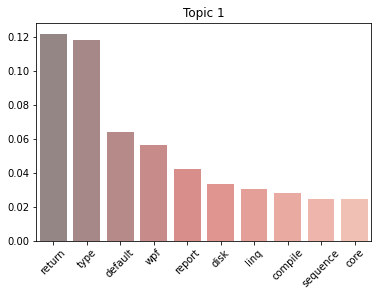

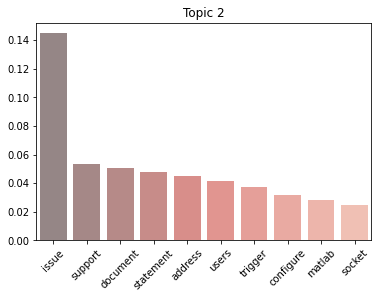

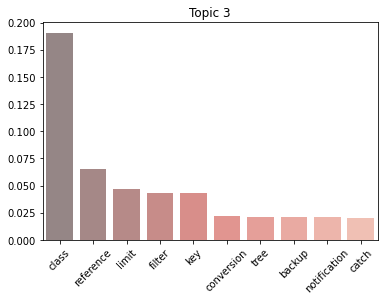

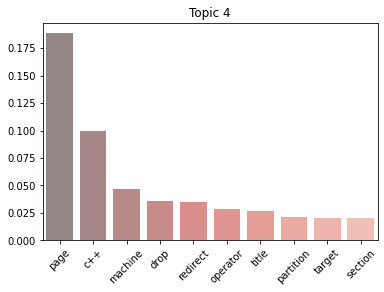

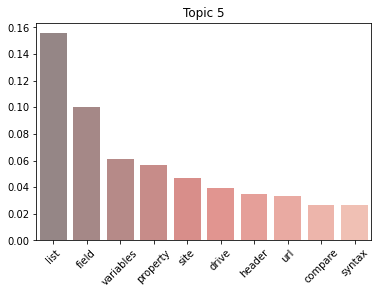

...

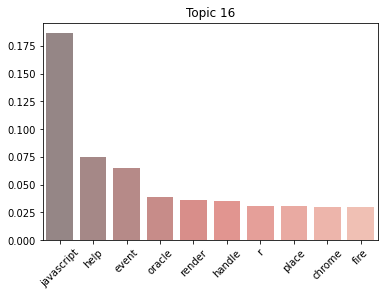

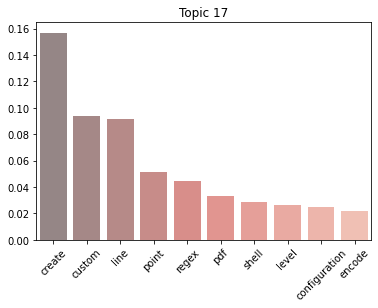

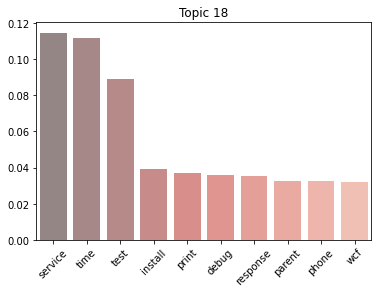

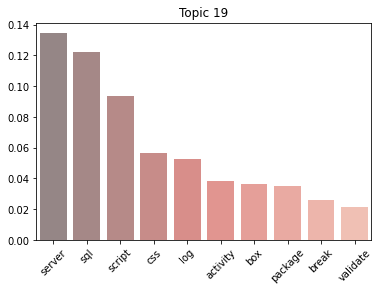

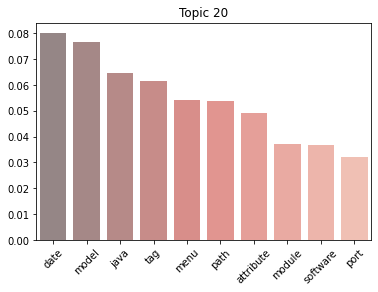

In [0]:
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/lda_alpha_1p25_10_passes.gensim')

for i in range(len(lda.print_topics())):
  plt.figure()
  unzip = list(zip(*lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary,topn=10)[-i-1][0]))
  sns.barplot(x=list(unzip[1]),y=list(unzip[0]),palette='Reds_d',alpha=0.6)
  plt.title('Topic '+str(i+1))
  plt.xticks(rotation=45)

# 6.3 Optimizing number of passes

In [0]:
dictionary = corpora.Dictionary(df['Title'])
dictionary.filter_extremes(no_below=10, no_above=0.5, keep_n=10000)
corpus = [dictionary.doc2bow(doc) for doc in df['Title']]
tfidf = models.TfidfModel(corpus)
corpus_tfidf = tfidf[corpus]
lda = gensim.models.ldamodel.LdaModel(corpus_tfidf,num_topics=40,id2word=dictionary,passes=50,alpha=1.25,eta=0.1,random_state=100)

lda.save('/content/drive/My Drive/final_model_50_passes_retake.gensim')

In [0]:
# Visualize the topics
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/final_model_50_passes_retake.gensim')
pyLDAvis.enable_notebook()
LDAvis_prepared = pyLDAvis.gensim.prepare(lda, corpus, dictionary)
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
5     -0.447753  0.057428       1        1  2.571817
9     -0.006765 -0.009516       2        1  2.549812
26    -0.025114 -0.070545       3        1  2.542983
16    -0.035403 -0.438989       4        1  2.538339
14     0.008823  0.012137       5        1  2.533337
39     0.007747  0.009655       6        1  2.522684
6     -0.002185 -0.002328       7        1  2.518717
22     0.006363  0.007469       8        1  2.518534
1     -0.004675 -0.005843       9        1  2.517510
38     0.022427  0.022833      10        1  2.517381
19     0.009550  0.010562      11        1  2.513754
30     0.000386  0.001408      12        1  2.513361
12     0.012601  0.012466      13        1  2.507914
35     0.009894  0.010316      14        1  2.505327
32     0.004440  0.005155      15        1  2.504398
33     0.015732  0.015227      16        1  2.502532
24     0.015057  0.013881      17        1  2.502153
11     0.010646  0.010690      18        1  2.501418
7      0.014152  0.013379      19        1  2.500790
3      0.005428  0.006110      20        1  2.499558
13     0.011533  0.010916      21        1  2.497742
27     0.016142  0.015074      22        1  2.497685
36     0.015428  0.013957      23        1  2.493142
29     0.008412  0.008949      24        1  2.492855
18     0.016545  0.014529      25        1  2.491452
31     0.012930  0.012311      26        1  2.491174
20     0.010093  0.010237      27        1  2.487483
8      0.015954  0.014538      28        1  2.487269
0      0.021667  0.019020      29        1  2.484377
4      0.015797  0.014189      30        1  2.484035
2      0.019941  0.016618      31        1  2.484002
37     0.020768  0.017374      32        1  2.482721
15     0.020900  0.017205      33        1  2.482044
25     0.022024  0.017737      34        1  2.480071
10     0.023789  0.018860      35        1  2.475189
17     0.023737  0.018870      36        1  2.470388
21     0.023027  0.018450      37        1  2.467179
23     0.024031  0.018580      38        1  2.461498
28     0.025979  0.019697      39        1  2.457646
34     0.029951  0.021394      40        1  2.449730, topic_info=     Category         Freq       Term        Total  loglift  logprob
7     Default  1850.000000      error  1850.000000  30.0000  30.0000
223   Default  1795.000000      value  1795.000000  29.0000  29.0000
95    Default  1777.000000       work  1777.000000  28.0000  28.0000
112   Default  1750.000000     jquery  1750.000000  27.0000  27.0000
111   Default  1576.000000       data  1576.000000  26.0000  26.0000
...       ...          ...        ...          ...      ...      ...
1910  Topic40    71.815918      icons    78.766121   3.6168  -4.6858
872   Topic40    67.698280   automate    74.648666   3.6115  -4.7448
2254  Topic40    67.262512  precision    74.213127   3.6109  -4.7513
1212  Topic40    63.148293        cut    70.098610   3.6048  -4.8144
956   Topic40    60.290787   registry    67.240982   3.6001  -4.8607

[1230 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
308       6  0.862649         -1
1074     18  0.916973  .htaccess
30       35  0.989494       .net
711       7  0.871071         \\
755      38  0.913489     \\frac
...     ...       ...        ...
1107     25  0.943209    youtube
1707     16  0.891813          z
1283      3  0.956364       zend
2172     38  0.940681        zip
970       9  0.932585       zoom

[1200 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 10, 27, 17, 15, 40, 7, 23, 2, 39, 20, 31, 13, 36, 33, 34, 25, 12, 8, 4, 14, 28, 37, 30, 19, 32, 21, 9, 1, 5, 3, 38, 16, 26, 11, 18, 22, 24, 29, 35])

From the visualization above, we can straight away see that a lot of the topics are now clustered together in the top-right quadrant. Our initial impression with the 10 passes model was that the topics would have been spaced out evenly across the two-dimensional plane. 

Despite the topics being separated in the PoCA plane, the model is actually better tuned if we examine the topic distributions on the right. For example, if we look at **topic #3** for this model, you can see that all the word distributions within the topic are close to the overall word distribution in the dataset. This indicates that this **topic is completely unique**. 

In slight contrast, the corresponding topic (#6) for the model with 10 passes shows that distributions for words like *jquery and array *are significantly less than their overall distributions. Therefore, these words are not completely unique to this topic. 

Hence, the 100 passes model's topic #3 gets rid of the *array* term completely while making the *jquery* term the most important word in the topic. 

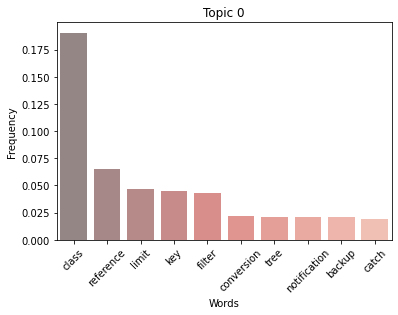

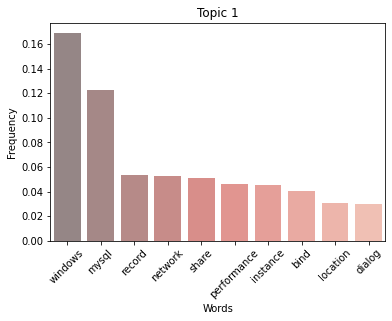

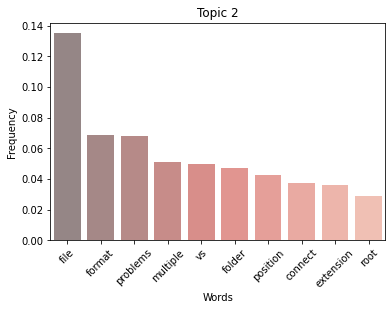

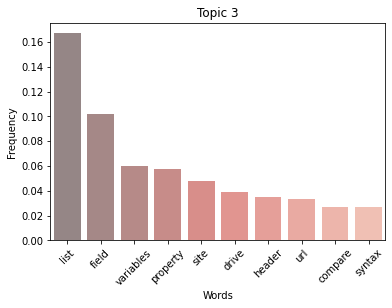

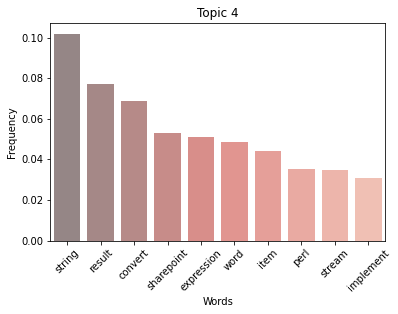

...

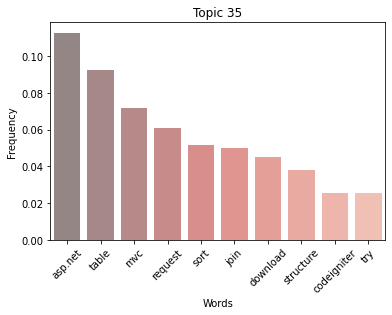

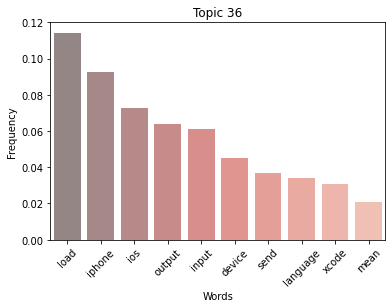

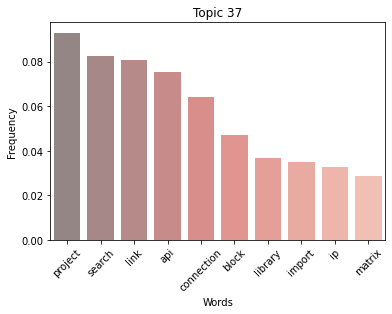

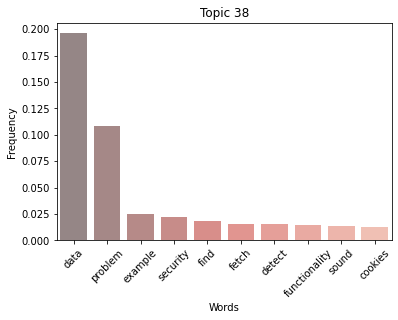

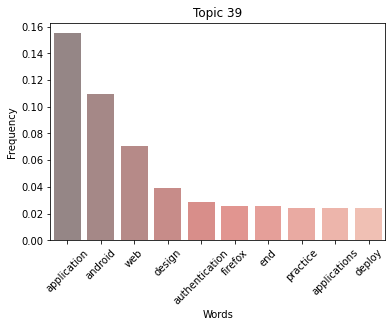

In [79]:
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/final_model_50_passes_retake.gensim')

'''
for i in range(len(lda.print_topics())):
  plt.figure()
  unzip = list(zip(*lda.top_topics(corpus=corpus,texts=df['Title'],dictionary=dictionary,topn=10)[-i-1][0]))
  sns.barplot(x=list(unzip[1]),y=list(unzip[0]),palette='Reds_d',alpha=0.6)
  plt.title('Topic '+str(i+1))
  plt.xticks(rotation=45)
'''
for i in range(40):
  plt.figure()
  unzip = list(zip(*lda.show_topic(i)))
  sns.barplot(x=list(unzip[0]),y=list(unzip[1]),palette='Reds_d',alpha=0.6)
  plt.title('Topic '+str(i))
  plt.xticks(rotation=45)
  plt.xlabel('Words')
  plt.ylabel('Frequency')

# 7. Generating topics

In this section we will load in our final model which was generated using 50 passes and see what the topics look like. 

In [0]:
terms = {5:['functions','scripting'],
9:['database servers','web layout developement'],
26:['web developement','web frameworks','web servers'],
16: ['database development'],
14: ['search engine','search applications'],
6: ['apps','web design'],
39: ['software developement'],
22: ['data format, login shells','visuals'],
1: ['pc','databases','servers'],
38: ['data','information','security'],
19: ['create','custom','coding','scripting'],
30: ['emails','comments'],
12: ['web frameworks'],
35: ['web frameworks','databases'],
32: ['error','store','loop','directory'],
33: ['databases','dataframes','tables'],
24: ['debugging','testing','time','service'],
11: ['servers','authentication'],
7: ['access','display','session'],
3: ['data structures','website','syntax'],
13: ['web layout','web design','internet'],
27: ['code','remote','source code'],
36: ['iphone','apple','ios','apps'],
29: ['c','object oriented programming'],
18: ['html','web developement','web page','internet'],
31: ['javascript','oracle','event'],
20: ['query','databases'],
8: ['apps','django','web framework'],
0: ['object oriented programming','scripting'],
4: ['string','data type','text','scripting'],
2: ['fies','directory','path','address'],
37: ['api','website','url','authentication'],
15: ['functions','general programming','memory','space'],
25: ['page','c++'],
10: ['blogs','posts','wordpress','domain'],
17: ['base','elements','difference','parse'],
21: ['support','issues','documentation'],
23: ['virtual environment','remote','linux','git','frameworks'],
28: ['programming','web servers'],
34: ['cloud platforms','programming','scripting','databases']}

# 8. Final model evaluation and topic modeling

# 8.1 Predict document topics

Below is a function which provides a word distributions across each topic. 

In [0]:
def create_topics_dist(model):
  df_topics = pd.DataFrame()
  topics = []
  dist = []
  for i in model.print_topics(): 
      topics.append(i[0])
      dist.append(i[1])
  df_topics['topic'] = topics
  df_topics['dist'] = dist
  return df_topics

lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/final_model_50_passes_retake.gensim')
create_topics_dist(lda)

,topic,dist
0,16,"0.190*""php"" + 0.119*""database"" + 0.091*""show"" + 0.064*""size"" + 0.055*""message"" + 0.036*""count"" + 0.030*""graph"" + 0.028*""computer"" + 0.019*""split"" ..."
1,39,"0.155*""application"" + 0.110*""android"" + 0.071*""web"" + 0.039*""design"" + 0.029*""authentication"" + 0.026*""firefox"" + 0.026*""end"" + 0.024*""practice"" +..."
2,7,"0.140*""access"" + 0.104*""display"" + 0.060*""div"" + 0.050*""action"" + 0.049*""session"" + 0.039*""listview"" + 0.035*""hide"" + 0.022*""ipad"" + 0.022*""cakeph..."
3,24,"0.121*""time"" + 0.115*""service"" + 0.089*""test"" + 0.039*""print"" + 0.039*""install"" + 0.036*""debug"" + 0.035*""response"" + 0.033*""phone"" + 0.033*""parent..."
4,1,"0.169*""windows"" + 0.123*""mysql"" + 0.053*""record"" + 0.053*""network"" + 0.051*""share"" + 0.046*""performance"" + 0.045*""instance"" + 0.040*""bind"" + 0.031..."
5,37,"0.093*""project"" + 0.083*""search"" + 0.081*""link"" + 0.076*""api"" + 0.064*""connection"" + 0.047*""block"" + 0.037*""library"" + 0.035*""import"" + 0.033*""ip""..."
6,10,"0.091*""content"" + 0.089*""post"" + 0.083*"".net"" + 0.067*""character"" + 0.056*""wordpress"" + 0.048*""domain"" + 0.044*""id"" + 0.043*""errors"" + 0.033*""inse..."
7,32,"0.232*""error"" + 0.075*""store"" + 0.064*""loop"" + 0.064*""directory"" + 0.046*""mac"" + 0.045*""match"" + 0.026*""child"" + 0.025*""iis"" + 0.024*""manage"" + 0...."
8,9,"0.173*""server"" + 0.118*""sql"" + 0.090*""script"" + 0.055*""css"" + 0.051*""log"" + 0.037*""activity"" + 0.035*""box"" + 0.034*""package"" + 0.025*""break"" + 0.0..."
9,6,"0.182*""java"" + 0.073*""date"" + 0.068*""model"" + 0.056*""tag"" + 0.047*""path"" + 0.047*""menu"" + 0.045*""attribute"" + 0.033*""module"" + 0.033*""software"" + ..."


In [69]:
lda.show_topic(1)

[('windows', 0.16886556),
 ('mysql', 0.12297454),
 ('record', 0.053089477),
 ('network', 0.052778095),
 ('share', 0.050900728),
 ('performance', 0.046148494),
 ('instance', 0.045120437),
 ('bind', 0.040391516),
 ('location', 0.030727308),
 ('dialog', 0.029671129)]

Below are two functions which together provide topic distributions across a single document when a LDA model is supplied as an input. They also provide the word distributions for each topic as well as the manually assigned keywords for each topic for comparison. 

In [0]:
def doc_to_topic(doc,model,terms):
  model_topic_dist = model[doc]
  df_topics = pd.DataFrame()
  topics = []
  word_dist = []
  topic_dist = []
  topic_terms = []
  for i in model_topic_dist: 
    try:
      topics.append(i[0])
      word_dist.append(model.print_topic(i[0]))
      topic_dist.append(i[1])
      topic_terms.append(terms[i[0]])
    except:
      print ('Error')
      break
  df_topics['topic_id'] = topics
  df_topics['topic_dist'] = topic_dist
  df_topics['word_dist'] = word_dist
  df_topics['topic_keywords'] = topic_terms
  df_topics = df_topics.sort_values('topic_dist',ascending=False)
  return df_topics

In [0]:
def predict_docs(index_num,terms):
  pd.set_option('display.max_colwidth', 100)
  pd.set_option('display.max_columns', 4)
  df = pd.read_csv('/content/drive/My Drive/cleaned_preprocessed_dataset_with_only_nouns_and_title.csv',index_col=0)
  topic_dist = doc_to_topic(corpus[index_num],lda,terms)
  print ("Prediction for :", list(df.iloc[index_num]))
  print ()
  print (topic_dist.head(6))

### Example

In [0]:
predict_docs(4352,terms)

Prediction for : ['factory method signature root']

    topic_id  topic_dist                                                                                            word_dist                                        topic_keywords
27        27    0.041667  0.151*"code" + 0.056*"client" + 0.054*"source" + 0.046*"screen" + 0.040*"scroll" + 0.038*"events...                           [code, remote, source code]
38        38    0.041666  0.196*"data" + 0.108*"problem" + 0.025*"example" + 0.022*"security" + 0.018*"find" + 0.016*"fetc...                         [data, information, security]
8          8    0.041666  0.121*"app" + 0.065*"django" + 0.056*"x" + 0.052*"start" + 0.049*"nan" + 0.045*"crash" + 0.042*"...                         [apps, django, web framework]
1          1    0.041663  0.169*"windows" + 0.123*"mysql" + 0.053*"record" + 0.053*"network" + 0.051*"share" + 0.046*"perf...                              [pc, databases, servers]
34        34    0.023148  0.076*"space" + 0.071*

This next function below is the primary function we will use to predict topics for our documents. It takes in the LDA model, a set of documents, keywords and provides a table where each row consists of:
- A document
- Top topic for that document
- Probability for the top topic
- Keywords from the top 4 topics

In [0]:
def list_doc_topics(model,docs,terms):
  x = pd.DataFrame()
  x['documents'] = docs
  doc_models = []
  top_topic = []
  top_topic_dist = []
  keywords = []
  
  for i in range(len(docs)):
    doc_models.append(model[corpus[i]])
    df_topics = pd.DataFrame()
    topics = []
    word_dist = []
    topic_dist = []
    topic_terms = []
    for i in model[corpus[i]]: 
      try:
        topics.append(i[0])
        topic_dist.append(i[1])
        topic_terms.append(terms[i[0]])
      except:
        print ('Error')
        break
    df_topics['topic_id'] = topics
    df_topics['topic_dist'] = topic_dist
    df_topics['topic_keywords'] = topic_terms
    df_topics = df_topics.sort_values('topic_dist',ascending=False)
    top_topic.append(df_topics['topic_id'].iloc[0])
    top_topic_dist.append(df_topics['topic_dist'].iloc[0])

    topics_concat = []
    for i in df_topics['topic_keywords'][:3]:
      topics_concat = topics_concat + i
    keywords.append(topics_concat)
  x['top_topic'] = top_topic
  x['topic_dist'] = top_topic_dist
  x['keywords'] = keywords
  return (x)

#lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/final_model_50_passes_retake.gensim')
#list_doc_topics(lda,df['Title'][5000:6000],terms)

In [0]:
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/final_model_50_passes_retake.gensim')
doc_predictions = pd.DataFrame()
index_range = list(range(0,101000,1000))
for i in range(len(index_range)):
  try:
    prediction = list_doc_topics(lda,df['Title'][index_range[i]:index_range[i+1]],terms)
    doc_predictions = doc_predictions.append(prediction)
  except:
    break

In [0]:
doc_predictions.head(10)

,documents,top_topic,topic_dist,keywords
0,"[check, image, mime, type]",15,0.041667,"[functions, general programming, memory, space, web frameworks, c, object oriented programming]"
1,"[prevent, firefox, press, ctrl-w]",32,0.041667,"[error, store, loop, directory, web layout, web design, internet, software developement]"
2,"[r, error, type, list]",3,0.041667,"[data structures, website, syntax, functions, general programming, memory, space, blogs, posts, wordpress, domain]"
3,"[character, url]",3,0.043269,"[data structures, website, syntax, web frameworks, databases, functions, general programming, memory, space]"
4,"[contact, detail]",32,0.043269,"[error, store, loop, directory, functions, scripting, cloud platforms, programming, scripting, databases]"
5,"[directory, environment]",20,0.043269,"[query, databases, html, web developement, web page, internet, api, website, url, authentication]"
6,"[draw, barplot, way, coreplot]",11,0.041667,"[servers, authentication, web frameworks, databases, data, information, security]"
7,"[fetch, xml, fee, asp.net]",31,0.041667,"[javascript, oracle, event, functions, scripting, data format, login shells, visuals]"
8,"[generate, javascript]",3,0.043269,"[data structures, website, syntax, page, c++, cloud platforms, programming, scripting, databases]"
9,"[sql, server, procedure, call, inline, concatenation]",9,0.058036,"[database servers, web layout developement, blogs, posts, wordpress, domain, apps, django, web framework]"


Shown above is a snippet of the topics predicted for the documents in the dataset. The documents were predicted in chunks of 1000 documents in order to prevent any errors during execution. The prediction results are then stored in the mounted drive so that it's always available for analysis. 

In [0]:
doc_predictions.to_csv('/content/drive/My Drive/document_predictions_100000.csv')

# 8.2 Analyze prediction results

In [15]:
df = pd.read_csv('/content/drive/My Drive/document_predictions_100000.csv')
df.shape

(100000, 5)

# 8.2.1 Topic frequencies in predicted results

In [16]:
topics_freq = pd.DataFrame()
topics_freq['topic'] = df['top_topic'].value_counts().index
topics_freq['freq'] = df['top_topic'].value_counts().values
topics_freq['topic_words'] = list(map(terms.get,topics_freq['topic']))
topics_freq['percent'] = topics_freq['freq']/sum(topics_freq['freq'])
topics_freq = topics_freq.sort_values('freq',ascending=False)
topics_freq.head(10)

,topic,freq,topic_words,percent
0,24,4708,"[debugging, testing, time, service]",0.04708
1,2,4412,"[fies, directory, path, address]",0.04412
2,3,4326,"[data structures, website, syntax]",0.04326
3,15,3747,"[functions, general programming, memory, space]",0.03747
4,29,3556,"[c, object oriented programming]",0.03556
5,5,3168,"[functions, scripting]",0.03168
6,12,3133,[web frameworks],0.03133
7,20,3090,"[query, databases]",0.03090
8,33,2950,"[databases, dataframes, tables]",0.02950
9,31,2900,"[javascript, oracle, event]",0.02900


From the table above, we can see that **topic 24** containing the keywords **debugging, testing, time, service** is the most frequent topic in the model with 4708 documents being tagged with this as the most relevant topic. The other high frequency topics are 2, 3, 15 and 29 with respective frequencies of 4412, 4326, 3747, 3556. 

It is evident that a lot of these top keywords are programming and syntax related which makes sense as Stack Exchange is possibly the best platform for help with coding. One way this information can be leveraged is to quickly bring up similar questions which share similar topics. 

In [17]:
topics_freq.tail(10)

,topic,freq,topic_words,percent
30,36,1900,"[iphone, apple, ios, apps]",0.01900
31,26,1809,"[web developement, web frameworks, web servers]",0.01809
32,18,1800,"[html, web developement, web page, internet]",0.01800
33,39,1700,[software developement],0.01700
34,32,1674,"[error, store, loop, directory]",0.01674
35,4,1600,"[string, data type, text, scripting]",0.01600
36,19,1599,"[create, custom, coding, scripting]",0.01599
37,16,1300,[database development],0.01300
38,23,1089,"[virtual environment, remote, linux, git, frameworks]",0.01089
39,14,800,"[search engine, search applications]",0.00800


The table above shows that the least occurring topic was **topic 14** with a frequency of **800**. This topic contains keywords such as **search engine** and **search applications**. Other low frequency topics contained keywords such as **database developement, virtual environment, remote, linux, git**. 

From this information, we can gauge that these topics are not the most queried on Stack Exchange. Since these words are less queried, these specific questions should be promoted during a search to make them more visible and build up answers for these questions. For frequently occurring topics, it is likely that there are a lot of answers out there. Stack Exchange has a column on the side which lists the most active questions. A similar display can be used for these low occurring topics which would improve visibility. 

Text(0, 0.5, 'Frequency')

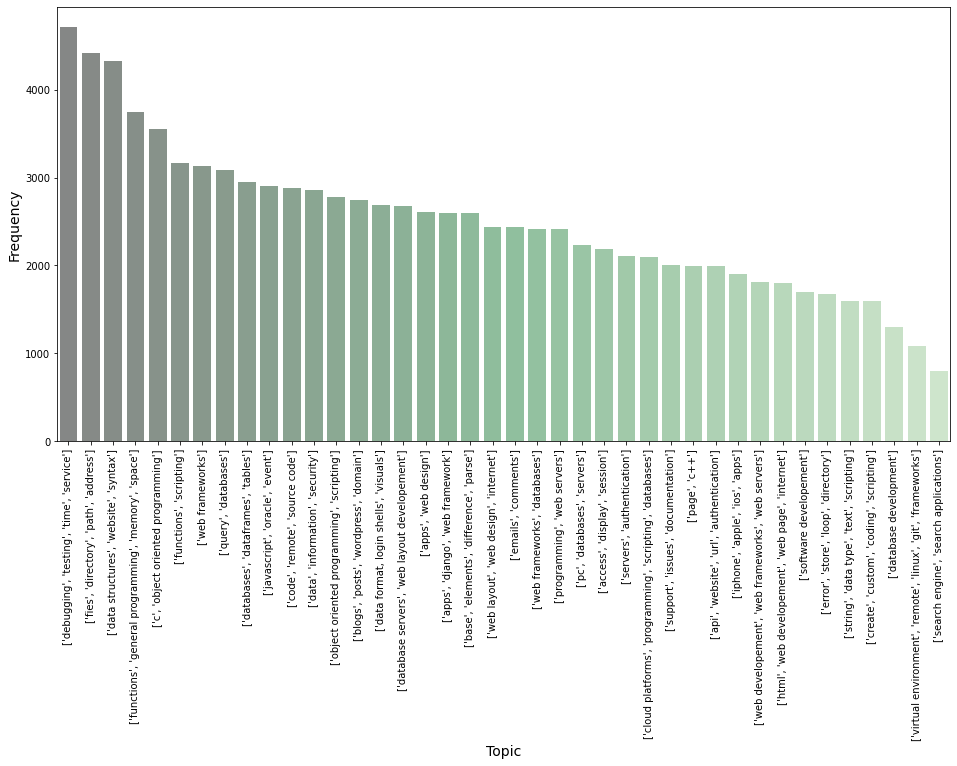

In [18]:
plt.figure(figsize=(16,8))
sns.barplot(x=topics_freq['topic_words'].map(str),y=topics_freq['freq'],alpha=0.6,palette='Greens_d')
plt.xticks(size=10,rotation=90)
plt.yticks(size=10)
plt.xlabel('Topic',size=14)
plt.ylabel('Frequency',size=14)

The plot above shows the distribution of topics for the prediction results. In other words, it's the number of documents each topic appears in. However, a more insightful visualization is shown below where the distributions for the top keywords are displayed. 

# 8.2.2 Keyword frequencies in predicted results

In [80]:
df = pd.read_csv('/content/drive/My Drive/document_predictions_100000.csv')
df['keywords'] = df['keywords'].apply(lambda x: x.strip('[').strip(']').split(', '))

all_keywords = []
for i in df['keywords']:
  all_keywords.extend(i)

all_keywords = pd.Series(all_keywords)
top_keywords = pd.DataFrame()
top_keywords['word'] = all_keywords.value_counts().index
top_keywords['word'] = top_keywords['word'].apply(lambda x: x.strip("'"))
top_keywords['freq'] = all_keywords.value_counts().values
top_keywords = top_keywords.sort_values('freq',ascending=False)
top_keywords_training = top_keywords
top_keywords_training

,word,freq
0,scripting,48700
1,databases,44486
2,programming,25681
3,web frameworks,20500
4,apps,19969
...,...,...
87,database development,4900
88,html,4600
89,web page,4600
90,search applications,3500


Text(0, 0.5, 'Frequency')

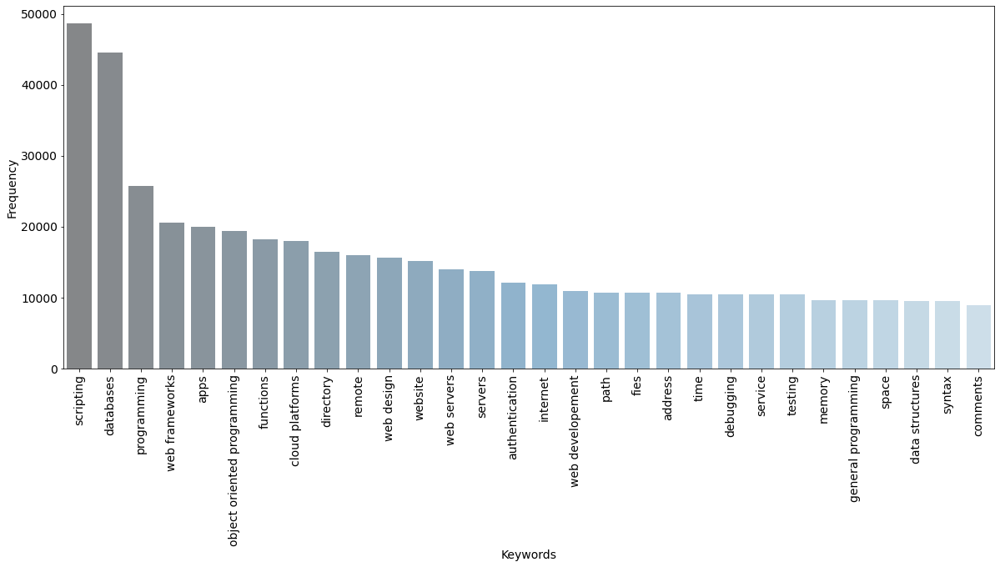

In [0]:
plt.figure(figsize=(20,8))
sns.barplot(x='word',y='freq',data=top_keywords[:30],alpha=0.6,palette='Blues_d')
plt.xticks(rotation=90,size=14)
plt.yticks(size=14)
plt.xlabel('Keywords',size=14)
plt.ylabel('Frequency',size=14)

The plot above shows the highest occurring keywords in the predicted results. Terms such as **scripting** (48,700) and **databases** (44,486) were distinctly more prevalent than the others whereas words such as **programming, web frameworks, apps, object oriented programming and functions** were the next highest occurring with frequencies of 25,681, 20,500, 19,969, 19,414 and 18,244 respectively. 

Text(0, 0.5, 'Frequency')

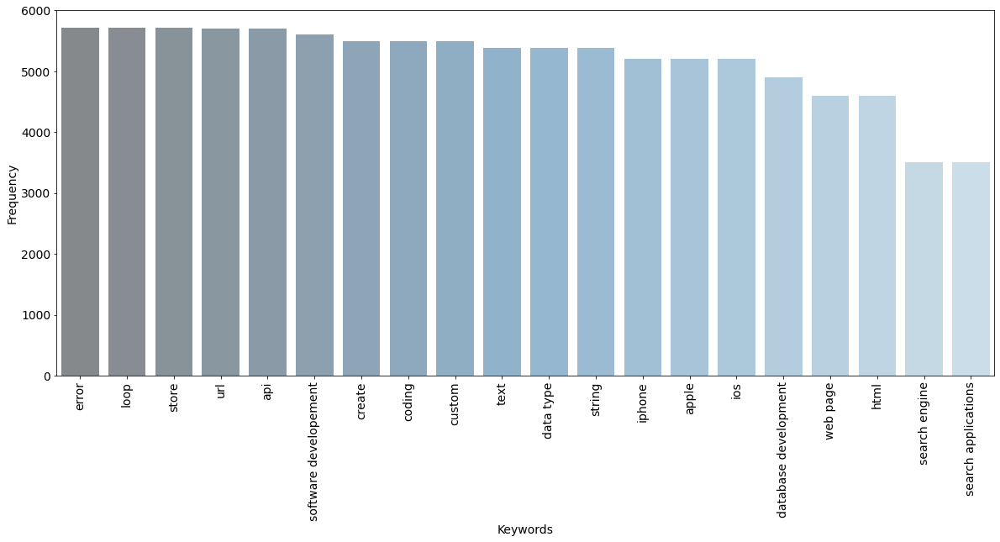

In [0]:
plt.figure(figsize=(20,8))
sns.barplot(x='word',y='freq',data=top_keywords[-20:],alpha=0.6,palette='Blues_d')
plt.xticks(rotation=90,size=14)
plt.yticks(size=14)
plt.xlabel('Keywords',size=14)
plt.ylabel('Frequency',size=14)

The plot above shows the lowest occurring terms in the predicted results. Some of these words are string, text, ios, iphone, apple, database developement, html, web page, search applications and search engine. Overall these keywords are mainly related to **text, iphone, html and search engines**. Hence, we can safely say that these are some of the least queried topics on Stack Exchange. 

Some of these actually make sense. For example: 
- People generally don't go to Stack Exchange for debug or troubleshooting questions with regards to the iphone. Other places like CNET or Gear Patrol might be more useful since it's a consumer product. 
- Questions regarding text or string data are not as prevalent as things like syntax, numbers or data structures. 
- While HTML is the foundation of web page deveopement, there are other languages such as JavaScript, CSS, PHP etc. that have become more popular over time. Also, there are frameworks out there to make this process easier. 
- Finally, not a lot of people would need help with search engines unless you are trying to create or simulate one on your own. Even then, creating a search engine is a very niche technical area. 

# 8.3 Find document distribution per topic

In [47]:
df = pd.read_csv('/content/drive/My Drive/document_predictions_100000.csv',index_col=0)
df.head()

,documents,top_topic,topic_dist,keywords
0,"['check', 'image', 'mime', 'type']",15,0.041667,"['functions', 'general programming', 'memory', 'space', 'web frameworks', 'c', 'object oriented programming']"
1,"['prevent', 'firefox', 'press', 'ctrl-w']",32,0.041667,"['error', 'store', 'loop', 'directory', 'web layout', 'web design', 'internet', 'software developement']"
2,"['r', 'error', 'type', 'list']",3,0.041667,"['data structures', 'website', 'syntax', 'functions', 'general programming', 'memory', 'space', 'blogs', 'posts', 'wordpress', 'domain']"
3,"['character', 'url']",3,0.043269,"['data structures', 'website', 'syntax', 'web frameworks', 'databases', 'functions', 'general programming', 'memory', 'space']"
4,"['contact', 'detail']",32,0.043269,"['error', 'store', 'loop', 'directory', 'functions', 'scripting', 'cloud platforms', 'programming', 'scripting', 'databases']"


In [48]:
# Group top 5 sentences under each topic
df_top_doc = pd.DataFrame()
sent_topics_outdf_grpd = df.groupby('top_topic')
for i, grp in sent_topics_outdf_grpd:
    df_top_doc = pd.concat([df_top_doc, 
                                             grp.sort_values(['topic_dist'], ascending=[0]).head(1)], 
                                            axis=0)
# Reset Index    
df_top_doc.reset_index(drop=True, inplace=True)

# Format
#sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Text"]

# Show
df_top_doc.head(10)

,documents,top_topic,topic_dist,keywords
0,"['news', 'module', 'database', 'kohana']",0,0.075893,"['object oriented programming', 'scripting', 'base', 'elements', 'difference', 'parse', 'page', 'c++']"
1,"['time', 'step', 'probabilities', 'distance', 'wall']",1,0.062500,"['pc', 'databases', 'servers', 'object oriented programming', 'scripting', 'data format, login shells', 'visuals']"
2,"['css3', 'multi', 'column', 'position', 'work']",2,0.061321,"['fies', 'directory', 'path', 'address', 'html', 'web developement', 'web page', 'internet', 'object oriented programming', 'scripting']"
3,"['c', 'whitespace', 'macro', 'name']",3,0.060185,"['data structures', 'website', 'syntax', 'query', 'databases', 'emails', 'comments']"
4,"['split', 'row']",4,0.060184,"['string', 'data type', 'text', 'scripting', 'data', 'information', 'security', 'web frameworks']"
5,"['configure', 'yii', 'framework', 'https']",5,0.059091,"['functions', 'scripting', 'apps', 'web design', 'functions', 'general programming', 'memory', 'space']"
6,"['consequences', 'initialisation', 'pointers']",6,0.061321,"['apps', 'web design', 'pc', 'databases', 'servers', 'query', 'databases']"
7,"['css', 'format', 'a4', 'print']",7,0.080188,"['access', 'display', 'session', 'support', 'issues', 'documentation', 'programming', 'web servers']"
8,"['help', 'hash', 'sha1', 'string']",8,0.061320,"['apps', 'django', 'web framework', 'data format, login shells', 'visuals', 'virtual environment', 'remote', 'linux', 'git', 'frameworks']"
9,"['number', 'desire', 'coordinate', 'matlab']",9,0.061320,"['database servers', 'web layout developement', 'code', 'remote', 'source code', 'cloud platforms', 'programming', 'scripting', 'databases']"


In [49]:
# Number of Documents for Each Topic
topic_counts = df['top_topic'].value_counts()

# Percentage of Documents for Each Topic
topic_contribution = round(topic_counts/topic_counts.sum(), 4)

# Topic Number and Keywords
topic_num_keywords = df_top_doc[['top_topic', 'keywords']]

# Concatenate Column wise
df_dominant_topics = pd.concat([topic_num_keywords, topic_counts, topic_contribution], axis=1)

# Change Column names
df_dominant_topics.columns = ['Dominant_Topic', 'Topic_Keywords', 'Num_Documents', 'Perc_Documents']

# Show
df_dominant_topics.head(10)

,Dominant_Topic,Topic_Keywords,Num_Documents,Perc_Documents
0,0,"['object oriented programming', 'scripting', 'base', 'elements', 'difference', 'parse', 'page', 'c++']",2778,0.0278
1,1,"['pc', 'databases', 'servers', 'object oriented programming', 'scripting', 'data format, login shells', 'visuals']",2236,0.0224
2,2,"['fies', 'directory', 'path', 'address', 'html', 'web developement', 'web page', 'internet', 'object oriented programming', 'scripting']",4412,0.0441
3,3,"['data structures', 'website', 'syntax', 'query', 'databases', 'emails', 'comments']",4326,0.0433
4,4,"['string', 'data type', 'text', 'scripting', 'data', 'information', 'security', 'web frameworks']",1600,0.0160
5,5,"['functions', 'scripting', 'apps', 'web design', 'functions', 'general programming', 'memory', 'space']",3168,0.0317
6,6,"['apps', 'web design', 'pc', 'databases', 'servers', 'query', 'databases']",2606,0.0261
7,7,"['access', 'display', 'session', 'support', 'issues', 'documentation', 'programming', 'web servers']",2183,0.0218
8,8,"['apps', 'django', 'web framework', 'data format, login shells', 'visuals', 'virtual environment', 'remote', 'linux', 'git', 'frameworks']",2600,0.0260
9,9,"['database servers', 'web layout developement', 'code', 'remote', 'source code', 'cloud platforms', 'programming', 'scripting', 'databases']",2673,0.0267


Text(0, 0.5, 'Frequency')

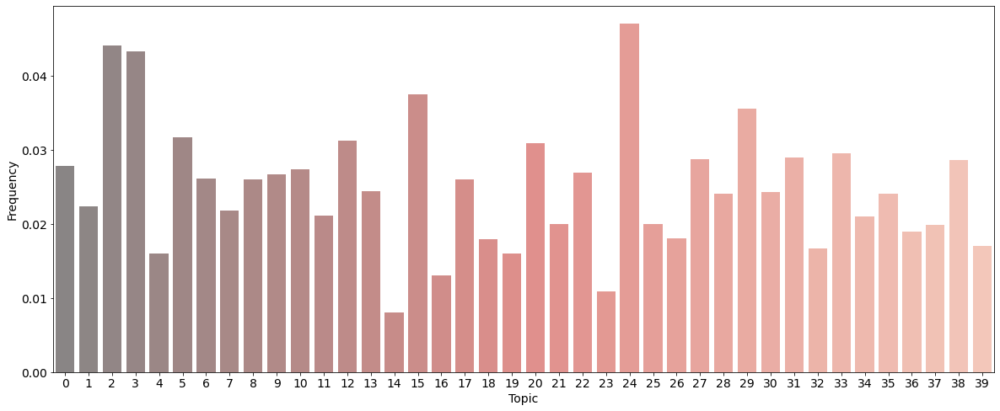

In [23]:
plt.figure(figsize=(20,8))
sns.barplot(x=df_dominant_topics['Dominant_Topic'],y=df_dominant_topics['Perc_Documents'],alpha=0.6,palette='Reds_d')
plt.xticks(size=14)
plt.yticks(size=14)
plt.xlabel('Topic',size=14)
plt.ylabel('Frequency',size=14)

In [52]:
df_dominant_topics_train = df_dominant_topics.sort_values('Dominant_Topic').head(10)
df_dominant_topics_train = df_dominant_topics_train.reset_index(drop=True)
df_dominant_topics_train.head()

,Dominant_Topic,Topic_Keywords,Num_Documents,Perc_Documents
0,0,"['object oriented programming', 'scripting', 'base', 'elements', 'difference', 'parse', 'page', 'c++']",2778,0.0278
1,1,"['pc', 'databases', 'servers', 'object oriented programming', 'scripting', 'data format, login shells', 'visuals']",2236,0.0224
2,2,"['fies', 'directory', 'path', 'address', 'html', 'web developement', 'web page', 'internet', 'object oriented programming', 'scripting']",4412,0.0441
3,3,"['data structures', 'website', 'syntax', 'query', 'databases', 'emails', 'comments']",4326,0.0433
4,4,"['string', 'data type', 'text', 'scripting', 'data', 'information', 'security', 'web frameworks']",1600,0.0160


# 8.4 Predicting unseen documents

In [71]:
df = pd.read_csv('/content/drive/My Drive/cleaned_preprocessed_dataset_with_only_nouns_and_title.csv',index_col=0)
df = df.iloc[100000:200000,:]
df['Title'] = df['Title'].apply(lambda x: str(x).split(' '))
dictionary = corpora.Dictionary(df['Title'])
#Converting the dataset into the bag of words format
corpus = [dictionary.doc2bow(doc) for doc in df['Title']]

df.head()

KeyboardInterrupt: ignored

In [56]:
df = df.reset_index(drop=True)
df.head()

,Title
0,"[output, value, store, variable, assembly]"
1,[tableviewcontroller]
2,"[need, advice, iphone, app]"
3,"[regex, pattern, contain, space, lead, trail, space]"
4,"[button, ie, browser]"


In [57]:
lda = gensim.models.ldamodel.LdaModel.load('/content/drive/My Drive/final_model_50_passes_retake.gensim')
doc_predictions = pd.DataFrame()
index_range = list(range(0,101000,1000))
for i in range(len(index_range)):
  try:
    prediction = list_doc_topics(lda,df['Title'][index_range[i]:index_range[i+1]],terms)
    doc_predictions = doc_predictions.append(prediction)
  except Exception as e: 
    print(e)
    break

  doc_predictions.to_csv('/content/drive/My Drive/document_predictions_200000.csv')

list index out of range


In [84]:
df_predictions_unseen = pd.read_csv('/content/drive/My Drive/document_predictions_200000.csv',index_col=0)
df_predictions_unseen.head(10)

,documents,top_topic,topic_dist,keywords
0,"['output', 'value', 'store', 'variable', 'assembly']",12,0.040909,"['web frameworks', 'functions', 'general programming', 'memory', 'space', 'c', 'object oriented programming']"
1,['tableviewcontroller'],7,0.044117,"['access', 'display', 'session', 'object oriented programming', 'scripting', 'emails', 'comments']"
2,"['need', 'advice', 'iphone', 'app']",32,0.041667,"['error', 'store', 'loop', 'directory', 'data structures', 'website', 'syntax', 'web layout', 'web design', 'internet']"
3,"['regex', 'pattern', 'contain', 'space', 'lead', 'trail', 'space']",32,0.057018,"['error', 'store', 'loop', 'directory', 'blogs', 'posts', 'wordpress', 'domain', 'data structures', 'website', 'syntax']"
4,"['button', 'ie', 'browser']",11,0.042453,"['servers', 'authentication', 'web frameworks', 'databases', 'html', 'web developement', 'web page', 'internet']"
5,"['time', 'day', 'vim']",22,0.042453,"['data format, login shells', 'visuals', 'data', 'information', 'security', 'string', 'data type', 'text', 'scripting']"
6,"['reuse', 'sqlconnection', 'sqldatareader']",31,0.042453,"['javascript', 'oracle', 'event', 'functions', 'scripting', 'databases', 'dataframes', 'tables']"
7,"['apt-get', '-f', 'install', 'fail', 'dpkg', 'error', 'code']",9,0.057018,"['database servers', 'web layout developement', 'blogs', 'posts', 'wordpress', 'domain', 'apps', 'django', 'web framework']"
8,"['virtualenv', 'libpython']",11,0.043269,"['servers', 'authentication', 'functions', 'general programming', 'memory', 'space', 'web layout', 'web design', 'internet']"
9,"['parameter', 'actionlistener']",27,0.043269,"['code', 'remote', 'source code', 'iphone', 'apple', 'ios', 'apps', 'support', 'issues', 'documentation']"


In [85]:
topics_freq = pd.DataFrame()
topics_freq['topic'] = df_predictions_unseen['top_topic'].value_counts().index
topics_freq['freq'] = df_predictions_unseen['top_topic'].value_counts().values
topics_freq['topic_words'] = list(map(terms.get,topics_freq['topic']))
topics_freq['percent'] = topics_freq['freq']/sum(topics_freq['freq'])
topics_freq = topics_freq.sort_values('freq',ascending=False)
topics_freq.head(10)

,topic,freq,topic_words,percent
0,15,7145,"[functions, general programming, memory, space]",0.07145
1,36,6128,"[iphone, apple, ios, apps]",0.06128
2,5,4712,"[functions, scripting]",0.04712
3,30,3677,"[emails, comments]",0.03677
4,4,3579,"[string, data type, text, scripting]",0.03579
5,33,3550,"[databases, dataframes, tables]",0.03550
6,32,3215,"[error, store, loop, directory]",0.03215
7,39,3200,[software developement],0.03200
8,9,3097,"[database servers, web layout developement]",0.03097
9,26,3086,"[web developement, web frameworks, web servers]",0.03086


In [77]:
df_predictions_unseen['keywords'] = df_predictions_unseen['keywords'].apply(lambda x: x.strip('[').strip(']').split(', '))

all_keywords = []
for i in df_predictions_unseen['keywords']:
  all_keywords.extend(i)

all_keywords = pd.Series(all_keywords)
top_keywords = pd.DataFrame()
top_keywords['word'] = all_keywords.value_counts().index
top_keywords['word'] = top_keywords['word'].apply(lambda x: x.strip("'"))
top_keywords['freq'] = all_keywords.value_counts().values
top_keywords = top_keywords.sort_values('freq',ascending=False)
top_keywords_test = top_keywords
top_keywords_test

,word,freq
0,scripting,56800
1,databases,44746
2,programming,24857
3,web frameworks,23000
4,apps,22640
...,...,...
87,information,3900
88,security,3900
89,data,3900
90,search applications,3800


Text(0, 0.5, 'Frequency')

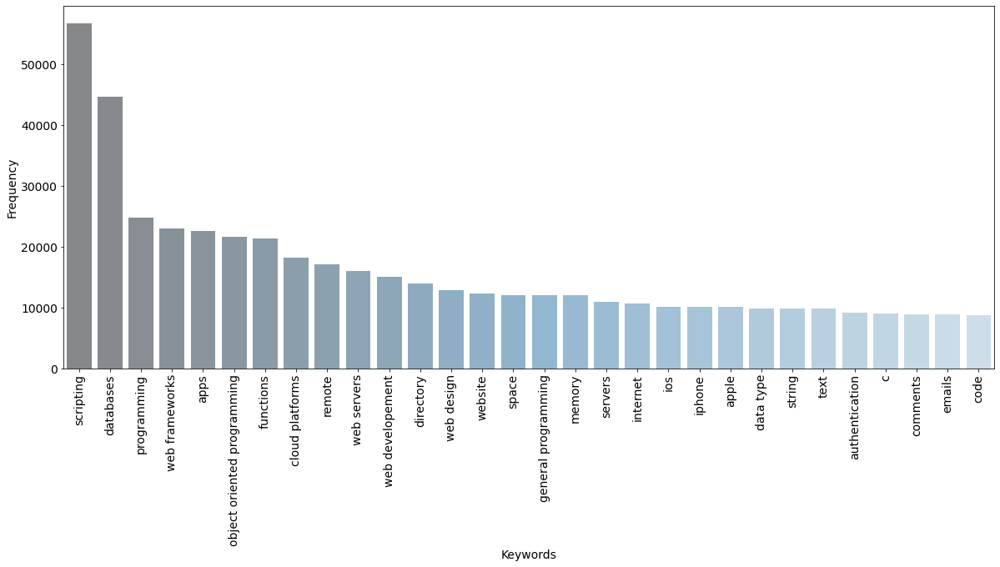

In [78]:
plt.figure(figsize=(20,8))
sns.barplot(x='word',y='freq',data=top_keywords[:30],alpha=0.6,palette='Blues_d')
plt.xticks(rotation=90,size=14)
plt.yticks(size=14)
plt.xlabel('Keywords',size=14)
plt.ylabel('Frequency',size=14)

Text(0, 0.5, 'Frequency')

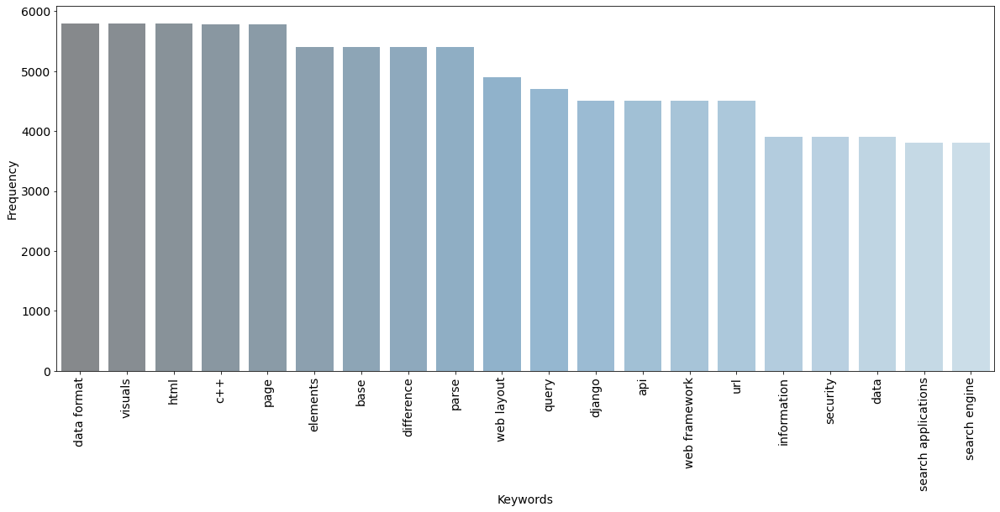

In [30]:
plt.figure(figsize=(20,8))
sns.barplot(x='word',y='freq',data=top_keywords[-20:],alpha=0.6,palette='Blues_d')
plt.xticks(rotation=90,size=14)
plt.yticks(size=14)
plt.xlabel('Keywords',size=14)
plt.ylabel('Frequency',size=14)

In [56]:
#Merging top keywords from train and test prediction results
top_keywords_combined = pd.concat([top_keywords_training,top_keywords_test],axis=1)
top_keywords_combined.columns = ['word_trian','freq_train','word_test','freq_test']
top_keywords_combined

,word_trian,freq_train,word_test,freq_test
0,scripting,48700,scripting,56800
1,databases,44486,databases,44746
2,programming,25681,programming,24857
3,web frameworks,20500,web frameworks,23000
4,apps,19969,apps,22640
5,object oriented programming,19414,object oriented programming,21672
6,functions,18244,functions,21300
7,cloud platforms,18000,cloud platforms,18200
8,directory,16400,remote,17143
9,remote,15931,web servers,15957


In [83]:
top_keywords_training = top_keywords_training.sort_values('word')
top_keywords_training = top_keywords_training.reset_index(drop=True)
top_keywords_test = top_keywords_test.sort_values('word')
top_keywords_test = top_keywords_test.reset_index(drop=True)
top_keywords_combined_ = pd.concat([top_keywords_training,top_keywords_test],axis=1)
top_keywords_combined.columns = ['word_train','freq_train','word_test','freq_test']
top_keywords_combined

,word_train,freq_train,word_test,freq_test
0,scripting,48700,scripting,56800
1,databases,44486,databases,44746
2,programming,25681,programming,24857
3,web frameworks,20500,web frameworks,23000
4,apps,19969,apps,22640
5,object oriented programming,19414,object oriented programming,21672
6,functions,18244,functions,21300
7,cloud platforms,18000,cloud platforms,18200
8,directory,16400,remote,17143
9,remote,15931,web servers,15957


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]), <a list of 20 Text major ticklabel objects>)

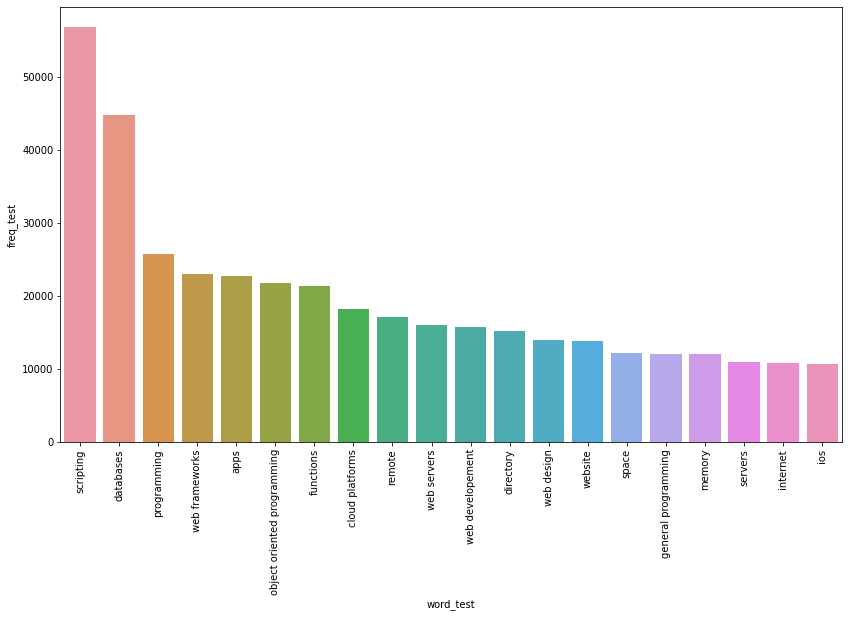

In [86]:
plt.figure(figsize=(14,8))
sns.barplot(data=top_keywords_combined,x='word_train',y='freq_train')
sns.barplot(data=top_keywords_combined,x='word_test',y='freq_test')
plt.xticks(rotation=90)

In [58]:
# Group top 5 sentences under each topic
df_top_doc = pd.DataFrame()
sent_topics_outdf_grpd = df_predictions_unseen.groupby('top_topic')
for i, grp in sent_topics_outdf_grpd:
    df_top_doc = pd.concat([df_top_doc, 
                                             grp.sort_values(['topic_dist'], ascending=[0]).head(1)], 
                                            axis=0)
# Reset Index    
df_top_doc.reset_index(drop=True, inplace=True)

# Format
#sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Text"]

# Show
df_top_doc.head(10)

,documents,top_topic,topic_dist,keywords
0,"['partition', 'windows', 'partition']",0,0.061321,"['object oriented programming', 'scripting', 'iphone', 'apple', 'ios', 'apps', 'c', 'object oriented programming']"
1,"['restrict', 'filesystem', 'access', 'cgi']",1,0.060185,"['pc', 'databases', 'servers', 'base', 'elements', 'difference', 'parse', 'data', 'information', 'security']"
2,"['apostrophe', 'cms', 'engine', 'creation']",2,0.061319,"['fies', 'directory', 'path', 'address', 'javascript', 'oracle', 'event', 'cloud platforms', 'programming', 'scripting', 'databases']"
3,"['java', 'generics', 'pass', 'issue']",3,0.062500,"['data structures', 'website', 'syntax', 'object oriented programming', 'scripting', 'emails', 'comments']"
4,"['declare', 'var', 'roslyn']",4,0.062499,"['string', 'data type', 'text', 'scripting', 'cloud platforms', 'programming', 'scripting', 'databases', 'support', 'issues', 'documentation']"
5,"['data', 'structure', 'okasaki']",5,0.060185,"['functions', 'scripting', 'search engine', 'search applications', 'database development']"
6,"['play', 'video', 'ios', 'center']",6,0.061321,"['apps', 'web design', 'string', 'data type', 'text', 'scripting', 'cloud platforms', 'programming', 'scripting', 'databases']"
7,"['javascript', 'date', 'string', 'age']",7,0.075891,"['access', 'display', 'session', 'software developement', 'databases', 'dataframes', 'tables']"
8,"['query', 'return', 'array']",8,0.059091,"['apps', 'django', 'web framework', 'pc', 'databases', 'servers', 'emails', 'comments']"
9,"['restore', 'page', 'computer', 'boot', 'wiki']",9,0.061321,"['database servers', 'web layout developement', 'object oriented programming', 'scripting', 'emails', 'comments']"


In [59]:
# Number of Documents for Each Topic
topic_counts = df_predictions_unseen['top_topic'].value_counts()

# Percentage of Documents for Each Topic
topic_contribution = round(topic_counts/topic_counts.sum(), 4)

# Topic Number and Keywords
topic_num_keywords = df_top_doc[['top_topic', 'keywords']]

# Concatenate Column wise
df_dominant_topics = pd.concat([topic_num_keywords, topic_counts, topic_contribution], axis=1)

# Change Column names
df_dominant_topics.columns = ['Dominant_Topic', 'Topic_Keywords', 'Num_Documents', 'Perc_Documents']

# Show
df_dominant_topics.head(10)

,Dominant_Topic,Topic_Keywords,Num_Documents,Perc_Documents
0,0,"['object oriented programming', 'scripting', 'iphone', 'apple', 'ios', 'apps', 'c', 'object oriented programming']",2600,0.0260
1,1,"['pc', 'databases', 'servers', 'base', 'elements', 'difference', 'parse', 'data', 'information', 'security']",2194,0.0219
2,2,"['fies', 'directory', 'path', 'address', 'javascript', 'oracle', 'event', 'cloud platforms', 'programming', 'scripting', 'databases']",1899,0.0190
3,3,"['data structures', 'website', 'syntax', 'object oriented programming', 'scripting', 'emails', 'comments']",2806,0.0281
4,4,"['string', 'data type', 'text', 'scripting', 'cloud platforms', 'programming', 'scripting', 'databases', 'support', 'issues', 'documentation']",3579,0.0358
5,5,"['functions', 'scripting', 'search engine', 'search applications', 'database development']",4712,0.0471
6,6,"['apps', 'web design', 'string', 'data type', 'text', 'scripting', 'cloud platforms', 'programming', 'scripting', 'databases']",2700,0.0270
7,7,"['access', 'display', 'session', 'software developement', 'databases', 'dataframes', 'tables']",3061,0.0306
8,8,"['apps', 'django', 'web framework', 'pc', 'databases', 'servers', 'emails', 'comments']",1290,0.0129
9,9,"['database servers', 'web layout developement', 'object oriented programming', 'scripting', 'emails', 'comments']",3097,0.0310


In [60]:
df_dominant_topics_test = df_dominant_topics.sort_values('Dominant_Topic').head(10)
df_dominant_topics_test = df_dominant_topics_test.reset_index(drop=True)
df_dominant_topics_test

,Dominant_Topic,Topic_Keywords,Num_Documents,Perc_Documents
0,0,"['object oriented programming', 'scripting', 'iphone', 'apple', 'ios', 'apps', 'c', 'object oriented programming']",2600,0.0260
1,1,"['pc', 'databases', 'servers', 'base', 'elements', 'difference', 'parse', 'data', 'information', 'security']",2194,0.0219
2,2,"['fies', 'directory', 'path', 'address', 'javascript', 'oracle', 'event', 'cloud platforms', 'programming', 'scripting', 'databases']",1899,0.0190
3,3,"['data structures', 'website', 'syntax', 'object oriented programming', 'scripting', 'emails', 'comments']",2806,0.0281
4,4,"['string', 'data type', 'text', 'scripting', 'cloud platforms', 'programming', 'scripting', 'databases', 'support', 'issues', 'documentation']",3579,0.0358
5,5,"['functions', 'scripting', 'search engine', 'search applications', 'database development']",4712,0.0471
6,6,"['apps', 'web design', 'string', 'data type', 'text', 'scripting', 'cloud platforms', 'programming', 'scripting', 'databases']",2700,0.0270
7,7,"['access', 'display', 'session', 'software developement', 'databases', 'dataframes', 'tables']",3061,0.0306
8,8,"['apps', 'django', 'web framework', 'pc', 'databases', 'servers', 'emails', 'comments']",1290,0.0129
9,9,"['database servers', 'web layout developement', 'object oriented programming', 'scripting', 'emails', 'comments']",3097,0.0310


In [61]:
df_dominant_topics_combined = pd.concat([df_dominant_topics_train,df_dominant_topics_test],axis=1)
df_dominant_topics_combined.columns = ['dominant_topic_train','topic_keywords_train','num_docs_train','perc_docs_train','dominant_topic_test','topic_keywords_test','num_docs_test','perc_docs_test']
df_dominant_topics_combined

,dominant_topic_train,topic_keywords_train,num_docs_train,perc_docs_train,dominant_topic_test,topic_keywords_test,num_docs_test,perc_docs_test
0,0,"['object oriented programming', 'scripting', 'base', 'elements', 'difference', 'parse', 'page', 'c++']",2778,0.0278,0,"['object oriented programming', 'scripting', 'iphone', 'apple', 'ios', 'apps', 'c', 'object oriented programming']",2600,0.0260
1,1,"['pc', 'databases', 'servers', 'object oriented programming', 'scripting', 'data format, login shells', 'visuals']",2236,0.0224,1,"['pc', 'databases', 'servers', 'base', 'elements', 'difference', 'parse', 'data', 'information', 'security']",2194,0.0219
2,2,"['fies', 'directory', 'path', 'address', 'html', 'web developement', 'web page', 'internet', 'object oriented programming', 'scripting']",4412,0.0441,2,"['fies', 'directory', 'path', 'address', 'javascript', 'oracle', 'event', 'cloud platforms', 'programming', 'scripting', 'databases']",1899,0.0190
3,3,"['data structures', 'website', 'syntax', 'query', 'databases', 'emails', 'comments']",4326,0.0433,3,"['data structures', 'website', 'syntax', 'object oriented programming', 'scripting', 'emails', 'comments']",2806,0.0281
4,4,"['string', 'data type', 'text', 'scripting', 'data', 'information', 'security', 'web frameworks']",1600,0.0160,4,"['string', 'data type', 'text', 'scripting', 'cloud platforms', 'programming', 'scripting', 'databases', 'support', 'issues', 'documentation']",3579,0.0358
5,5,"['functions', 'scripting', 'apps', 'web design', 'functions', 'general programming', 'memory', 'space']",3168,0.0317,5,"['functions', 'scripting', 'search engine', 'search applications', 'database development']",4712,0.0471
6,6,"['apps', 'web design', 'pc', 'databases', 'servers', 'query', 'databases']",2606,0.0261,6,"['apps', 'web design', 'string', 'data type', 'text', 'scripting', 'cloud platforms', 'programming', 'scripting', 'databases']",2700,0.0270
7,7,"['access', 'display', 'session', 'support', 'issues', 'documentation', 'programming', 'web servers']",2183,0.0218,7,"['access', 'display', 'session', 'software developement', 'databases', 'dataframes', 'tables']",3061,0.0306
8,8,"['apps', 'django', 'web framework', 'data format, login shells', 'visuals', 'virtual environment', 'remote', 'linux', 'git', 'frameworks']",2600,0.0260,8,"['apps', 'django', 'web framework', 'pc', 'databases', 'servers', 'emails', 'comments']",1290,0.0129
9,9,"['database servers', 'web layout developement', 'code', 'remote', 'source code', 'cloud platforms', 'programming', 'scripting', 'databases']",2673,0.0267,9,"['database servers', 'web layout developement', 'object oriented programming', 'scripting', 'emails', 'comments']",3097,0.0310


In [1]:
df_dominant_topics_combined

NameError: ignored